# Setting

## Library

In [1]:
import pandas as pd
import numpy as np
import math

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import random
import os
from tqdm.notebook import tqdm

In [4]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [5]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score # 정확도
from sklearn.metrics import precision_score # 정밀도
from sklearn.metrics import recall_score # 재현율
from sklearn.metrics import f1_score # F1-Score
from sklearn.metrics import confusion_matrix

## Seed

In [6]:
def my_seed_everywhere(seed):
    random.seed(seed) # random
    np.random.seed(seed) # numpy
    os.environ["PYTHONHASHSEED"] = str(seed) # os
    print(f'고정된 Seed : {seed}')

In [7]:
my_seed_everywhere(42)

고정된 Seed : 42


# Data Set

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
path_file = '/content/drive/MyDrive/UNIST/AICP/data/dynmom_dat.csv'

df = pd.read_csv(path_file)

# Preprocessing

In [10]:
def preprocessing(data, used=None):
  # 'DATE'를 칼럼 대신 인덱스로 사용
  data.index = data['DATE']
  data = data.drop(columns='DATE')
  print("'DATE'를 칼럼 대신 인덱스로 사용")

  # 결측치 제거 및 모델 학습에 불필요한 칼럼 제거
  data = data.dropna()
  data = data.drop(columns=['winner', 'loser', 'form_date'])
  print("결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')")

  if used != None:
    used += ['wml']
    D = ', '.join(used)
    data = data[used]
    print(f"훈련에 사용되는 변수 들 : {D}")

  return data

In [11]:
df = preprocessing(df,
                   used=['mvol_t_1', 'mvol_t_2', 'mvol_t_3', 'mvol_t_4' , 'mvol_t_5', 'mvol_t_6', 'cum_winner', 'cum_loser'])

'DATE'를 칼럼 대신 인덱스로 사용
결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')
훈련에 사용되는 변수 들 : mvol_t_1, mvol_t_2, mvol_t_3, mvol_t_4, mvol_t_5, mvol_t_6, cum_winner, cum_loser, wml


In [12]:
def normal_wml(df):
  print("'wml'이 양수면 1 & 음수면 0")
  print("Output : 'Preprocessed_Data' & 'WML'")
  print()

  cond_wml = (df['wml']>=0)
  df.loc[cond_wml, 'pos_wml'] = 1
  df.loc[~cond_wml, 'pos_wml'] = 0
  WML = df[['wml']]

  df.drop(columns=['wml'], inplace=True)

  POS_WML = df['pos_wml'].value_counts()
  print(f'Ratio : {POS_WML[0]/POS_WML[1]}')
  print(POS_WML)

  return df, WML

In [13]:
dynmom, WML = normal_wml(df)

'wml'이 양수면 1 & 음수면 0
Output : 'Preprocessed_Data' & 'WML'

Ratio : 0.5634379263301501
1.0    733
0.0    413
Name: pos_wml, dtype: int64


# Modeling

In [14]:
def Roling_Windows(data, window_size, method, model, model_name, plot=True, plot_feature=True):

  # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
  result_dict = {
    'TRAIN_START_DATE':[],
    'TRAIN_END_DATE':[],
    'TEST_DATE':[],
    'Actual_POS_WML':[],
    f'{model_name}_PRED_POS_WML':[],
    f'{model_name}_PROB_POS_WML':[]
  }

  df_feature = pd.DataFrame()

  # 모델 학습이 종료되는 지점 설정
  end = data.shape[0] - window_size

  print('*'*50)
  print(f'\n{model_name} Model의 Rolling {method} Window를 실행합니다\n')
  print('설정된 Model의 하이퍼파리미터 : \n')
  for p, v in zip(model.get_params(deep=True).keys(), model.get_params(deep=True).values()):
    print(f'   {p} : {v}')
  print()
  print('*'*50)

  for i in tqdm(range(end)):

    # 모델 학습 중지
    if i == end:
      print('Prediction using machine learning has ended.')
      break
    
    # Rolling Fixed Window
    if method == 'Fixed':
      MODEL = model
      train = data.iloc[0+i:window_size+i]

    # Rolling Expanding Window
    elif method == 'Expanding':
      MODEL = model
      train = data.iloc[0:window_size+i]
    
    # 'method' 잘못입력한 경우
    else:
      print("Make sure to set the method to either 'Fixed' or 'Expanding'.")
      break
    
    # 테스트 데이터 설정
    test = data.iloc[[window_size+i]]

    # Features와 Target 구분
    X_train = train.drop(columns=['pos_wml'])
    y_train = train['pos_wml']

    X_test = test.drop(columns=['pos_wml'])
    y_test = test['pos_wml'] 

    # 모델 학습 및 추론
    MODEL.fit(X_train, y_train)
    pred_test = MODEL.predict(X_test)
    prob_test = MODEL.predict_proba(X_test)

    # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
    result_dict['TRAIN_START_DATE'].append(train.index[0])
    result_dict['TRAIN_END_DATE'].append(train.index[-1])
    result_dict['TEST_DATE'].append(test.index[0])

    result_dict['Actual_POS_WML'].append(list(y_test)[0])
    result_dict[f'{model_name}_PRED_POS_WML'].append(pred_test[0])
    result_dict[f'{model_name}_PROB_POS_WML'].append(prob_test[0][-1])

    # 트리 기반 모델 (사이킷런)의 Feature Importance 정보 수집
    feature_importances = MODEL.feature_importances_
    df_ft_importance = pd.DataFrame(feature_importances, index = X_train.columns).T
    df_ft_importance.index = y_test.index
    df_feature = pd.concat([df_feature, df_ft_importance])

  result = pd.DataFrame(result_dict)
  result.index = df_feature.index

  result = pd.concat([result, df_feature], axis=1)
  result = result.set_index('TEST_DATE')
  
  # 모델 성능 시각화
  if plot == True:
    plot_result(result, method, model_name)
  
  # 모델의 변수 중요도 시각화
  if plot_feature == True:
    plot_feature_importances(result, model_name)
    print()

  # 학습 및 테스트 데이터 정보, 실제값과 예측값 정보, 변수 중요도 정보
  return result

In [15]:
def plot_result(data, method, model_name):
  print('\nPerformance results of the model\n')

  # Confusion Matrix & etc
  print(classification_report(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML']))

  # Accuracy, Precision, Recall, F1 Score
  accuracy = accuracy_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  precision = precision_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  recall = recall_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  F1_score = f1_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])

  print(f'\naccuracy : {accuracy}')
  print(f'\nprecision : {precision}')
  print(f'\nrecall : {recall}')
  print(f'\nF1-Score : {F1_score}\n')
  
  # Visualization Confusion Matrix
  confusion = confusion_matrix(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  sns.heatmap(confusion, annot=True, fmt='g')
  plt.title(f'Performance results {method} of the {model_name} model')
  
  plt.show()

In [16]:
def plot_feature_importances(data, model_name):

  data = data.drop(columns=['TRAIN_START_DATE', 'TRAIN_END_DATE', 'Actual_POS_WML',
                           f'{model_name}_PRED_POS_WML', f'{model_name}_PROB_POS_WML'])

  print('\nFeature Importance of the model\n')

  # 날짜 별 Feature Importance 변화 추이
  plt.figure(figsize=(15, 5))
  for col in data.columns:

    sns.lineplot(data=data,
                x=data.index,
                y=col,
                label=col,
                alpha=0.3)
    
    plt.title('Feature importances using MDI')
    plt.xlabel('DATE')
    plt.ylabel('Mean decrease in impurity')
    plt.xticks([data.index[i] for i in range(0,len(data.index), 12)])
    plt.tick_params(axis='x',
                      direction='out',
                      labelrotation=45,
                      length=1,
                      pad=10,
                      labelsize=5,
                      width=0.1)
  plt.show()

  # 각 변수 별 Feature Importance 통계값
  MEAN = display_feature_importance(data, method='mean')
  MAX = display_feature_importance(data, method='max')
  MIN = display_feature_importance(data, method='min')

  plt.figure(figsize=(15, 5))
  sns.barplot(data=MEAN,
              y=MEAN.index,
              x='mean_Feature_Importance')

  plt.show()
  print()

  FEATURE_IMPORTANCE = pd.concat([MEAN, MAX, MIN], axis=1)
  display(FEATURE_IMPORTANCE)

In [17]:
def display_feature_importance(data, method):
       
    feature_dict = {}
    for col in data.columns:
      if method=='mean':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].mean())

      if method=='max':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].max())
      
      if method=='min':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].min())
    
    feature_df = pd.DataFrame(feature_dict).T
    feature_df.columns = [method+'_'+'Feature_Importance']
    feature_df=feature_df.sort_values(by=method+'_'+'Feature_Importance', ascending=False)

    return feature_df

In [18]:
def slice_feature_importance(data, num, method, model_name):

  if type(num) != bool:
    division = int(data.shape[0]/num)
    
    for i in range(num):

      if i == num-1:
        sliced_data = data.iloc[i*division:]

      else:
        sliced_data = data.iloc[i*division:(i+1)*division]

      start = sliced_data.index[0]
      end = sliced_data.index[-1]

      print()
      print('*'*50)
      print(f'\nDATE : {start} ~ {end}\n')
      print('*'*50)
      print()
      
      plot_result(sliced_data, method, model_name)
      plot_feature_importances(sliced_data, model_name)
  
  else:
    start = input('Start Date (ex: 20200131): ')
    end = input('Start Date (ex: 20221230): ')
    print('*'*50)
    print(f'\nDate : {start} ~ {end}\n')
    print('*'*50)
    print()

    sliced_data = data.loc[start:end]
    plot_result(sliced_data, method, model_name)
    plot_feature_importances(sliced_data)

In [19]:
def cumm_return_by_dynamic(data, wml, weight, A0_P1, A1_P0,  plot=True):

  start_index = data.index[0]
  wml = wml.loc[start_index:]

  df = pd.DataFrame(wml['wml'] * data[weight])
  df.columns = ['cum_return']
  df['cum_return'] = (1 + df.cum_return).cumprod() - 1 
  
  S = df['cum_return'].mean()/df['cum_return'].std()

  print('Sharpe Ratio : {:0.5f}\n'.format(S))

  print('최근 누적 수익률\n')
  latly_10 = df.sort_index(ascending=False).head(5)
  for i, r in zip(latly_10.index, latly_10['cum_return']):
    i = str(i)
    print('  {}년-{}월 -> {:0.2f}'.format(i[:4], i[4:6], r))

  print('\n누적 수익률 가장 높았던 순간 Top 10\n')
  top_10 = df.sort_values(by='cum_return', ascending=False).head(10)
  rank = 1
  for i, r in zip(top_10.index, top_10['cum_return']):
    i = str(i)
    print('  {}등 : {}년-{}월 -> {:0.2f}'.format(rank, i[:4], i[4:6], r))
    rank += 1
  print()

  TEST_WML = wml.copy()
  TEST_WML['wml'] = (1 + TEST_WML.wml).cumprod() - 1
  TEST_WML.columns = ['cum_return'] 

  if plot == True:

    plt.figure(figsize=(13, 6))
    sns.lineplot(data=df, x=df.index, y=df['cum_return'], label='With_ML')
    sns.lineplot(data=TEST_WML, x=TEST_WML.index, y=TEST_WML['cum_return'], label='Original')
    plt.xticks([df.index[i] for i in range(0,len(df.index), 12)])
    plt.tick_params(axis='x',
                    direction='out',
                    labelrotation=45,
                    length=1,
                    pad=10,
                    labelsize=5,
                    width=5)
    for i in A0_P1:
      plt.vlines(i, -80000, 0, color='pink', linewidth=0.4, alpha=1)

    for i in A1_P0:
      plt.vlines(i, 80000, 0, color='pink', linewidth=0.4, alpha=1)

    plt.legend(fontsize=10)
    plt.show() 

  return df

In [20]:
def What_Pred(data, WML, model_name):

  start_index = data.index[0]
  WML = WML.loc[start_index:]
  WML.index.name = 'TEST_DATE'

  Q1 = WML.quantile(0.25)
  Q3 = WML.quantile(0.75)
  IQR = Q3 - Q1

  Upper = Q3 + (1.5*IQR)
  Lower = Q1 - (1.5*IQR)

  print('\nIQR 기준 WML 이상치 (Maximum 미만) 개수\n')

  cond_U = (WML['wml']>Upper[0])  
  WML_U = WML.loc[cond_U]
  
  print(f'Number of Outlier by IQR (Maximum) : {WML_U.shape[0]}')
  print(f'Maximum by IQR : {Upper[0]}')
  print(f"Max Outlier : {WML_U['wml'].max()}")
  print(f"Min Outlier : {WML_U['wml'].min()}")

  Result = pd.concat([data, WML],axis=1)
  Result = Result[['Actual_POS_WML', f'{model_name}_PRED_POS_WML', 'wml']]

  cond_1 = (Result['Actual_POS_WML'] == 1) & (Result[f'{model_name}_PRED_POS_WML'] == 1)
  R_1 = Result.loc[cond_1]
  print('\nACTUAL = PRED = 1\n')
  sns.boxplot(data=R_1, x='wml')
  plt.show()
  display(R_1[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  print('\nIQR 기준 WML 이상치 (Minimum 미만) 개수\n')

  cond_L = (WML['wml']<Lower[0])  
  WML_L = WML.loc[cond_L]
  
  print(f'Number of Outlier by IQR (Minimum) : {WML_L.shape[0]}')
  print(f'Minimun by IQR : {Lower[0]}')
  print(f"Max Outlier : {WML_L['wml'].max()}")
  print(f"Min Outlier : {WML_L['wml'].min()}")

  Result = pd.concat([data, WML],axis=1)
  Result = Result[['Actual_POS_WML', f'{model_name}_PRED_POS_WML', 'wml']]

  cond_0 = (Result['Actual_POS_WML'] == 0) & (Result[f'{model_name}_PRED_POS_WML'] == 0)
  R_0 = Result.loc[cond_0]
  print('\nACTUAL = PRED = 0\n')
  sns.boxplot(data=R_0, x='wml')
  plt.show()
  display(R_0[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  cond_0_1 = (Result['Actual_POS_WML'] == 0) & (Result[f'{model_name}_PRED_POS_WML'] == 1)
  R_0_1 = Result.loc[cond_0_1]
  print('\nACTUAL = 0 &  PRED = 1\n')
  sns.boxplot(data=R_0_1, x='wml')
  plt.show()
  sns.barplot(data=R_0_1.sort_values(by='wml', ascending=True), x=R_0_1.index, y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  display(R_0_1[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  cond_1_0 = (Result['Actual_POS_WML'] == 1) & (Result[f'{model_name}_PRED_POS_WML'] == 0)
  R_1_0 = Result.loc[cond_1_0]
  print('\nACTUAL = 1 &  PRED = 0\n')
  sns.boxplot(data=R_1_0, x='wml')
  plt.show()
  sns.barplot(data=R_1_0.sort_values(by='wml', ascending=True), x=R_1_0.index, y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  display(R_1_0[['wml']].describe().T)

  return list(R_0_1.index), list(R_1_0.index)

## Rolling Fixed Windows

### Random Forest

In [21]:
RDF_Param={} 
RDF = RandomForestClassifier(**RDF_Param, random_state=42)

**************************************************

RDF Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   bootstrap : True
   ccp_alpha : 0.0
   class_weight : None
   criterion : gini
   max_depth : None
   max_features : sqrt
   max_leaf_nodes : None
   max_samples : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_jobs : None
   oob_score : False
   random_state : 42
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.28      0.34       316
         1.0       0.68      0.81      0.74       590

    accuracy                           0.62       906
   macro avg       0.56      0.54      0.54       906
weighted avg       0.59      0.62      0.60       906


accuracy : 0.6247240618101545

precision : 0.6770538243626062

recall : 0.8101694915254237

F1-Score : 0.7376543209876543



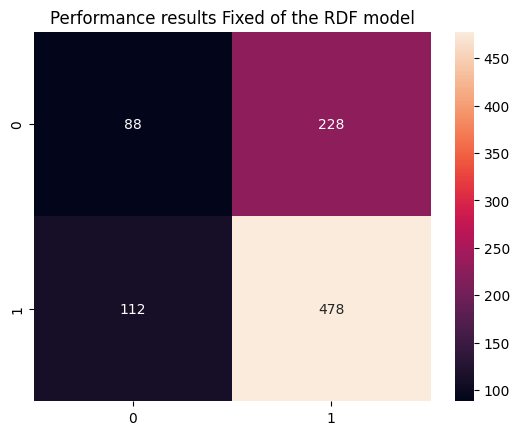


Feature Importance of the model



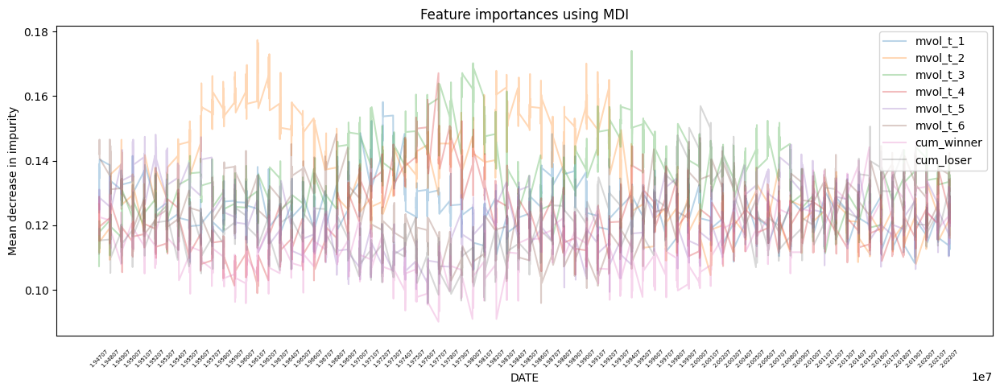

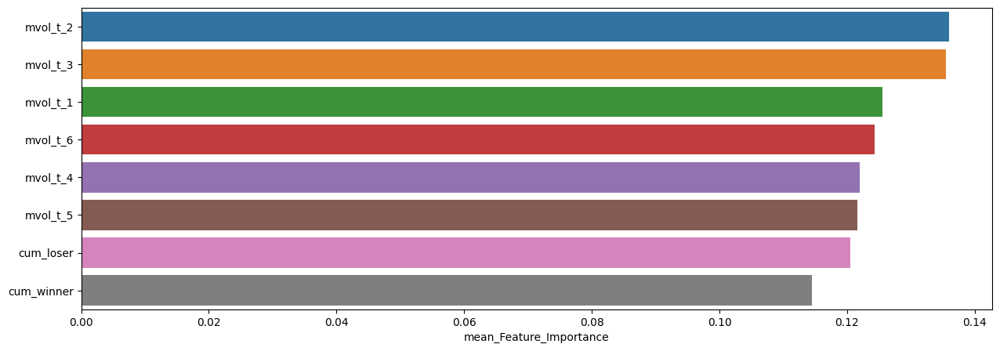

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.135942,0.177371,0.104547
mvol_t_3,0.135530,0.174074,0.107328
mvol_t_1,0.125570,0.158182,0.106345
mvol_t_6,0.124354,0.148251,0.095917
mvol_t_4,0.121937,0.167125,0.098983
mvol_t_5,0.121658,0.148102,0.095792
cum_loser,0.120480,0.156932,0.095900
cum_winner,0.114529,0.146038,0.090129


In [22]:
Fixed_RDF_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=RDF, # 사용할 모델
                                  model_name='RDF', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.21      0.26        75
         1.0       0.67      0.79      0.73       151

    accuracy                           0.60       226
   macro avg       0.51      0.50      0.49       226
weighted avg       0.56      0.60      0.57       226


accuracy : 0.6017699115044248

precision : 0.6703910614525139

recall : 0.7947019867549668

F1-Score : 0.7272727272727273



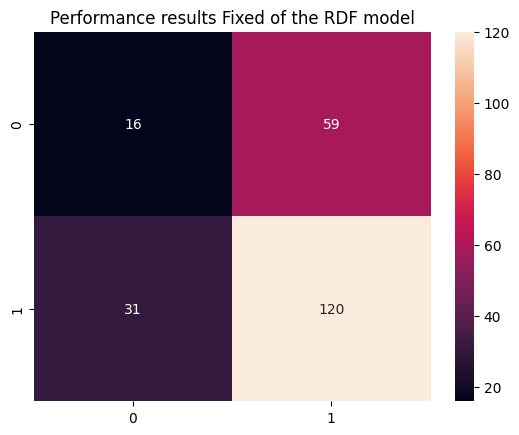


Feature Importance of the model



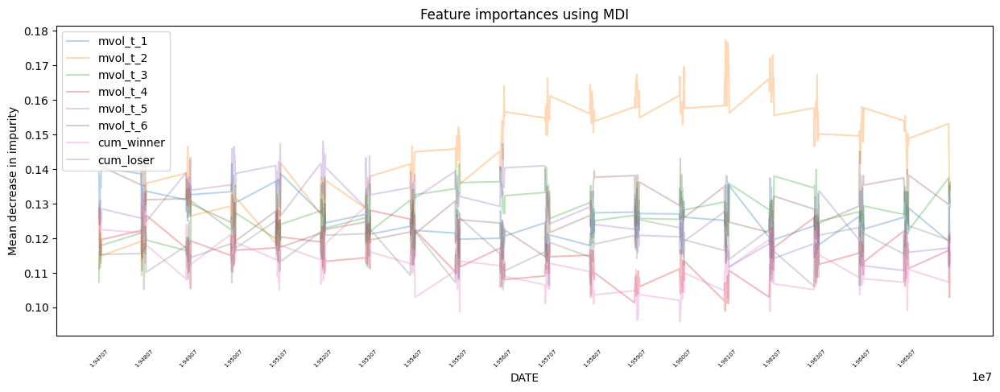

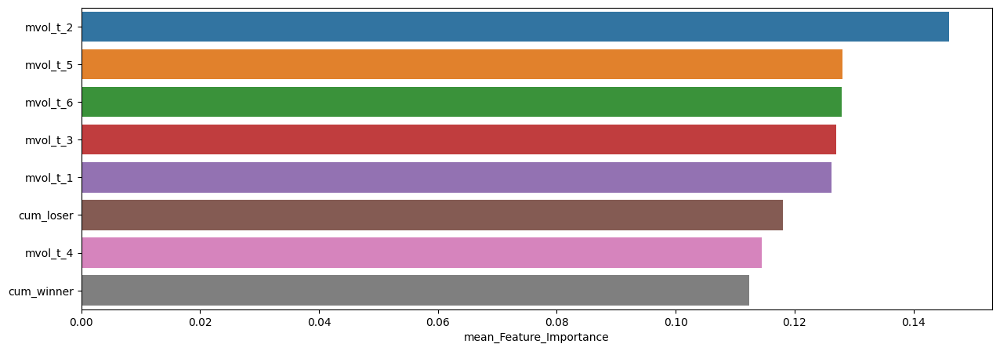

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.145957,0.177371,0.109286
mvol_t_5,0.128047,0.148102,0.106429
mvol_t_6,0.127950,0.146597,0.111049
mvol_t_3,0.126974,0.141480,0.107328
mvol_t_1,0.126274,0.141488,0.108605
cum_loser,0.118021,0.129997,0.105111
mvol_t_4,0.114463,0.131089,0.098983
cum_winner,0.112314,0.130713,0.095845



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.50      0.31      0.38        75
         1.0       0.71      0.85      0.77       151

    accuracy                           0.67       226
   macro avg       0.61      0.58      0.58       226
weighted avg       0.64      0.67      0.64       226


accuracy : 0.668141592920354

precision : 0.7111111111111111

recall : 0.847682119205298

F1-Score : 0.7734138972809668



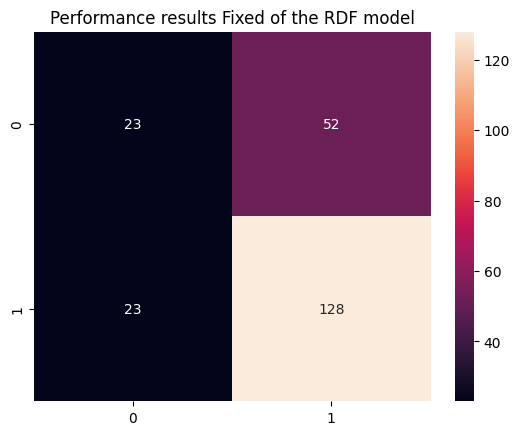


Feature Importance of the model



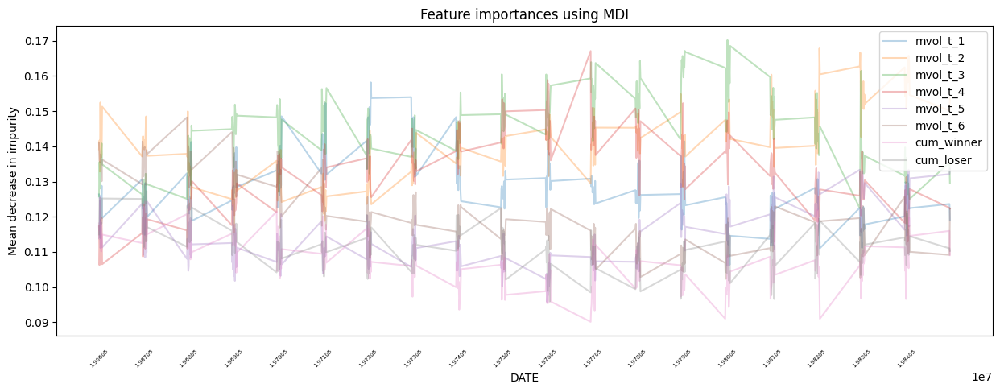

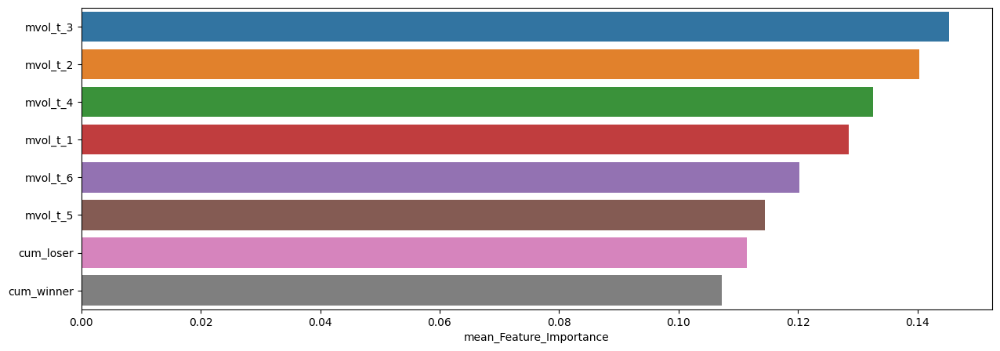

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_3,0.145244,0.170216,0.122432
mvol_t_2,0.140357,0.167862,0.115520
mvol_t_4,0.132606,0.167125,0.106277
mvol_t_1,0.128538,0.158182,0.106345
mvol_t_6,0.120167,0.148251,0.102355
mvol_t_5,0.114506,0.133655,0.095792
cum_loser,0.111374,0.129164,0.095900
cum_winner,0.107209,0.125602,0.090129



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.24      0.30        70
         1.0       0.71      0.84      0.77       156

    accuracy                           0.65       226
   macro avg       0.56      0.54      0.54       226
weighted avg       0.62      0.65      0.63       226


accuracy : 0.6548672566371682

precision : 0.7119565217391305

recall : 0.8397435897435898

F1-Score : 0.7705882352941177



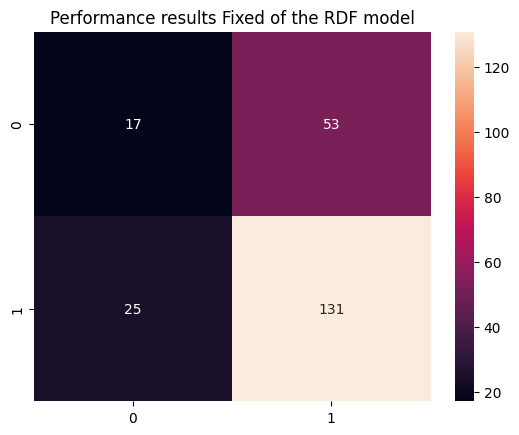


Feature Importance of the model



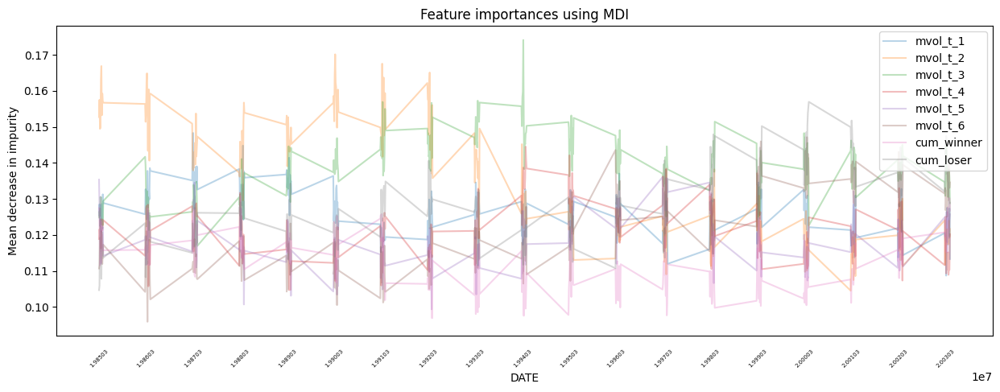

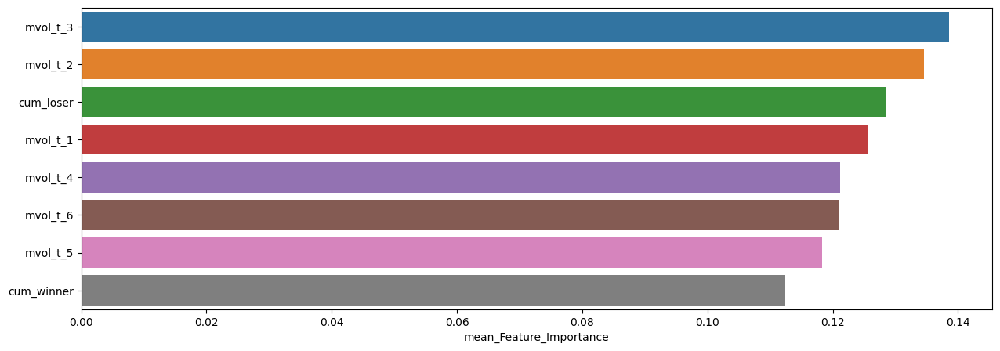

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_3,0.138534,0.174074,0.114034
mvol_t_2,0.134527,0.170102,0.104547
cum_loser,0.128429,0.156932,0.104700
mvol_t_1,0.125734,0.148295,0.108719
mvol_t_4,0.121184,0.144506,0.104707
mvol_t_6,0.120873,0.147121,0.095917
mvol_t_5,0.118273,0.136053,0.099370
cum_winner,0.112447,0.130835,0.096899



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.49      0.33      0.40        96
         1.0       0.61      0.75      0.67       132

    accuracy                           0.57       228
   macro avg       0.55      0.54      0.53       228
weighted avg       0.56      0.57      0.56       228


accuracy : 0.5745614035087719

precision : 0.6073619631901841

recall : 0.75

F1-Score : 0.6711864406779662



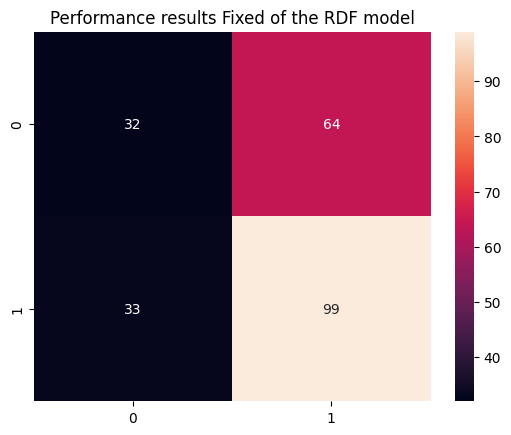


Feature Importance of the model



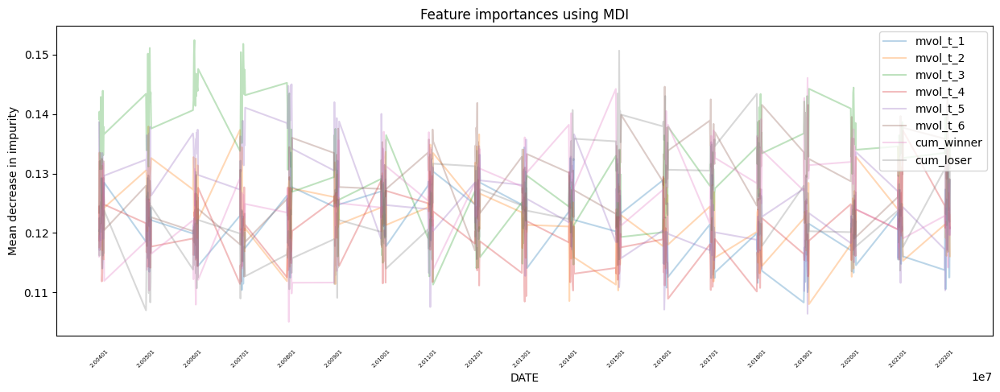

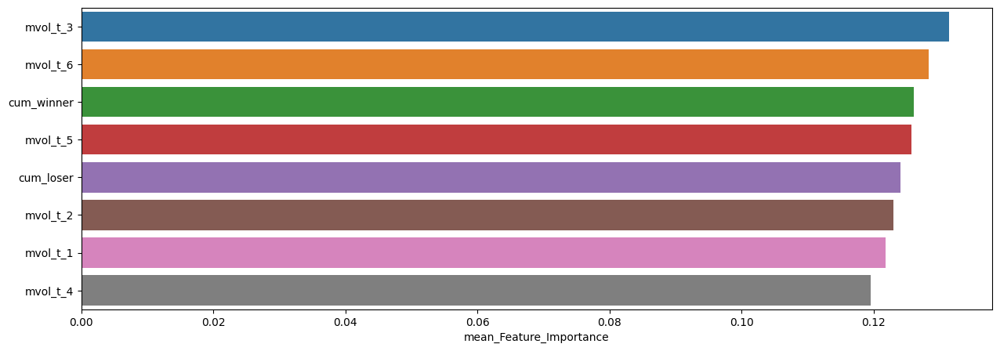

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_3,0.131404,0.152399,0.111335
mvol_t_6,0.128390,0.144578,0.112668
cum_winner,0.126044,0.146038,0.105084
mvol_t_5,0.125772,0.144981,0.106438
cum_loser,0.124066,0.150624,0.107013
mvol_t_2,0.123043,0.137896,0.108053
mvol_t_1,0.121767,0.134377,0.108327
mvol_t_4,0.119515,0.137198,0.108483


In [23]:
slice_feature_importance(Fixed_RDF_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'RDF') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



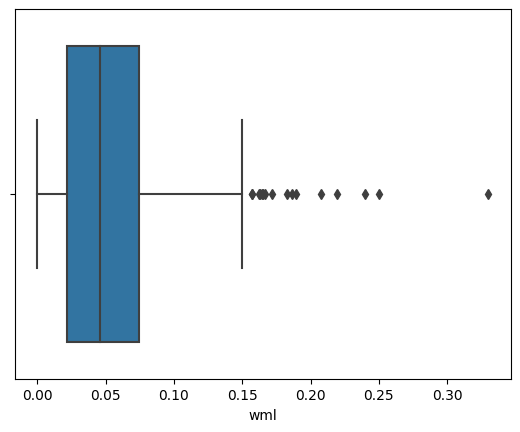

,count,mean,std,min,25%,50%,75%,max
wml,478.0,0.05463,0.04464,0.000007,0.021907,0.045848,0.074395,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



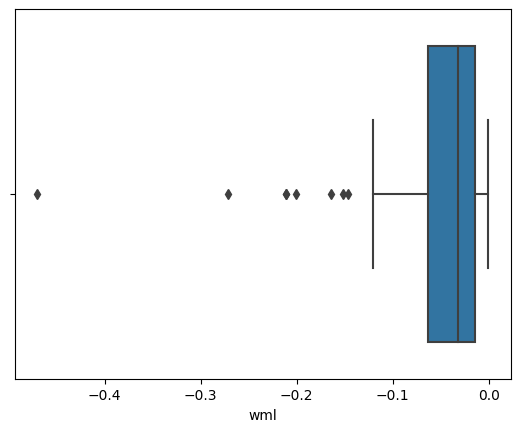

,count,mean,std,min,25%,50%,75%,max
wml,88.0,-0.054585,0.069086,-0.469903,-0.06288,-0.031979,-0.01413,-0.000506



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



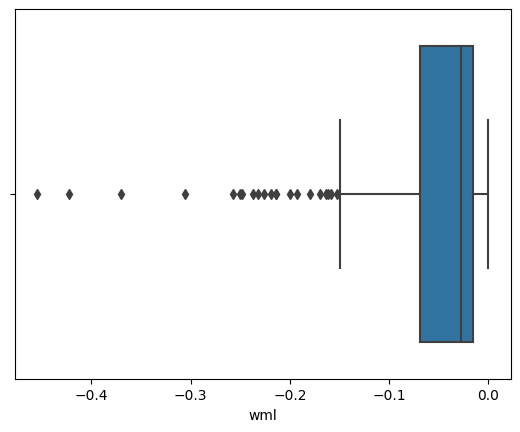

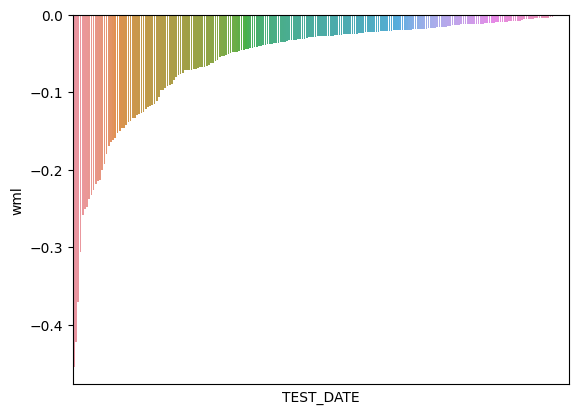

,count,mean,std,min,25%,50%,75%,max
wml,228.0,-0.056977,0.072186,-0.454349,-0.069073,-0.027505,-0.015243,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



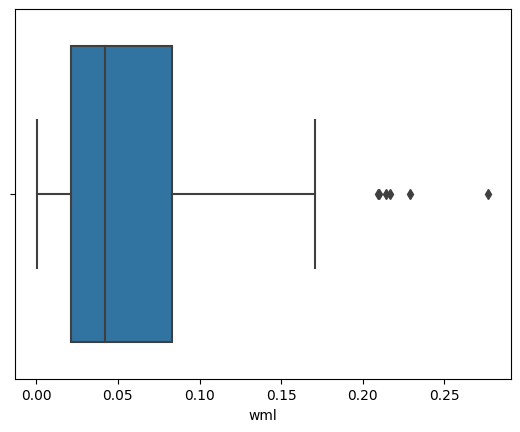

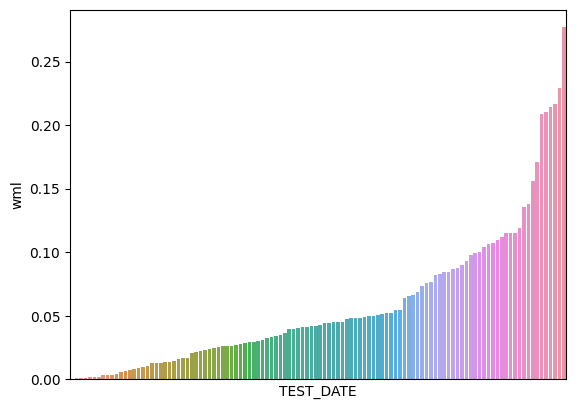

,count,mean,std,min,25%,50%,75%,max
wml,112.0,0.057894,0.055277,0.000692,0.02116,0.042305,0.083075,0.276912


In [24]:
RDF_A0_P1, RDF_A1_P0 = What_Pred(Fixed_RDF_Result, WML, 'RDF')

Sharpe Ratio : 0.69193

최근 누적 수익률

  2022년-12월 -> 51879.84
  2022년-11월 -> 51879.84
  2022년-10월 -> 51879.84
  2022년-09월 -> 45938.83
  2022년-08월 -> 45938.83

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 90201.35
  2등 : 2008년-11월 -> 82265.35
  3등 : 2009년-01월 -> 80318.19
  4등 : 2008년-12월 -> 80318.19
  5등 : 2002년-09월 -> 76894.12
  6등 : 2008년-10월 -> 75019.03
  7등 : 2001년-09월 -> 71325.63
  8등 : 2008년-09월 -> 70822.76
  9등 : 2002년-07월 -> 66958.37
  10등 : 2002년-06월 -> 66958.37



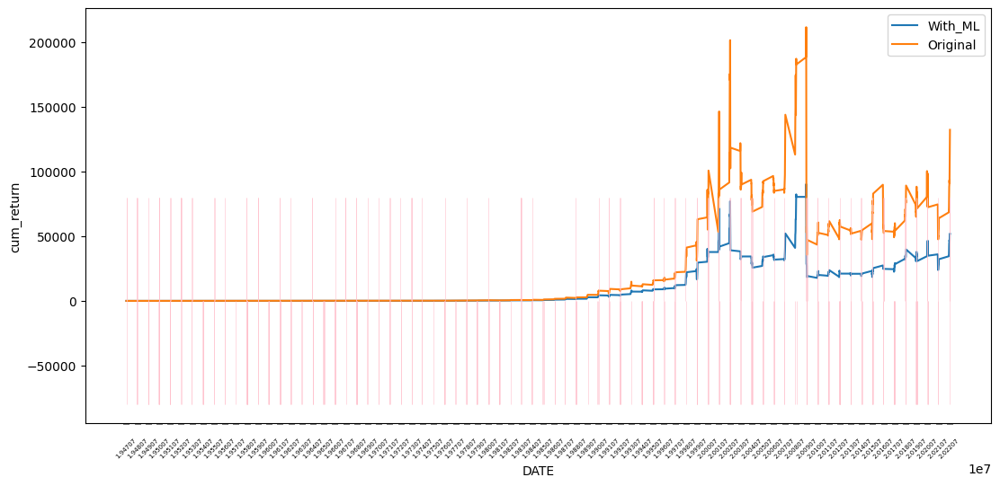

In [25]:
RDF_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_RDF_Result,
                                                 WML,
                                                 'RDF_PRED_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.74870

최근 누적 수익률

  2022년-12월 -> 8850.61
  2022년-11월 -> 8433.48
  2022년-10월 -> 8318.27
  2022년-09월 -> 7664.04
  2022년-08월 -> 7327.18

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 11352.30
  2등 : 2008년-11월 -> 10783.96
  3등 : 2009년-01월 -> 10657.22
  4등 : 2008년-12월 -> 10572.09
  5등 : 2008년-10월 -> 9992.43
  6등 : 2008년-09월 -> 9621.84
  7등 : 2008년-06월 -> 9592.55
  8등 : 2002년-09월 -> 9457.54
  9등 : 2008년-07월 -> 9058.36
  10등 : 2008년-08월 -> 8996.89



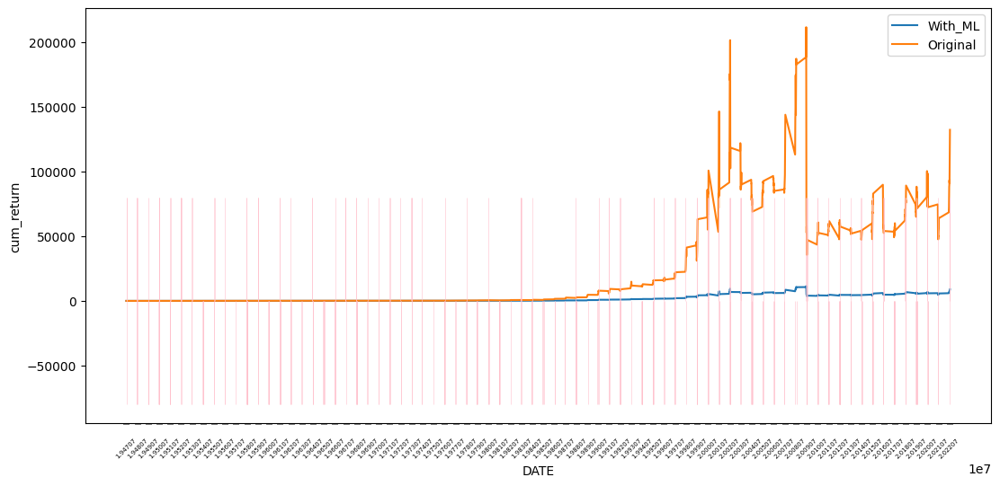

In [26]:
RDF_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_RDF_Result,
                                                 WML,
                                                 'RDF_PROB_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

### Grdient Boosting

In [27]:
GBC_Param = {}
GBC = GradientBoostingClassifier(*GBC_Param, random_state=42)

**************************************************

GBC Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   ccp_alpha : 0.0
   criterion : friedman_mse
   init : None
   learning_rate : 0.1
   loss : log_loss
   max_depth : 3
   max_features : None
   max_leaf_nodes : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_iter_no_change : None
   random_state : 42
   subsample : 1.0
   tol : 0.0001
   validation_fraction : 0.1
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.30      0.34       316
         1.0       0.67      0.76      0.71       590

    accuracy                           0.60       906
   macro avg       0.54      0.53      0.53       906
weighted avg       0.58      0.60      0.58       906


accuracy : 0.6004415011037527

precision : 0.6701492537313433

recall : 0.7610169491525424

F1-Score : 0.7126984126984127



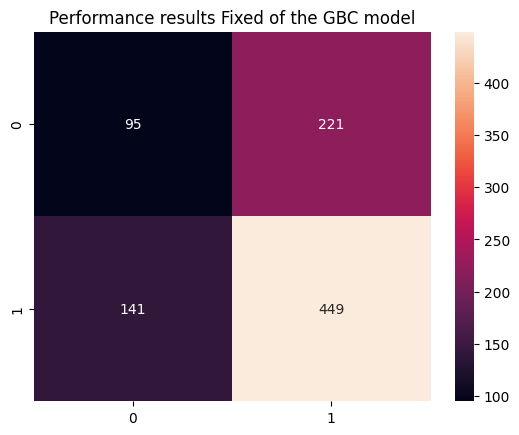


Feature Importance of the model



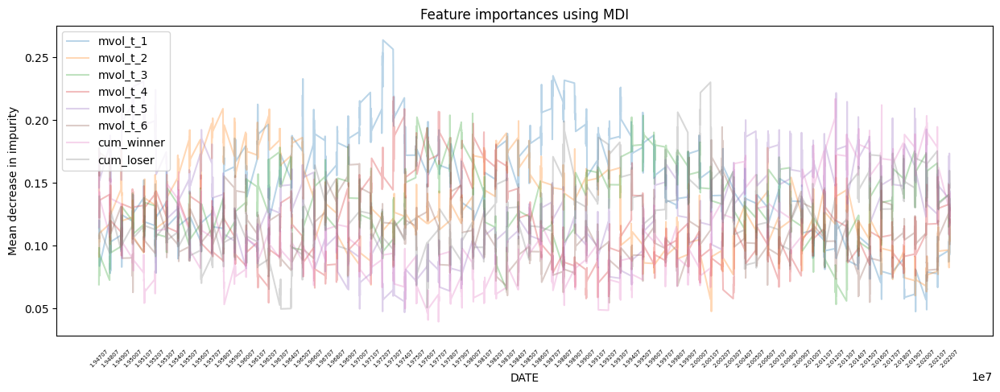

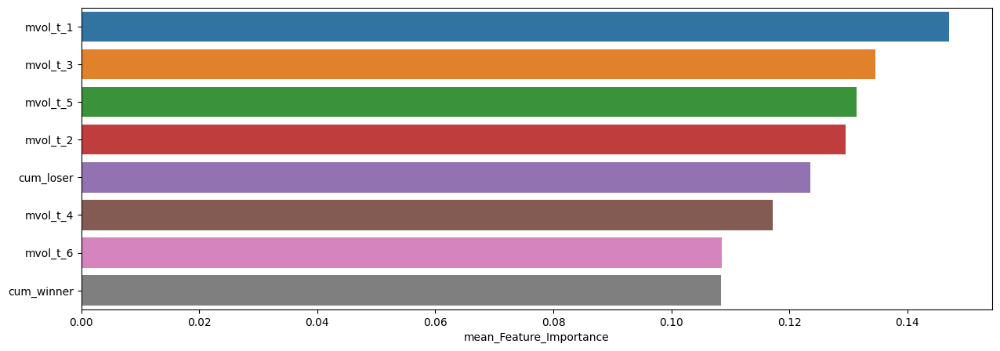

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.147019,0.263645,0.047399
mvol_t_3,0.134506,0.205201,0.053133
mvol_t_5,0.131382,0.230790,0.046760
mvol_t_2,0.129459,0.208968,0.047523
cum_loser,0.123564,0.230020,0.049530
mvol_t_4,0.117162,0.218457,0.054426
mvol_t_6,0.108514,0.194323,0.054464
cum_winner,0.108393,0.216827,0.039283


In [28]:
Fixed_GBC_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=GBC, # 사용할 모델
                                  model_name='GBC', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.36      0.29      0.32        75
         1.0       0.68      0.74      0.71       151

    accuracy                           0.59       226
   macro avg       0.52      0.52      0.52       226
weighted avg       0.57      0.59      0.58       226


accuracy : 0.5929203539823009

precision : 0.6787878787878788

recall : 0.7417218543046358

F1-Score : 0.7088607594936708



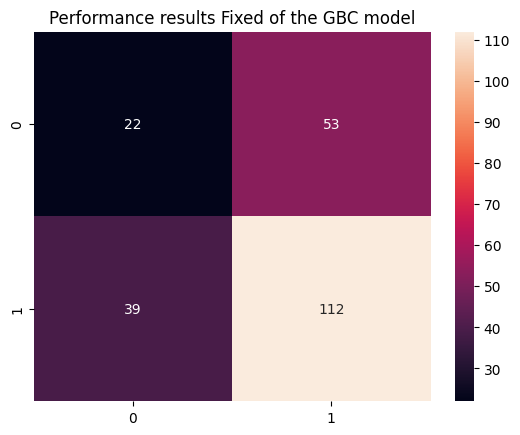


Feature Importance of the model



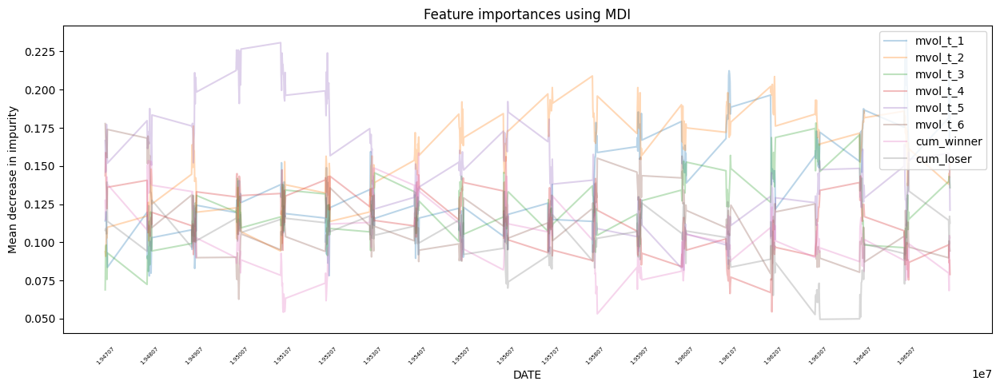

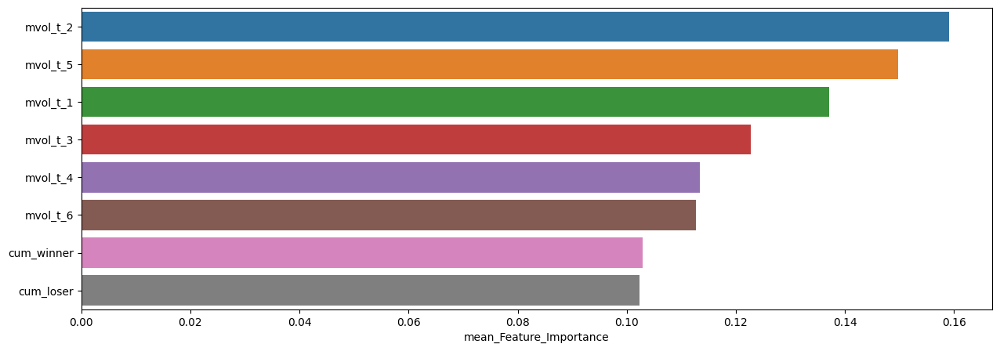

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.159036,0.208968,0.090833
mvol_t_5,0.149728,0.230790,0.081727
mvol_t_1,0.137141,0.232721,0.077978
mvol_t_3,0.122745,0.178167,0.068856
mvol_t_4,0.113419,0.158719,0.054426
mvol_t_6,0.112688,0.177745,0.062702
cum_winner,0.102916,0.158457,0.053111
cum_loser,0.102328,0.151937,0.049530



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.46      0.33      0.39        75
         1.0       0.71      0.81      0.76       151

    accuracy                           0.65       226
   macro avg       0.59      0.57      0.57       226
weighted avg       0.63      0.65      0.63       226


accuracy : 0.6504424778761062

precision : 0.7093023255813954

recall : 0.8079470198675497

F1-Score : 0.7554179566563468



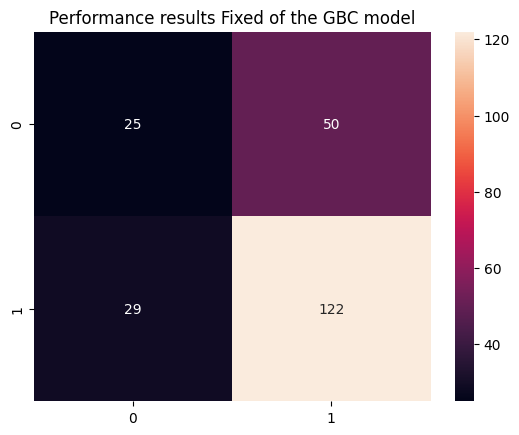


Feature Importance of the model



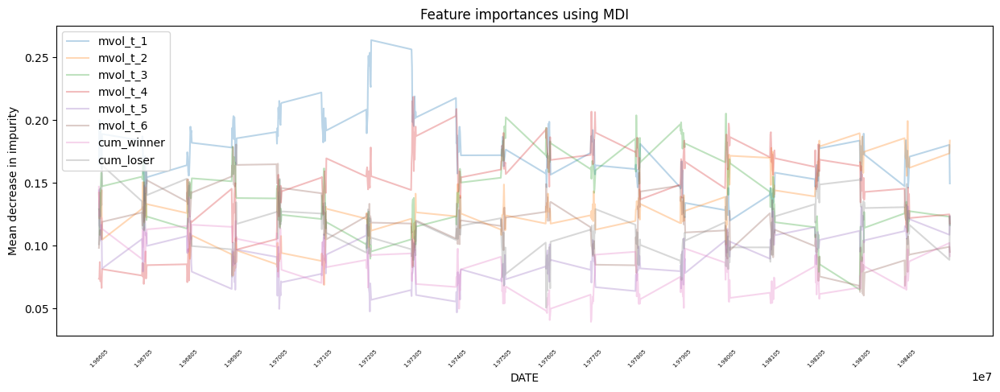

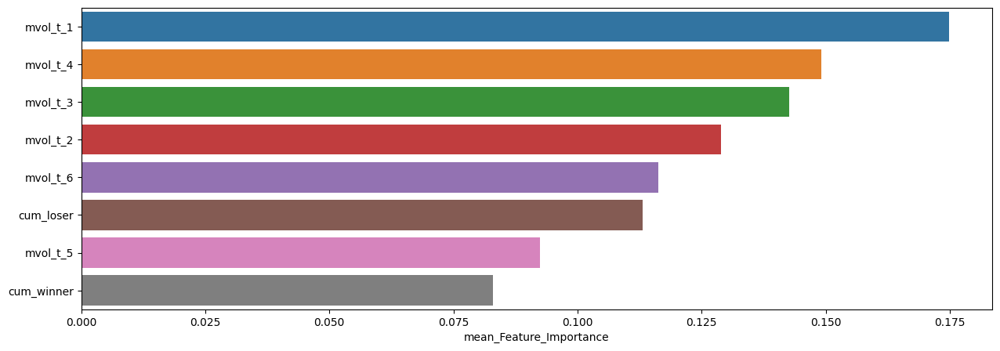

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.174792,0.263645,0.120023
mvol_t_4,0.149028,0.218457,0.066265
mvol_t_3,0.142584,0.205201,0.064894
mvol_t_2,0.128882,0.199220,0.068643
mvol_t_6,0.116270,0.180483,0.060227
cum_loser,0.113106,0.163936,0.050549
mvol_t_5,0.092439,0.147534,0.046760
cum_winner,0.082901,0.146943,0.039283



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.38      0.30      0.34        70
         1.0       0.71      0.78      0.75       156

    accuracy                           0.63       226
   macro avg       0.55      0.54      0.54       226
weighted avg       0.61      0.63      0.62       226


accuracy : 0.6327433628318584

precision : 0.7134502923976608

recall : 0.782051282051282

F1-Score : 0.746177370030581



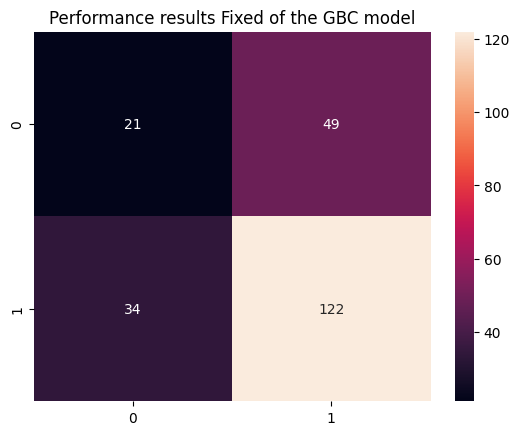


Feature Importance of the model



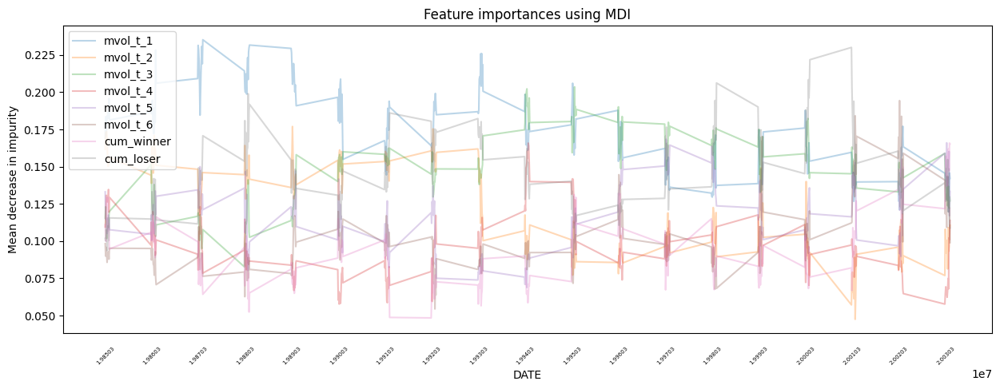

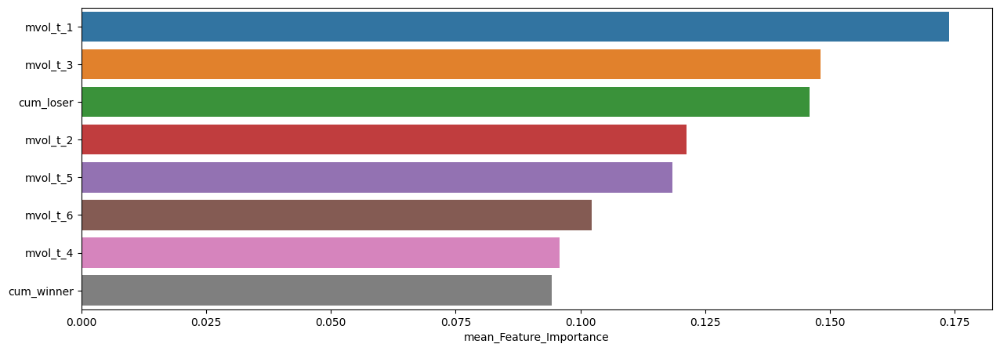

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.173805,0.235180,0.119653
mvol_t_3,0.148142,0.203515,0.082773
cum_loser,0.145939,0.230020,0.093707
mvol_t_2,0.121287,0.176930,0.047523
mvol_t_5,0.118358,0.168386,0.068868
mvol_t_6,0.102331,0.194323,0.054464
mvol_t_4,0.095840,0.165782,0.057726
cum_winner,0.094298,0.165813,0.048454



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.28      0.33        96
         1.0       0.57      0.70      0.63       132

    accuracy                           0.53       228
   macro avg       0.49      0.49      0.48       228
weighted avg       0.50      0.53      0.51       228


accuracy : 0.5263157894736842

precision : 0.5740740740740741

recall : 0.7045454545454546

F1-Score : 0.6326530612244898



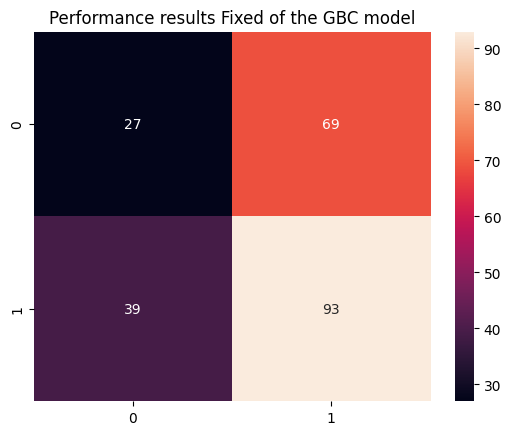


Feature Importance of the model



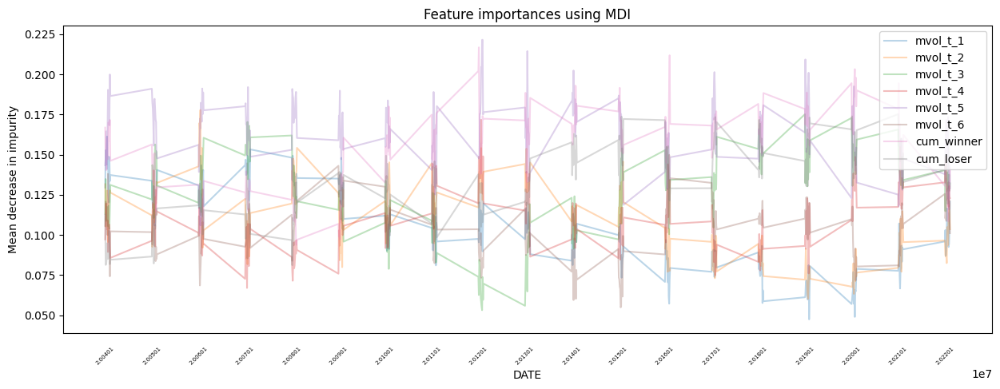

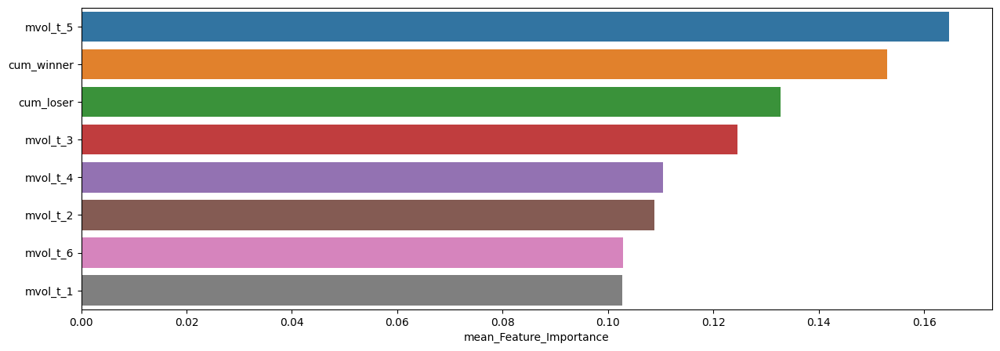

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.164710,0.221541,0.115940
cum_winner,0.153061,0.216827,0.093850
cum_loser,0.132803,0.175224,0.081107
mvol_t_3,0.124641,0.175177,0.053133
mvol_t_4,0.110420,0.171719,0.066967
mvol_t_2,0.108815,0.177853,0.060192
mvol_t_6,0.102820,0.149828,0.054870
mvol_t_1,0.102730,0.161289,0.047399


In [29]:
slice_feature_importance(Fixed_GBC_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'GBC') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



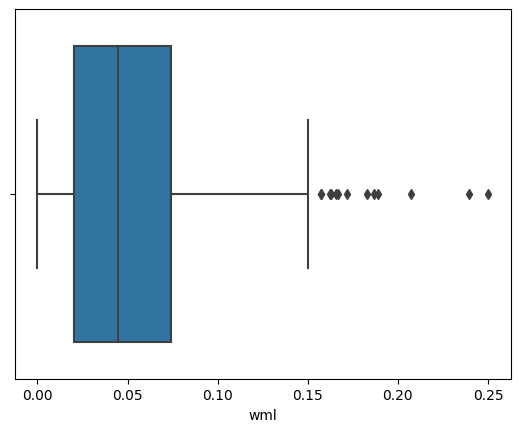

,count,mean,std,min,25%,50%,75%,max
wml,449.0,0.053081,0.04242,0.000007,0.020141,0.044931,0.074371,0.250175



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



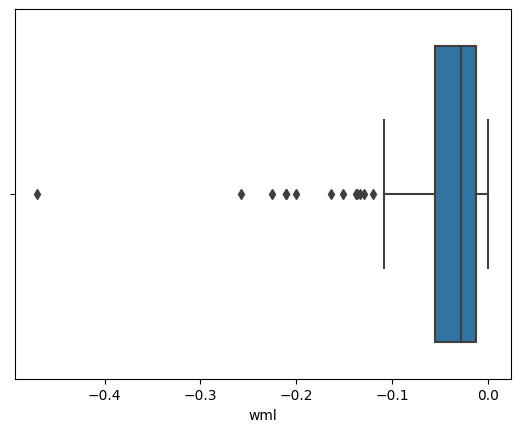

,count,mean,std,min,25%,50%,75%,max
wml,95.0,-0.053465,0.069958,-0.469903,-0.05543,-0.028629,-0.013329,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



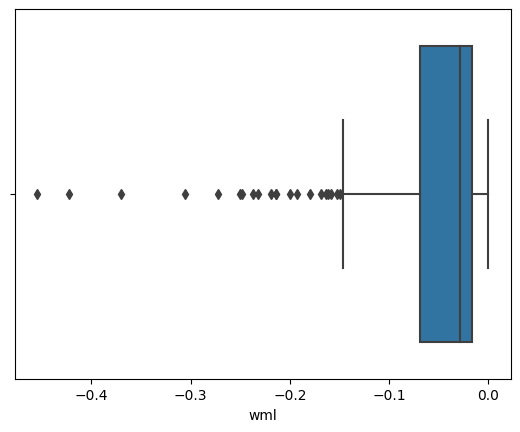

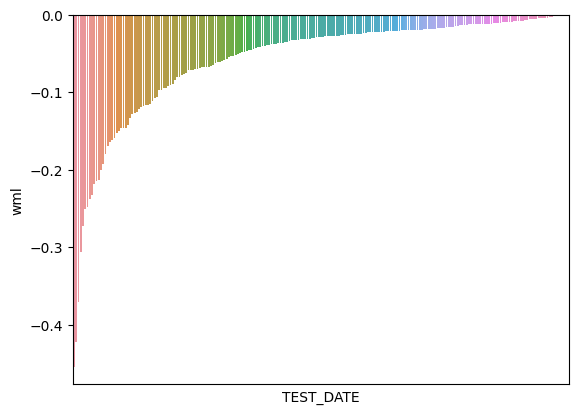

,count,mean,std,min,25%,50%,75%,max
wml,221.0,-0.057534,0.071899,-0.454349,-0.069463,-0.028532,-0.016495,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



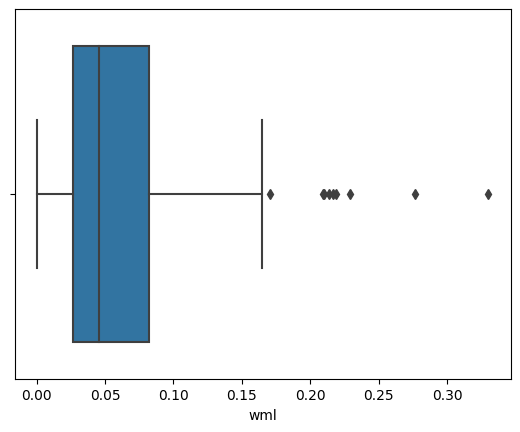

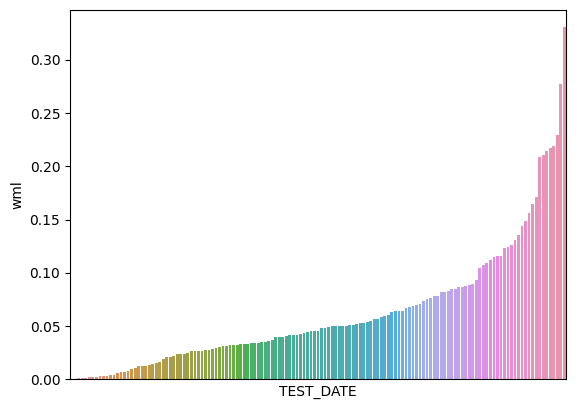

,count,mean,std,min,25%,50%,75%,max
wml,141.0,0.062157,0.05829,0.000577,0.026563,0.045577,0.08188,0.330163


In [30]:
GBC_A0_P1, GBC_A1_P0 = What_Pred(Fixed_GBC_Result, WML, 'GBC')

Sharpe Ratio : 0.70907

최근 누적 수익률

  2022년-12월 -> 8257.15
  2022년-11월 -> 7439.45
  2022년-10월 -> 7439.45
  2022년-09월 -> 6587.42
  2022년-08월 -> 5988.86

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 30250.30
  2등 : 2002년-06월 -> 26341.48
  3등 : 2002년-07월 -> 26341.48
  4등 : 2002년-08월 -> 25578.31
  5등 : 2002년-10월 -> 24407.36
  6등 : 2001년-09월 -> 23732.36
  7등 : 2002년-02월 -> 23631.73
  8등 : 2002년-03월 -> 22650.46
  9등 : 2002년-04월 -> 22650.46
  10등 : 2002년-05월 -> 22650.46



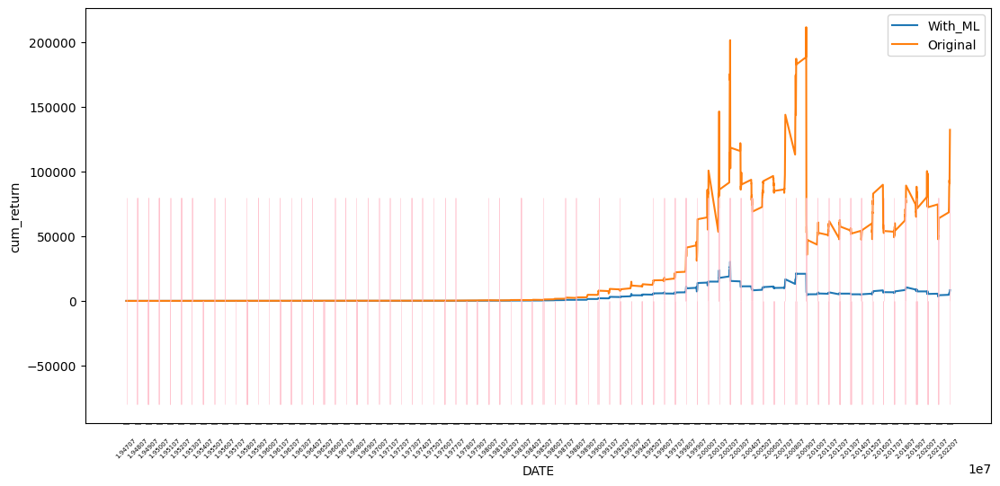

In [31]:
GBC_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_GBC_Result,
                                                 WML,
                                                 'GBC_PRED_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.74768

최근 누적 수익률

  2022년-12월 -> 9707.02
  2022년-11월 -> 8955.97
  2022년-10월 -> 8911.28
  2022년-09월 -> 8011.85
  2022년-08월 -> 7535.76

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 14187.08
  2등 : 2008년-11월 -> 13756.82
  3등 : 2002년-09월 -> 13754.83
  4등 : 2009년-01월 -> 13458.06
  5등 : 2008년-12월 -> 13440.62
  6등 : 2002년-07월 -> 12853.48
  7등 : 2008년-10월 -> 12579.86
  8등 : 2002년-08월 -> 12534.80
  9등 : 2002년-06월 -> 12517.64
  10등 : 2008년-09월 -> 12051.88



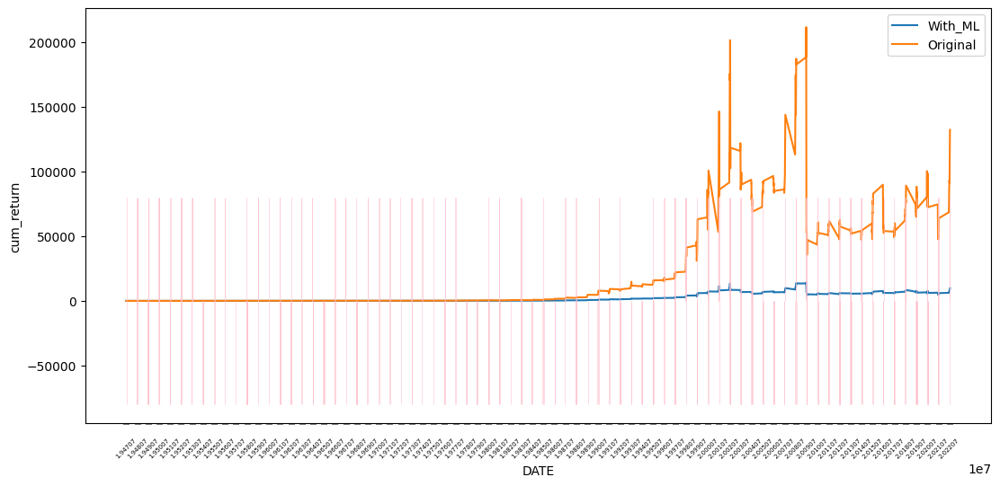

In [32]:
GBC_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_GBC_Result,
                                                 WML,
                                                 'GBC_PROB_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

### XGB

In [33]:
XGB_Param = {}
XGB = XGBClassifier(**XGB_Param, random_state=42)

**************************************************

XGB Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   objective : binary:logistic
   use_label_encoder : None
   base_score : None
   booster : None
   callbacks : None
   colsample_bylevel : None
   colsample_bynode : None
   colsample_bytree : None
   early_stopping_rounds : None
   enable_categorical : False
   eval_metric : None
   feature_types : None
   gamma : None
   gpu_id : None
   grow_policy : None
   importance_type : None
   interaction_constraints : None
   learning_rate : None
   max_bin : None
   max_cat_threshold : None
   max_cat_to_onehot : None
   max_delta_step : None
   max_depth : None
   max_leaves : None
   min_child_weight : None
   missing : nan
   monotone_constraints : None
   n_estimators : 100
   n_jobs : None
   num_parallel_tree : None
   predictor : None
   random_state : 42
   reg_alpha : None
   reg_lambda : None
   sampling_method : None
   scale_pos_weight : None
   subsample : None
 

  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.39      0.41       316
         1.0       0.69      0.74      0.71       590

    accuracy                           0.61       906
   macro avg       0.57      0.56      0.56       906
weighted avg       0.60      0.61      0.61       906


accuracy : 0.6147902869757175

precision : 0.6921850079744817

recall : 0.735593220338983

F1-Score : 0.7132292522596548



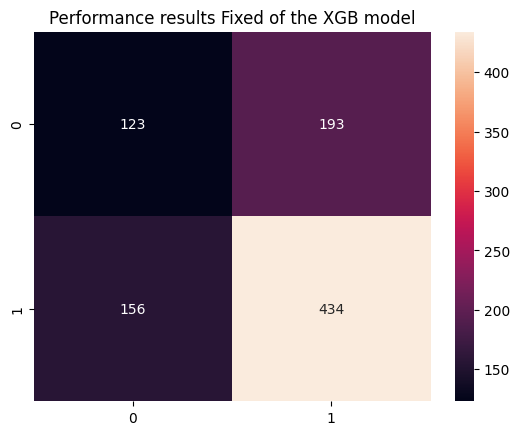


Feature Importance of the model



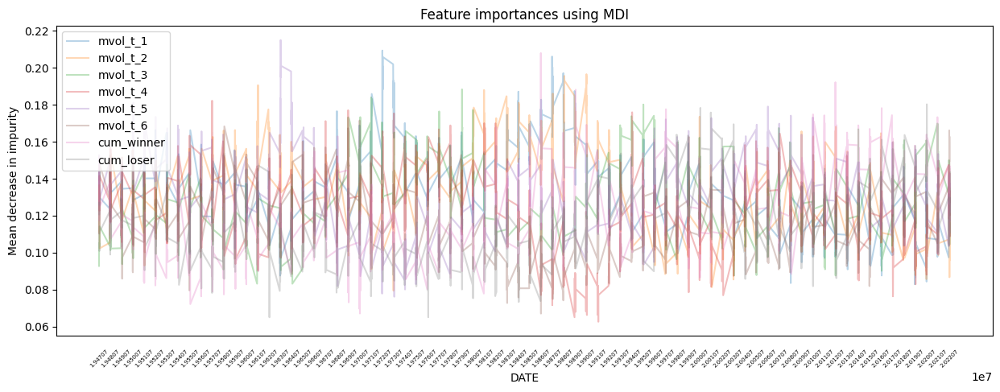

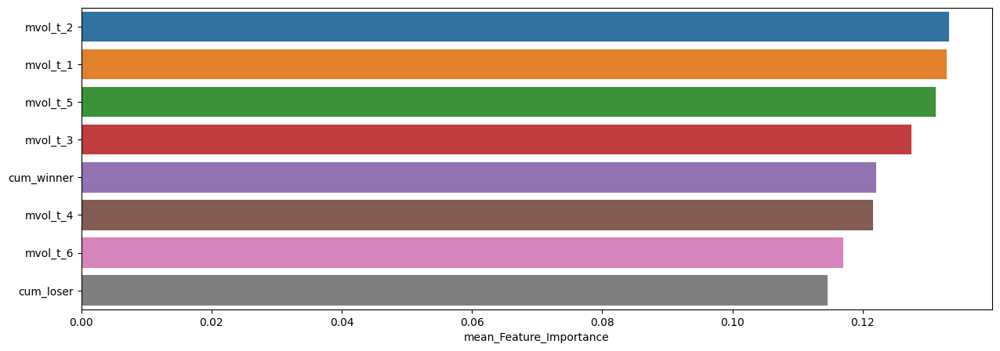

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.133226,0.196555,0.079363
mvol_t_1,0.132851,0.209362,0.082866
mvol_t_5,0.131185,0.215035,0.076093
mvol_t_3,0.127442,0.188348,0.083122
cum_winner,0.122110,0.207990,0.067011
mvol_t_4,0.121636,0.182223,0.062550
mvol_t_6,0.116978,0.171493,0.066977
cum_loser,0.114573,0.180265,0.064967


In [34]:
Fixed_XGB_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=XGB, # 사용할 모델
                                  model_name='XGB', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.39      0.40        75
         1.0       0.71      0.73      0.72       151

    accuracy                           0.62       226
   macro avg       0.56      0.56      0.56       226
weighted avg       0.61      0.62      0.61       226


accuracy : 0.6150442477876106

precision : 0.7051282051282052

recall : 0.7284768211920529

F1-Score : 0.7166123778501629



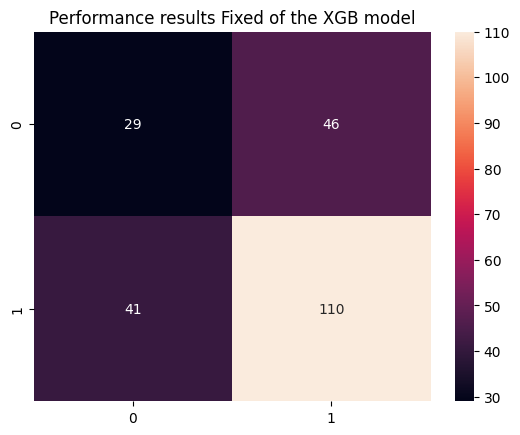


Feature Importance of the model



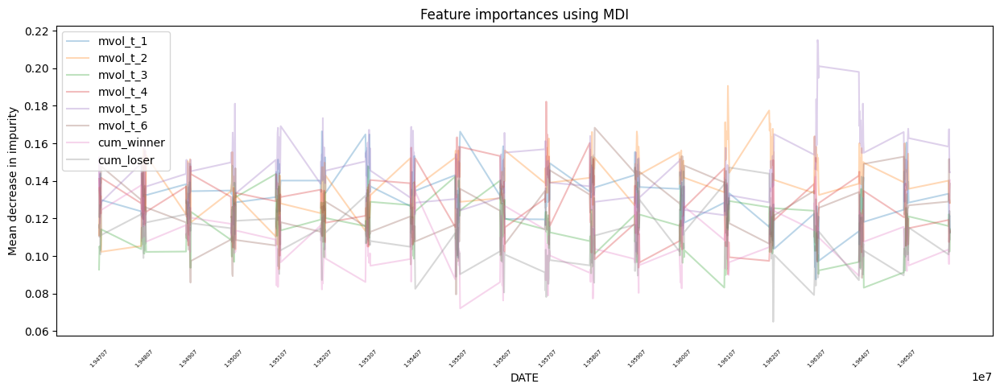

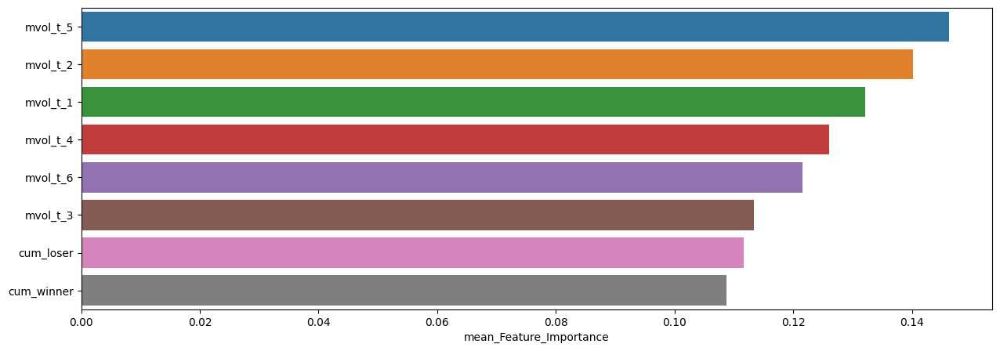

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.146233,0.215035,0.102182
mvol_t_2,0.140215,0.190620,0.092950
mvol_t_1,0.132118,0.166406,0.087543
mvol_t_4,0.126010,0.182223,0.090334
mvol_t_6,0.121541,0.168331,0.079524
mvol_t_3,0.113387,0.147725,0.083122
cum_loser,0.111676,0.147133,0.064967
cum_winner,0.108820,0.151934,0.072095



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.49      0.39      0.43        75
         1.0       0.72      0.80      0.76       151

    accuracy                           0.66       226
   macro avg       0.61      0.59      0.60       226
weighted avg       0.65      0.66      0.65       226


accuracy : 0.6637168141592921

precision : 0.7245508982035929

recall : 0.8013245033112583

F1-Score : 0.7610062893081762



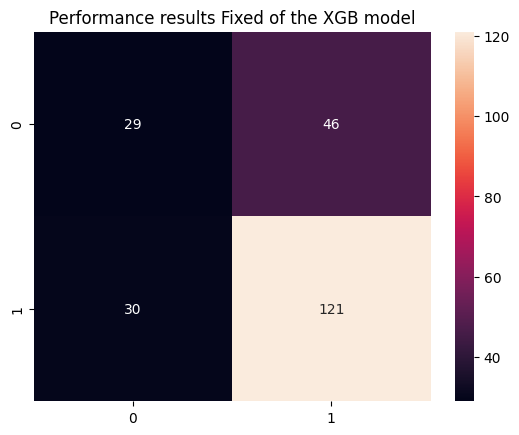


Feature Importance of the model



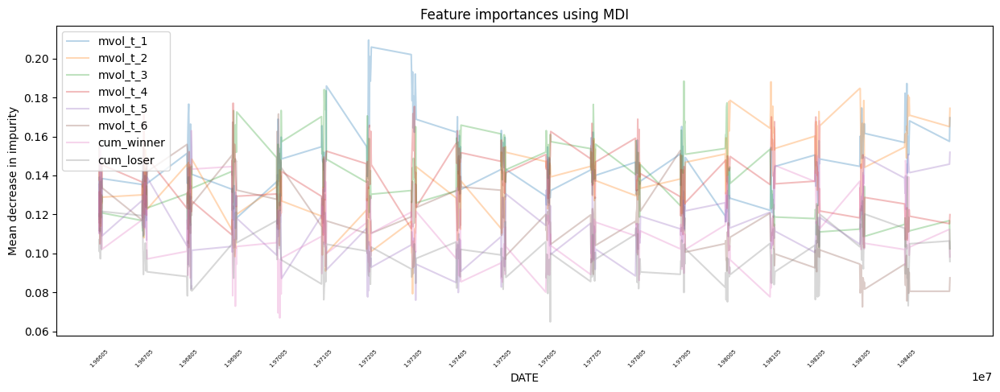

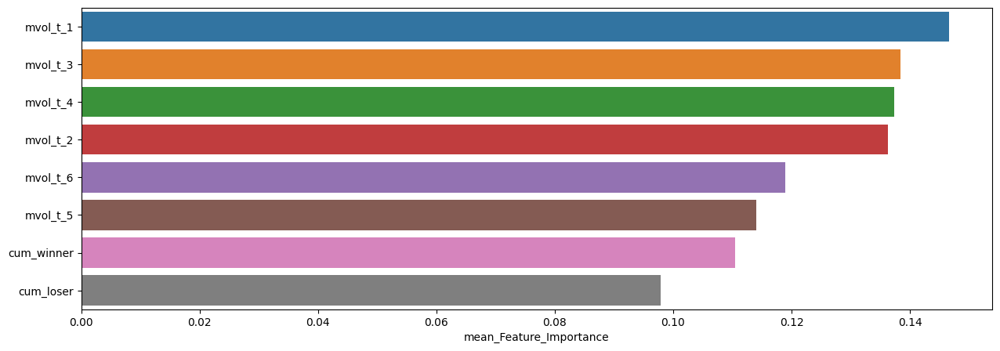

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.146572,0.209362,0.112376
mvol_t_3,0.138389,0.188348,0.102447
mvol_t_4,0.137334,0.177059,0.103037
mvol_t_2,0.136285,0.187991,0.079363
mvol_t_6,0.118962,0.171493,0.072689
mvol_t_5,0.114100,0.151881,0.076093
cum_winner,0.110445,0.167978,0.067011
cum_loser,0.097913,0.140402,0.064997



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.33      0.36        70
         1.0       0.72      0.77      0.74       156

    accuracy                           0.63       226
   macro avg       0.55      0.55      0.55       226
weighted avg       0.62      0.63      0.62       226


accuracy : 0.6327433628318584

precision : 0.718562874251497

recall : 0.7692307692307693

F1-Score : 0.7430340557275542



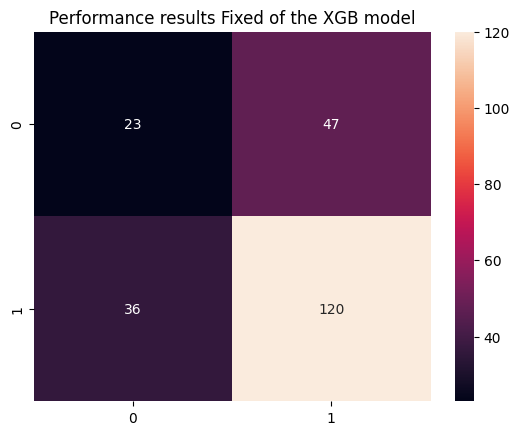


Feature Importance of the model



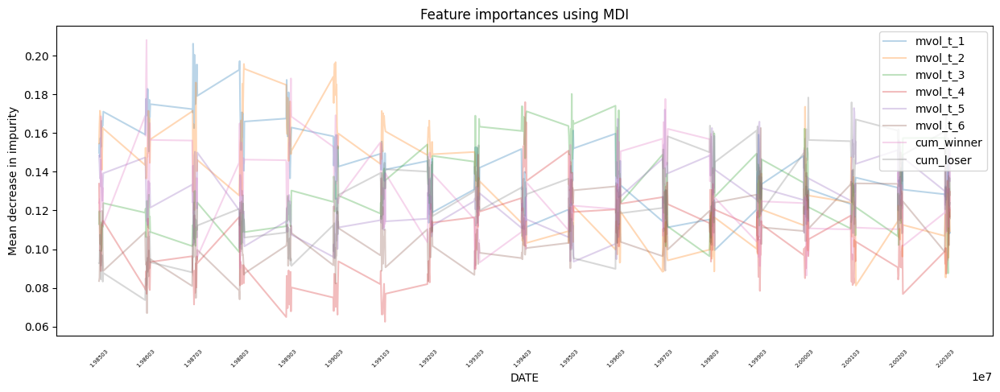

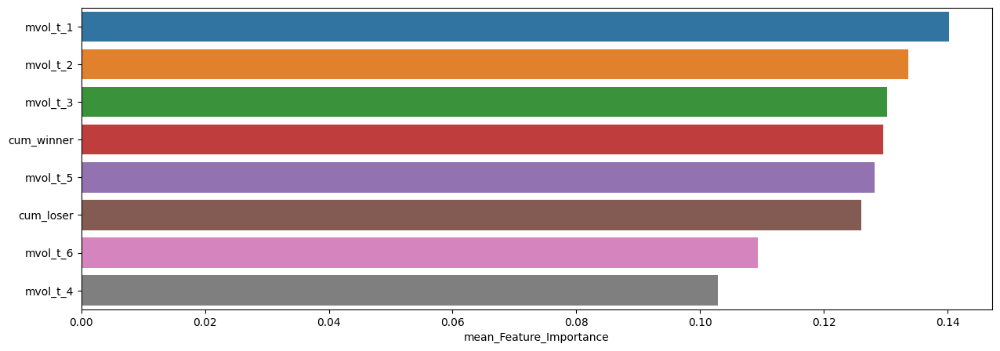

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.140184,0.206129,0.099523
mvol_t_2,0.133578,0.196555,0.081236
mvol_t_3,0.130207,0.180163,0.087547
cum_winner,0.129563,0.207990,0.086448
mvol_t_5,0.128229,0.172856,0.093569
cum_loser,0.126045,0.178331,0.073755
mvol_t_6,0.109357,0.162570,0.066977
mvol_t_4,0.102837,0.175941,0.062550



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.46      0.44      0.45        96
         1.0       0.61      0.63      0.62       132

    accuracy                           0.55       228
   macro avg       0.53      0.53      0.53       228
weighted avg       0.55      0.55      0.55       228


accuracy : 0.5482456140350878

precision : 0.6058394160583942

recall : 0.6287878787878788

F1-Score : 0.617100371747212



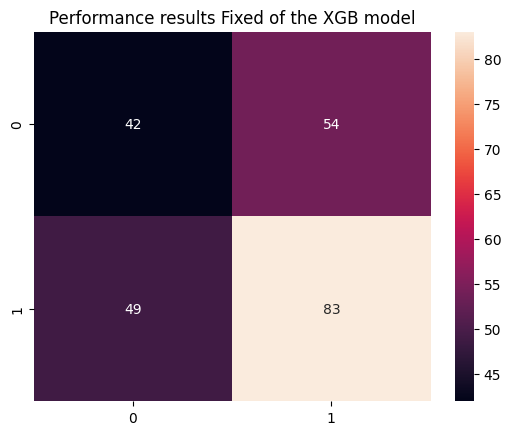


Feature Importance of the model



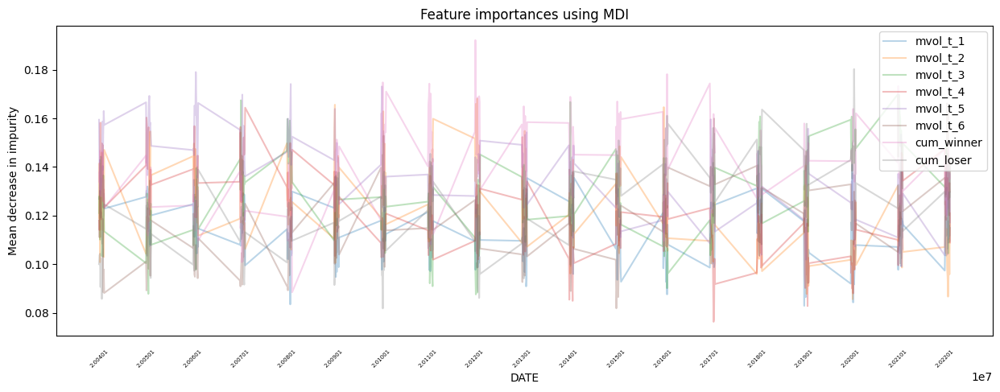

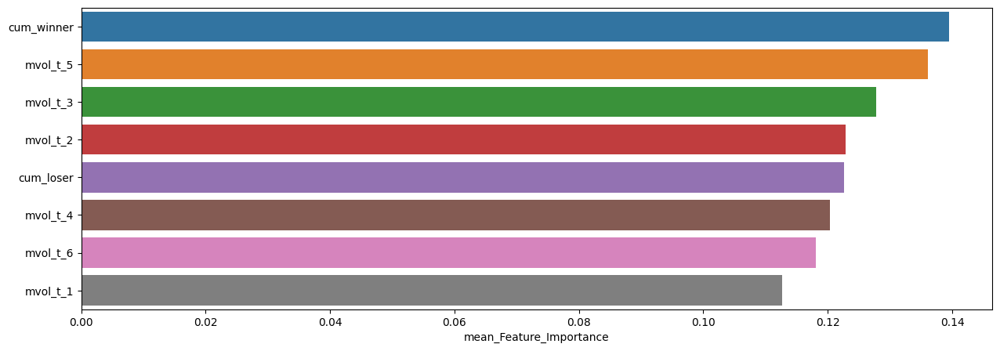

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner,0.139458,0.192193,0.088444
mvol_t_5,0.136135,0.179057,0.099050
mvol_t_3,0.127781,0.169846,0.087568
mvol_t_2,0.122916,0.168124,0.085601
cum_loser,0.122586,0.180265,0.081811
mvol_t_4,0.120375,0.164409,0.076289
mvol_t_6,0.118041,0.166143,0.081851
mvol_t_1,0.112708,0.146519,0.082866


In [35]:
slice_feature_importance(Fixed_XGB_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'XGB') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



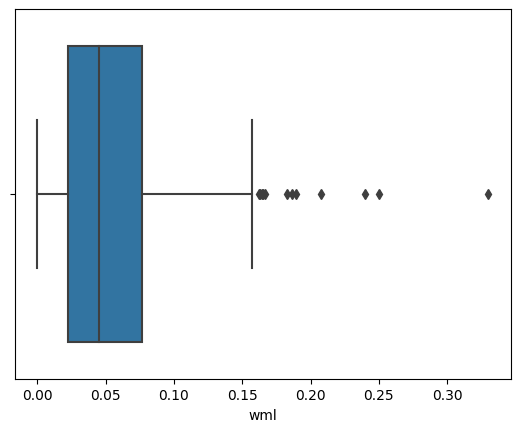

,count,mean,std,min,25%,50%,75%,max
wml,434.0,0.054548,0.044123,0.000007,0.022095,0.045319,0.076584,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



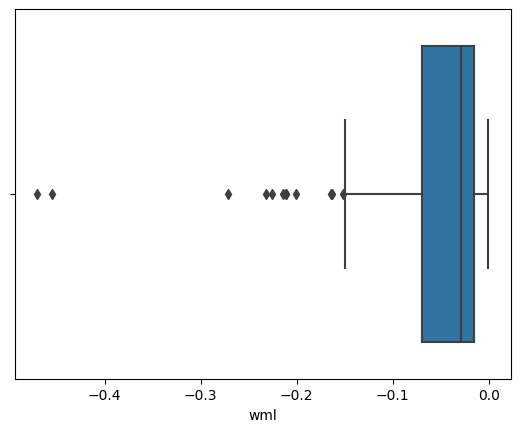

,count,mean,std,min,25%,50%,75%,max
wml,123.0,-0.059034,0.077618,-0.469903,-0.069394,-0.028629,-0.015211,-0.000506



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



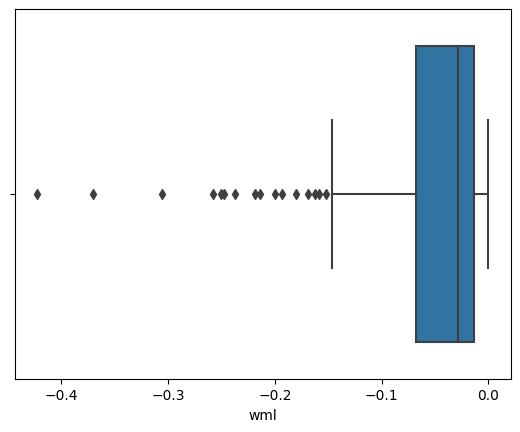

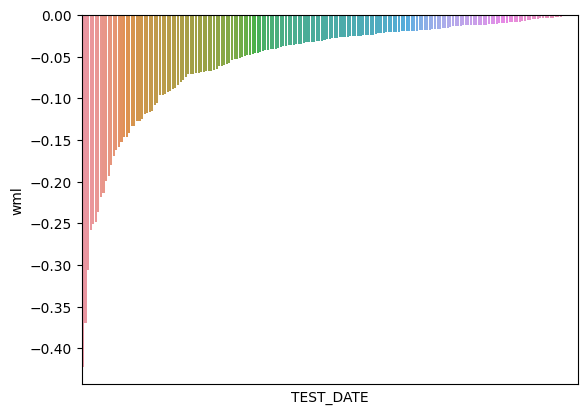

,count,mean,std,min,25%,50%,75%,max
wml,193.0,-0.054575,0.067003,-0.4224,-0.067845,-0.028532,-0.013863,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



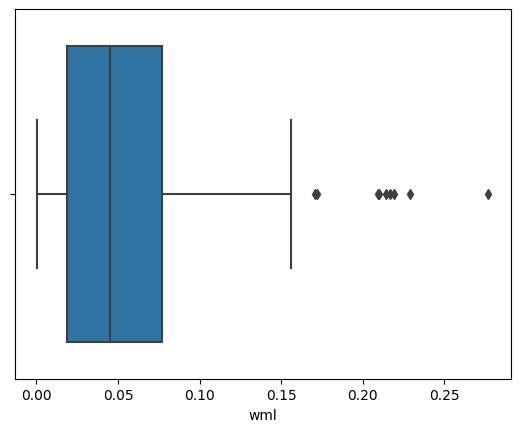

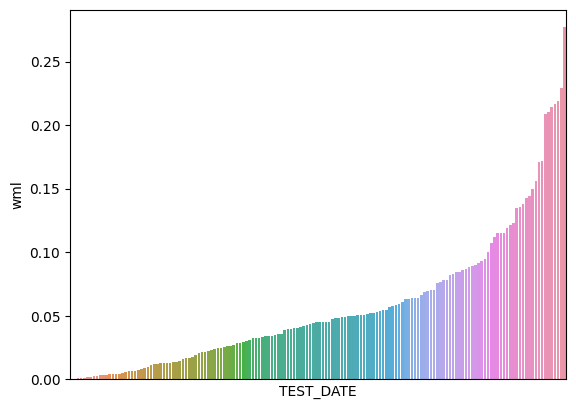

,count,mean,std,min,25%,50%,75%,max
wml,156.0,0.057202,0.053694,0.000577,0.018846,0.045009,0.077016,0.276912


In [36]:
XGB_A0_P1, XGB_A1_P0 = What_Pred(Fixed_XGB_Result, WML, 'XGB')

Sharpe Ratio : 0.71524

최근 누적 수익률

  2022년-12월 -> 80653.88
  2022년-11월 -> 72667.64
  2022년-10월 -> 72667.64
  2022년-09월 -> 64346.15
  2022년-08월 -> 64346.15

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2008년-11월 -> 82238.45
  2등 : 2022년-12월 -> 80653.88
  3등 : 2009년-02월 -> 80291.92
  4등 : 2009년-01월 -> 80291.92
  5등 : 2008년-12월 -> 80291.92
  6등 : 2001년-09월 -> 75325.17
  7등 : 2008년-10월 -> 74994.50
  8등 : 2002년-09월 -> 73388.58
  9등 : 2022년-11월 -> 72667.64
  10등 : 2022년-10월 -> 72667.64



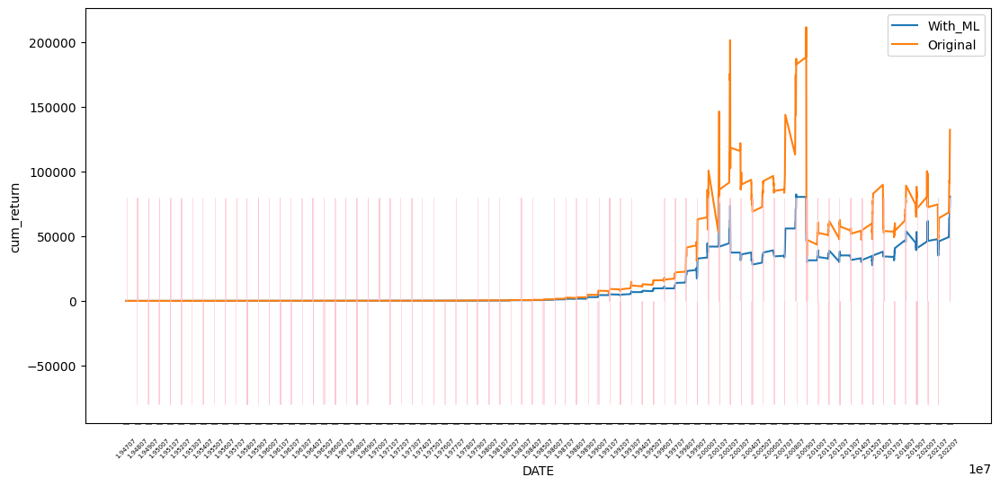

In [37]:
XGB_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_XGB_Result,
                                                 WML,
                                                 'XGB_PRED_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.69891

최근 누적 수익률

  2022년-12월 -> 41680.73
  2022년-11월 -> 38679.48
  2022년-10월 -> 38623.06
  2022년-09월 -> 35740.21
  2022년-08월 -> 35403.39

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 56579.54
  2등 : 2008년-11월 -> 55589.66
  3등 : 2009년-01월 -> 54415.49
  4등 : 2008년-12월 -> 54282.15
  5등 : 2008년-10월 -> 51336.14
  6등 : 2008년-09월 -> 48959.18
  7등 : 2008년-06월 -> 47739.08
  8등 : 2008년-07월 -> 47714.58
  9등 : 2008년-08월 -> 47488.65
  10등 : 2002년-09월 -> 46841.35



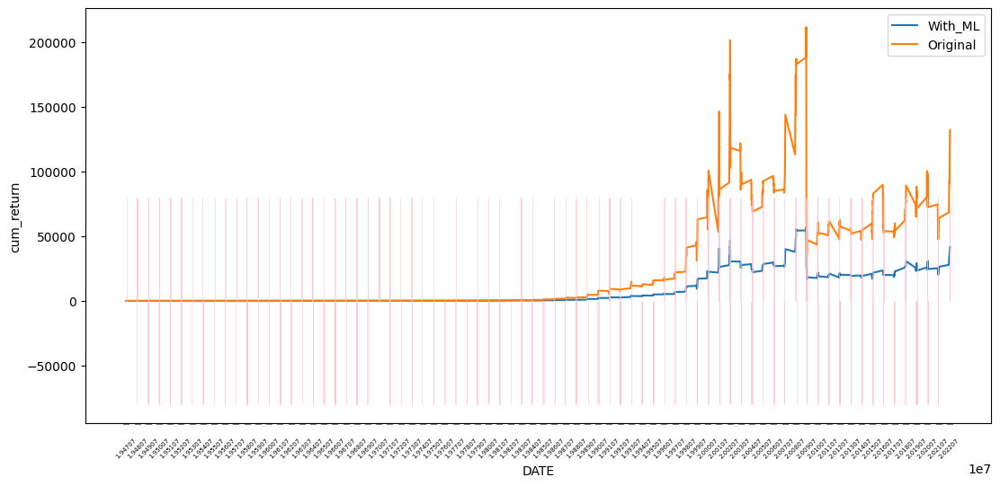

In [38]:
XGB_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_XGB_Result,
                                                 WML,
                                                 'XGB_PROB_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

### LGBM

In [39]:
LGBM_param = {}
LGBM = LGBMClassifier(**LGBM_param, random_state=42)

**************************************************

LGBM Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   boosting_type : gbdt
   class_weight : None
   colsample_bytree : 1.0
   importance_type : split
   learning_rate : 0.1
   max_depth : -1
   min_child_samples : 20
   min_child_weight : 0.001
   min_split_gain : 0.0
   n_estimators : 100
   n_jobs : -1
   num_leaves : 31
   objective : None
   random_state : 42
   reg_alpha : 0.0
   reg_lambda : 0.0
   silent : warn
   subsample : 1.0
   subsample_for_bin : 200000
   subsample_freq : 0

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.36      0.39       316
         1.0       0.68      0.74      0.71       590

    accuracy                           0.60       906
   macro avg       0.55      0.55      0.55       906
weighted avg       0.59      0.60      0.60       906


accuracy : 0.6048565121412803

precision : 0.6823899371069182

recall : 0.735593220338983

F1-Score : 0.7079934747145187



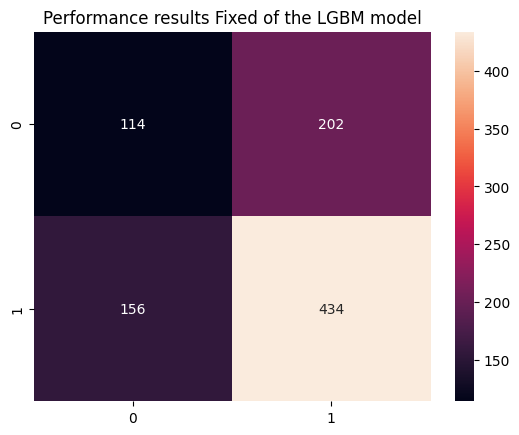


Feature Importance of the model



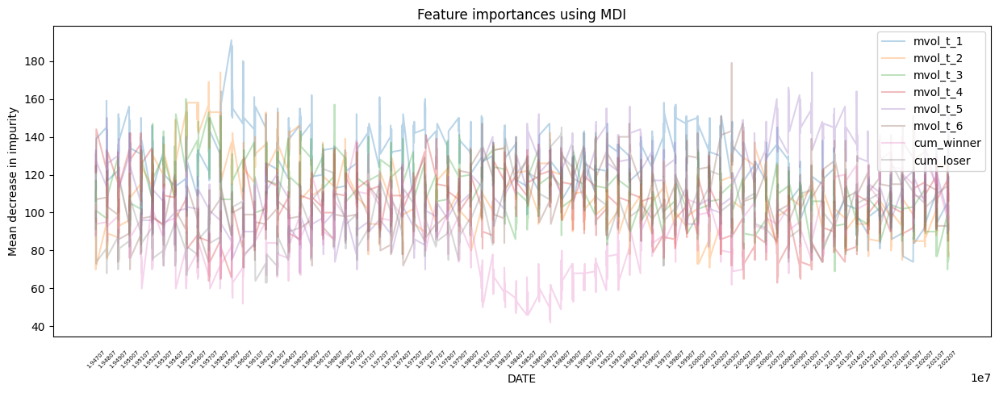

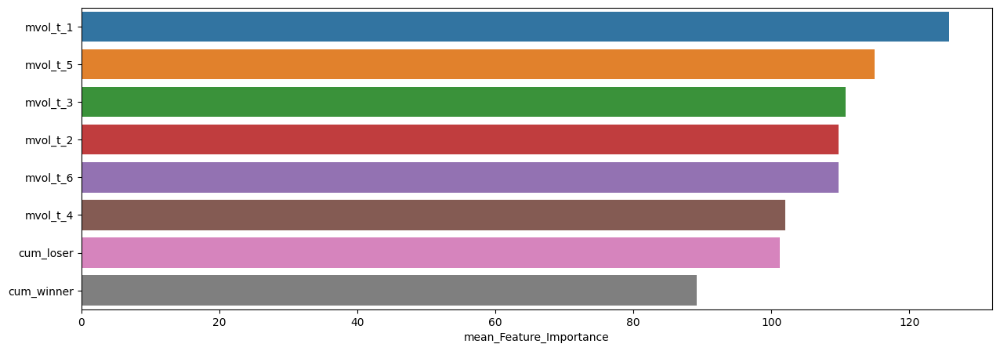

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,125.709713,191,74
mvol_t_5,114.902870,174,68
mvol_t_3,110.704194,160,69
mvol_t_2,109.778146,174,70
mvol_t_6,109.716336,179,70
mvol_t_4,102.044150,144,63
cum_loser,101.213024,145,63
cum_winner,89.179912,141,42


In [40]:
Fixed_LGBM_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                    window_size=240, # window size (훈련 데이터 셋 크기)
                                    method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                    model=LGBM, # 사용할 모델
                                    model_name='LGBM', # 사용한 모델 명
                                    plot=True, # 모델 성능 지표 시각화 여부
                                    plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.36      0.33      0.34        75
         1.0       0.68      0.70      0.69       151

    accuracy                           0.58       226
   macro avg       0.52      0.52      0.52       226
weighted avg       0.57      0.58      0.58       226


accuracy : 0.5796460176991151

precision : 0.6794871794871795

recall : 0.7019867549668874

F1-Score : 0.6905537459283388



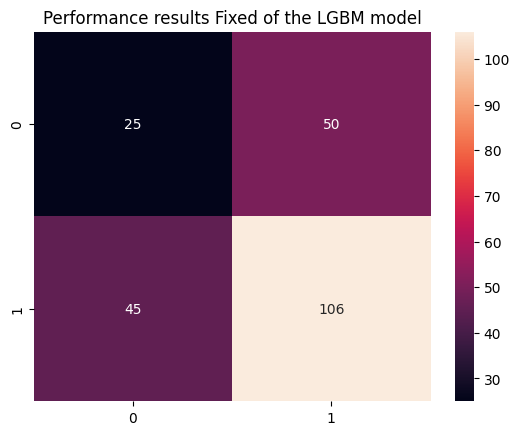


Feature Importance of the model



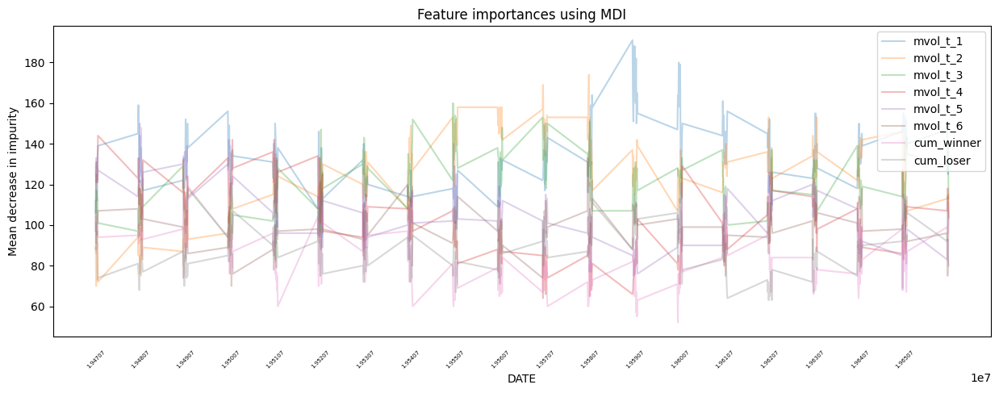

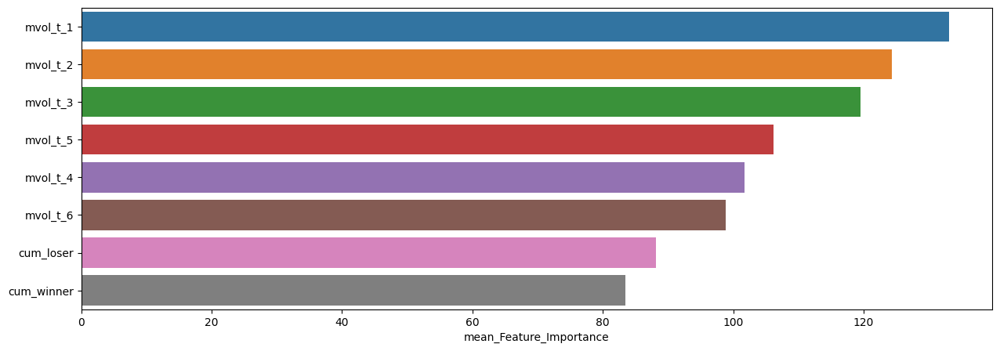

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,133.079646,191,89
mvol_t_2,124.323009,174,70
mvol_t_3,119.544248,160,83
mvol_t_5,106.225664,150,68
mvol_t_4,101.774336,144,64
mvol_t_6,98.814159,133,70
cum_loser,88.132743,122,63
cum_winner,83.495575,120,52



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.46      0.35      0.39        75
         1.0       0.71      0.79      0.75       151

    accuracy                           0.65       226
   macro avg       0.58      0.57      0.57       226
weighted avg       0.63      0.65      0.63       226


accuracy : 0.6460176991150443

precision : 0.7100591715976331

recall : 0.7947019867549668

F1-Score : 0.7499999999999999



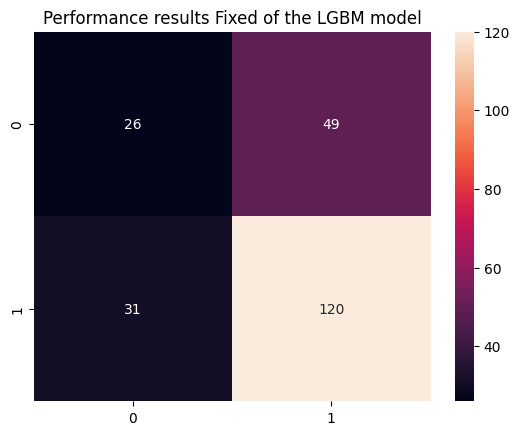


Feature Importance of the model



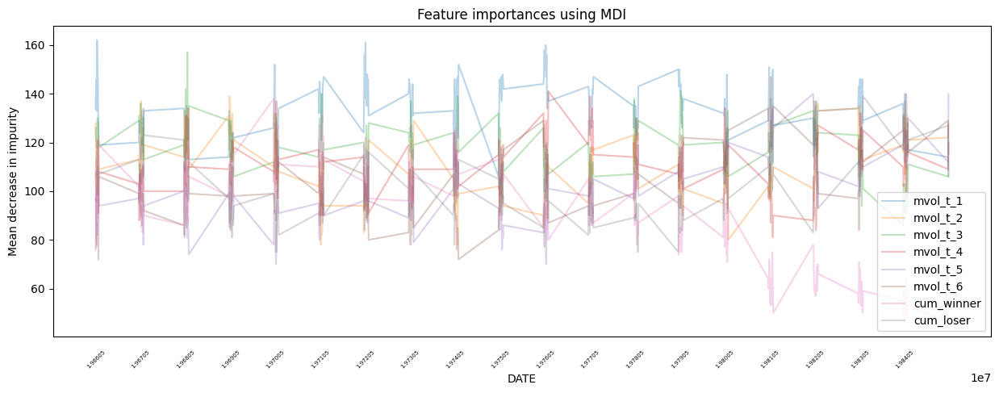

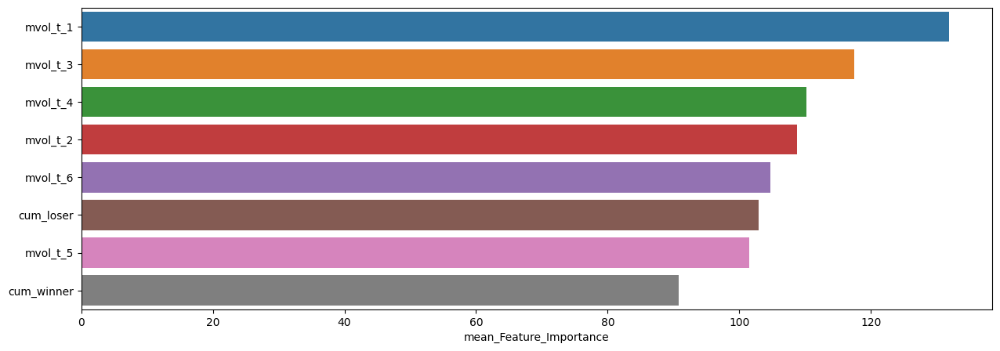

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,131.836283,162,105
mvol_t_3,117.477876,157,86
mvol_t_4,110.230088,141,81
mvol_t_2,108.725664,139,78
mvol_t_6,104.690265,147,72
cum_loser,102.915929,139,75
mvol_t_5,101.451327,140,70
cum_winner,90.840708,138,46



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.29      0.34        70
         1.0       0.72      0.82      0.77       156

    accuracy                           0.65       226
   macro avg       0.57      0.55      0.55       226
weighted avg       0.63      0.65      0.63       226


accuracy : 0.6548672566371682

precision : 0.7191011235955056

recall : 0.8205128205128205

F1-Score : 0.7664670658682635



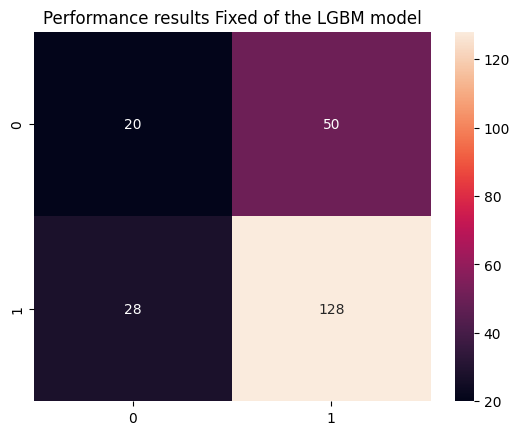


Feature Importance of the model



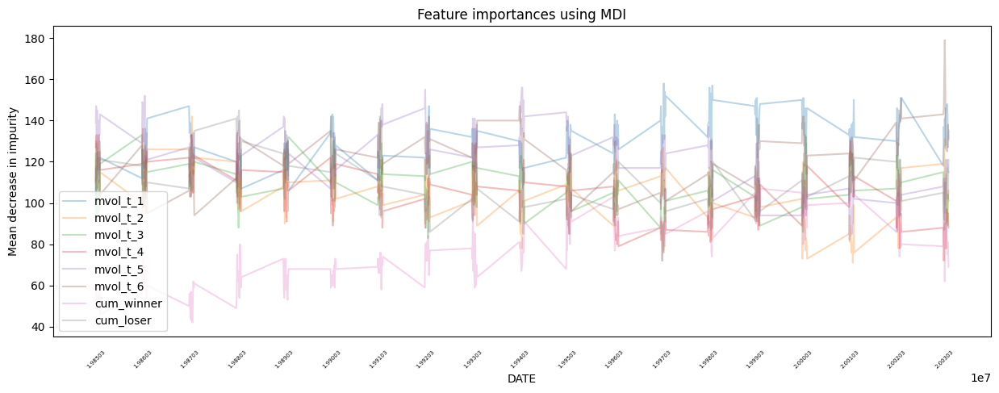

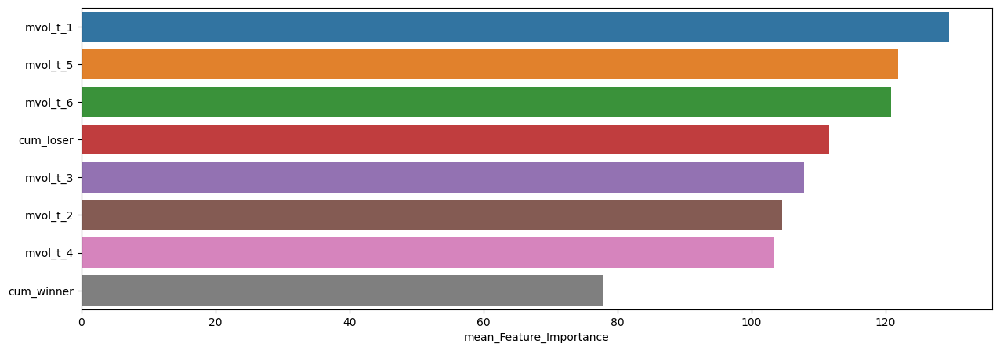

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,129.455752,158,99
mvol_t_5,121.889381,156,82
mvol_t_6,120.871681,179,93
cum_loser,111.579646,145,85
mvol_t_3,107.823009,142,72
mvol_t_2,104.548673,142,71
mvol_t_4,103.349558,136,72
cum_winner,77.964602,113,42



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.45      0.45      0.45        96
         1.0       0.60      0.61      0.60       132

    accuracy                           0.54       228
   macro avg       0.53      0.53      0.53       228
weighted avg       0.54      0.54      0.54       228


accuracy : 0.5394736842105263

precision : 0.6015037593984962

recall : 0.6060606060606061

F1-Score : 0.6037735849056604



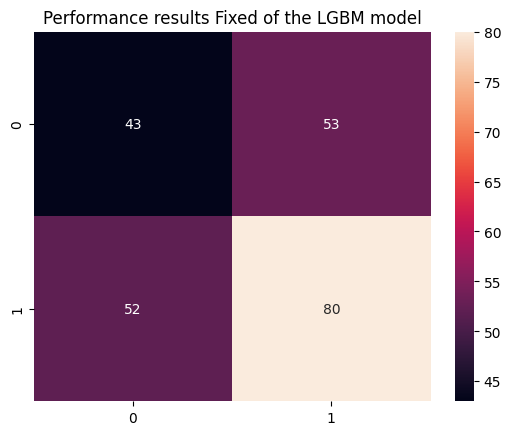


Feature Importance of the model



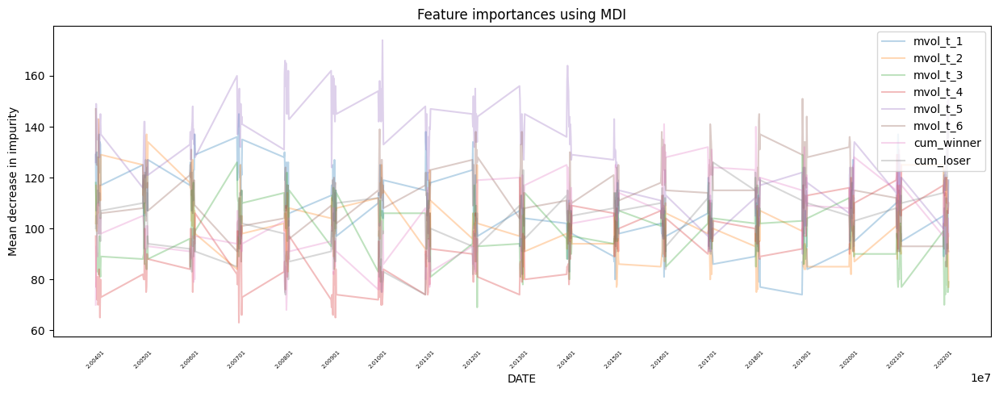

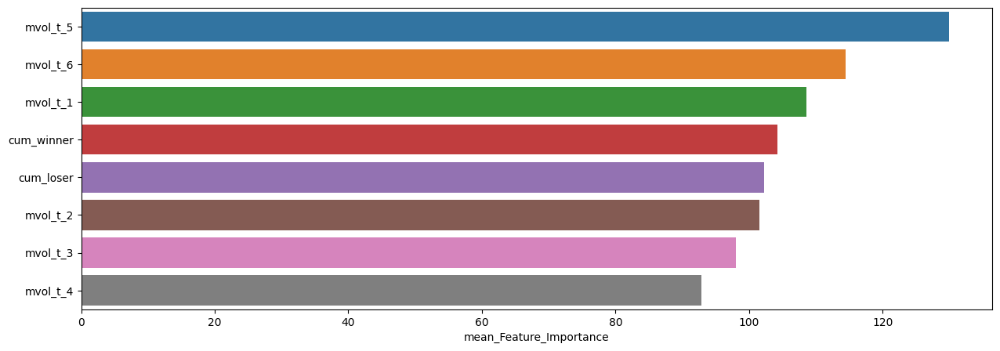

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,129.912281,174,90
mvol_t_6,114.447368,151,85
mvol_t_1,108.618421,145,74
cum_winner,104.285088,141,68
cum_loser,102.214912,141,74
mvol_t_2,101.587719,143,75
mvol_t_3,98.083333,129,69
mvol_t_4,92.903509,129,63


In [41]:
slice_feature_importance(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                        4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                        'Fixed', # Rolling Windows Method
                        'LGBM') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



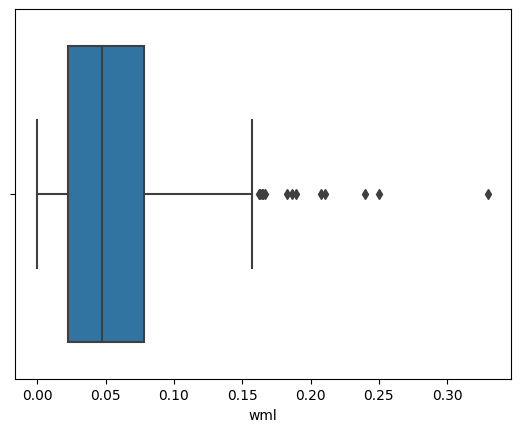

,count,mean,std,min,25%,50%,75%,max
wml,434.0,0.055572,0.045037,0.000007,0.022328,0.047104,0.078242,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



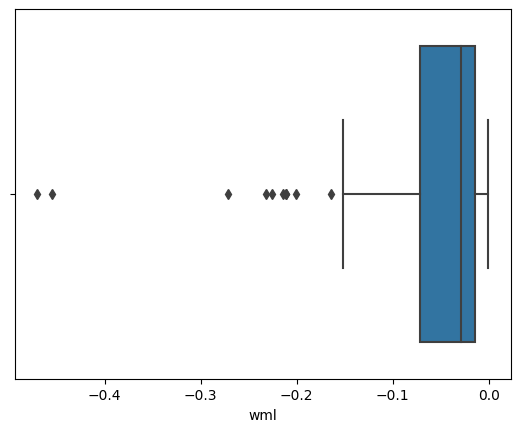

,count,mean,std,min,25%,50%,75%,max
wml,114.0,-0.059905,0.079446,-0.469903,-0.07147,-0.0288,-0.014546,-0.000506



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



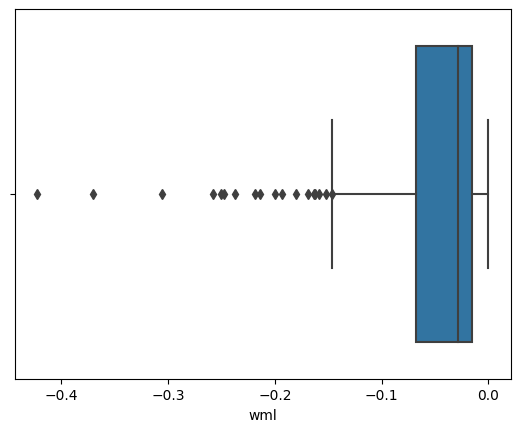

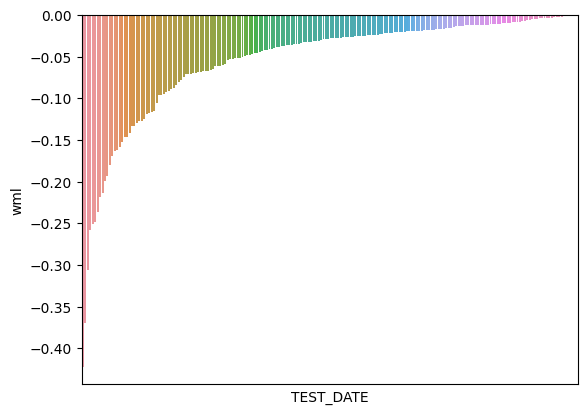

,count,mean,std,min,25%,50%,75%,max
wml,202.0,-0.054283,0.066278,-0.4224,-0.067596,-0.028323,-0.01515,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



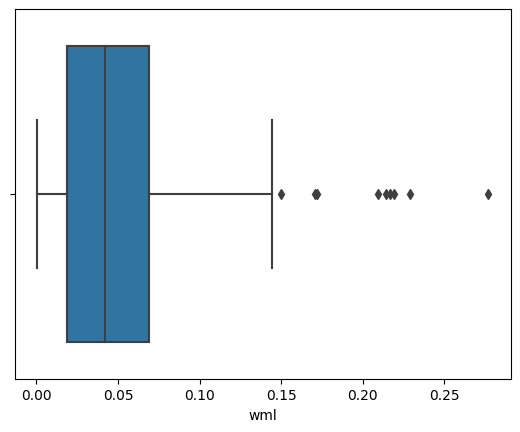

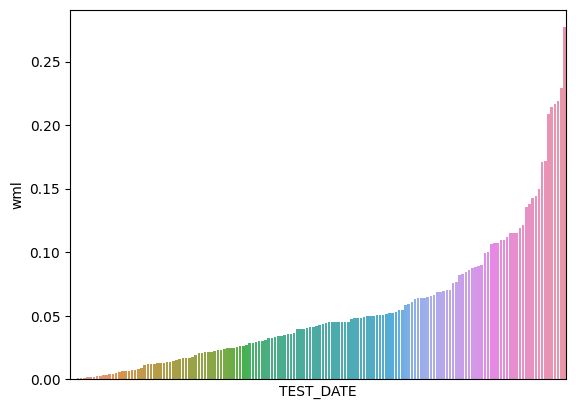

,count,mean,std,min,25%,50%,75%,max
wml,156.0,0.054353,0.051572,0.000627,0.018846,0.042232,0.069219,0.276912


In [42]:
LGBM_A0_P1, LGBM_A1_P0 = What_Pred(Fixed_LGBM_Result,
                                   WML,
                                   'LGBM')

Sharpe Ratio : 0.68917

최근 누적 수익률

  2022년-12월 -> 76861.45
  2022년-11월 -> 76861.45
  2022년-10월 -> 76861.45
  2022년-09월 -> 68059.72
  2022년-08월 -> 68059.72

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 76861.45
  2등 : 2022년-11월 -> 76861.45
  3등 : 2022년-10월 -> 76861.45
  4등 : 2009년-02월 -> 76408.23
  5등 : 2008년-11월 -> 69685.75
  6등 : 2022년-09월 -> 68059.72
  7등 : 2022년-08월 -> 68059.72
  8등 : 2022년-07월 -> 68059.72
  9등 : 2022년-06월 -> 68059.72
  10등 : 2009년-01월 -> 68036.33



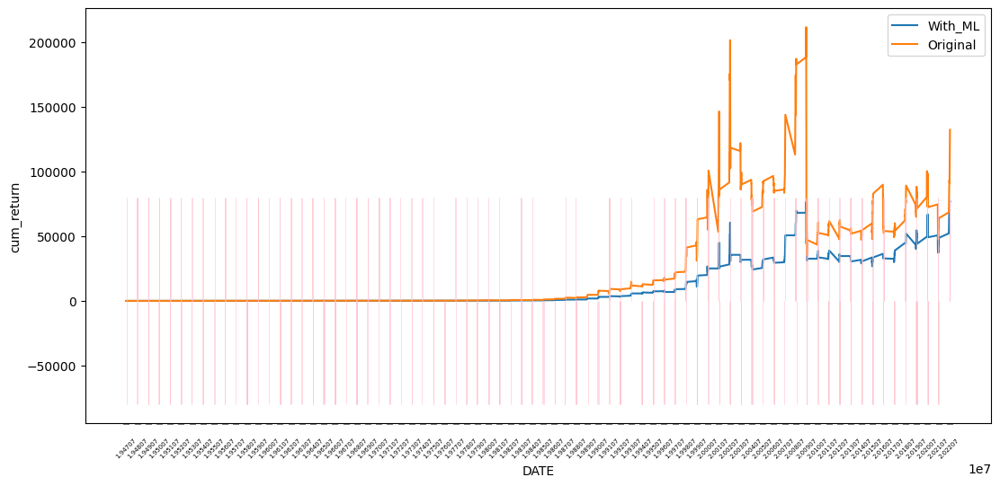

In [43]:
LGBM_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PRED_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

Sharpe Ratio : 0.71372

최근 누적 수익률

  2022년-12월 -> 31184.62
  2022년-11월 -> 30410.78
  2022년-10월 -> 30238.45
  2022년-09월 -> 27967.17
  2022년-08월 -> 27194.51

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 36048.83
  2등 : 2008년-11월 -> 34000.06
  3등 : 2009년-01월 -> 33634.65
  4등 : 2008년-12월 -> 33231.49
  5등 : 2008년-10월 -> 31409.89
  6등 : 2022년-12월 -> 31184.62
  7등 : 2022년-11월 -> 30410.78
  8등 : 2008년-09월 -> 30287.27
  9등 : 2022년-10월 -> 30238.45
  10등 : 2002년-09월 -> 29654.40



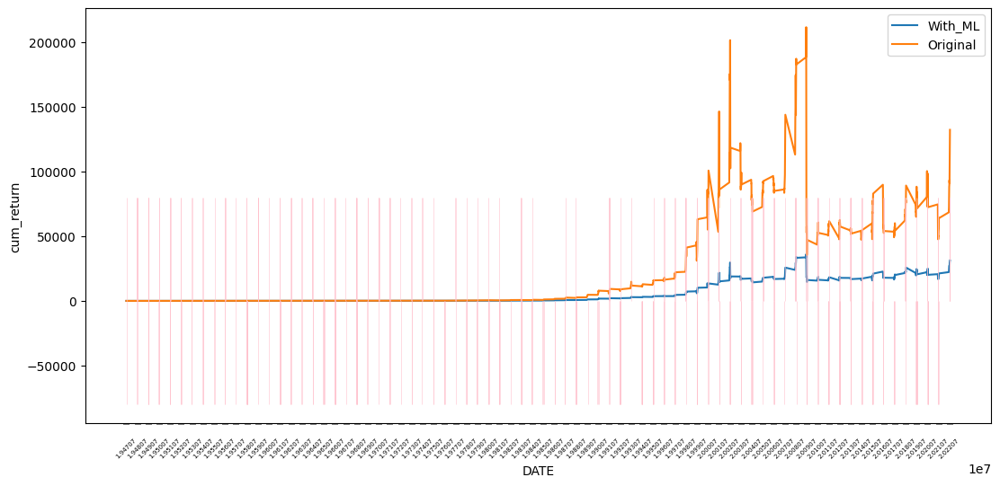

In [44]:
LGBM_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PROB_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

## Rolling Expanding Windows

### Random Forest

In [45]:
RDF_Param={} 
RDF = RandomForestClassifier(**RDF_Param, random_state=42)

**************************************************

RDF Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   bootstrap : True
   ccp_alpha : 0.0
   class_weight : None
   criterion : gini
   max_depth : None
   max_features : sqrt
   max_leaf_nodes : None
   max_samples : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_jobs : None
   oob_score : False
   random_state : 42
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.22      0.28       316
         1.0       0.66      0.82      0.73       590

    accuracy                           0.61       906
   macro avg       0.53      0.52      0.51       906
weighted avg       0.57      0.61      0.58       906


accuracy : 0.6114790286975718

precision : 0.662568306010929

recall : 0.8220338983050848

F1-Score : 0.7337367624810893



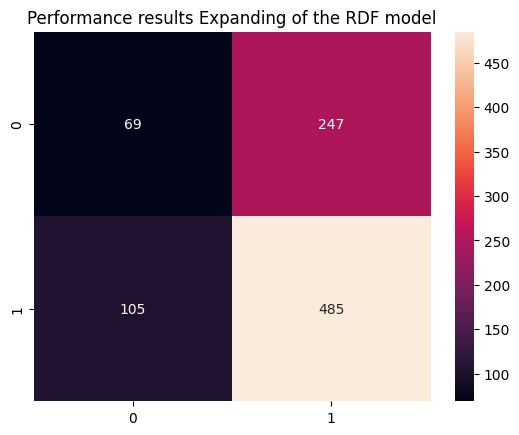


Feature Importance of the model



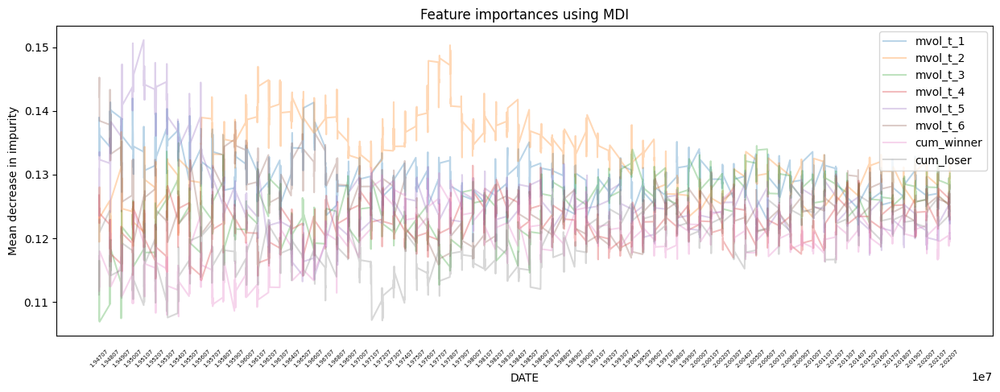

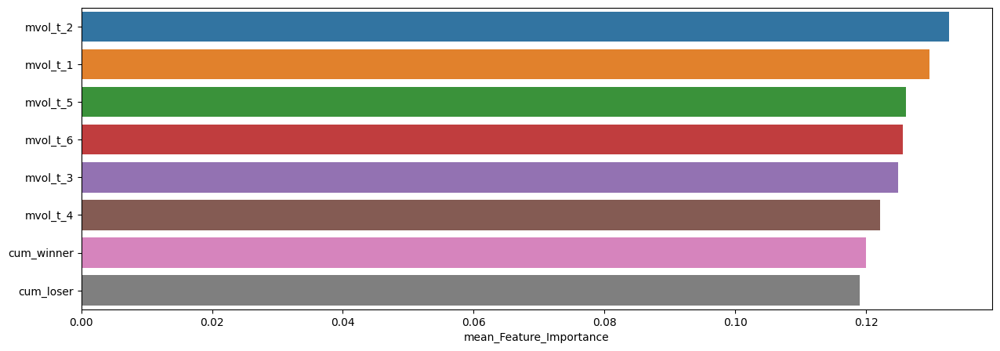

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.132632,0.150324,0.117527
mvol_t_1,0.129672,0.141964,0.119468
mvol_t_5,0.126077,0.151136,0.113203
mvol_t_6,0.125592,0.145251,0.115833
mvol_t_3,0.124918,0.134960,0.106881
mvol_t_4,0.122141,0.131420,0.113382
cum_winner,0.120014,0.131077,0.107719
cum_loser,0.118954,0.128439,0.107090


In [46]:
Expanding_RDF_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                      model=RDF, # 사용할 모델
                                      model_name='RDF', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.31      0.21      0.25        75
         1.0       0.66      0.77      0.71       151

    accuracy                           0.58       226
   macro avg       0.49      0.49      0.48       226
weighted avg       0.55      0.58      0.56       226


accuracy : 0.584070796460177

precision : 0.6628571428571428

recall : 0.7682119205298014

F1-Score : 0.7116564417177915



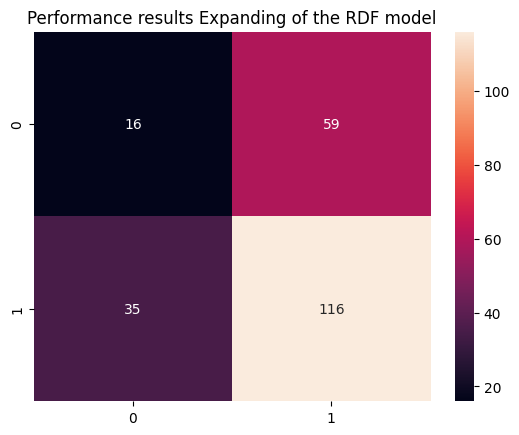


Feature Importance of the model



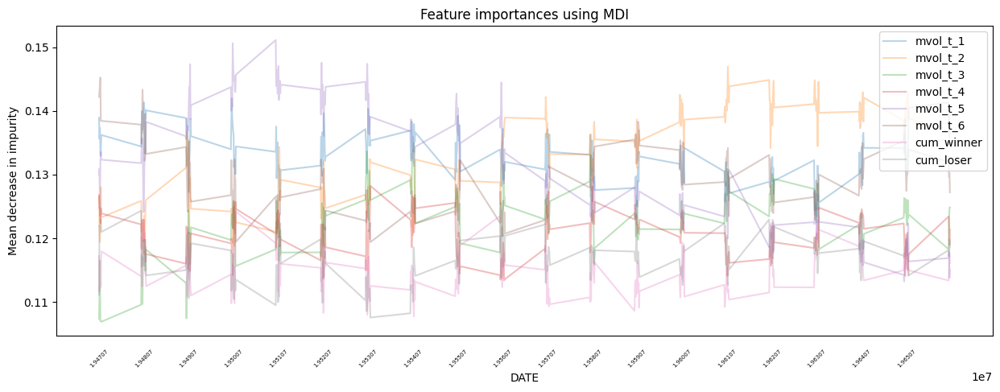

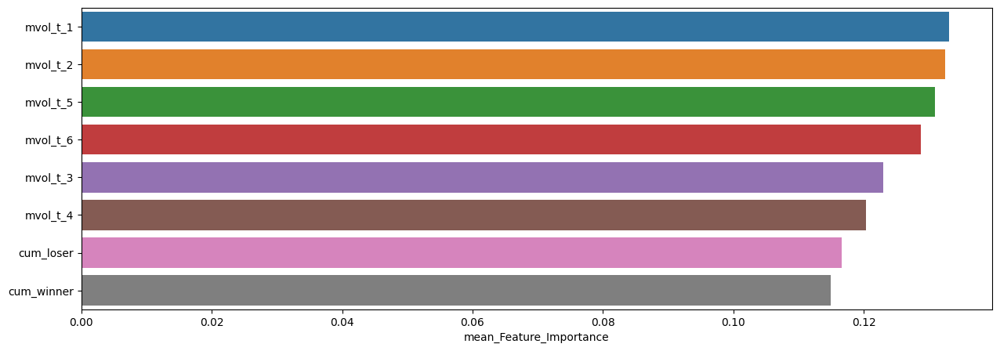

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.133019,0.141964,0.122480
mvol_t_2,0.132496,0.146953,0.117527
mvol_t_5,0.130926,0.151136,0.113203
mvol_t_6,0.128774,0.145251,0.119388
mvol_t_3,0.122958,0.134960,0.106881
mvol_t_4,0.120289,0.128225,0.113382
cum_loser,0.116639,0.124332,0.107546
cum_winner,0.114899,0.124203,0.107719



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.25      0.32        75
         1.0       0.69      0.84      0.76       151

    accuracy                           0.65       226
   macro avg       0.57      0.55      0.54       226
weighted avg       0.61      0.65      0.61       226


accuracy : 0.6460176991150443

precision : 0.6939890710382514

recall : 0.8410596026490066

F1-Score : 0.7604790419161677



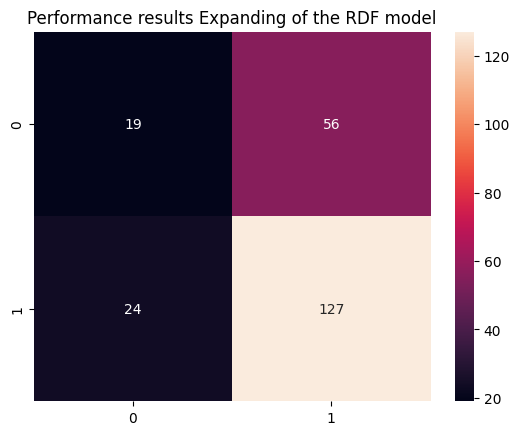


Feature Importance of the model



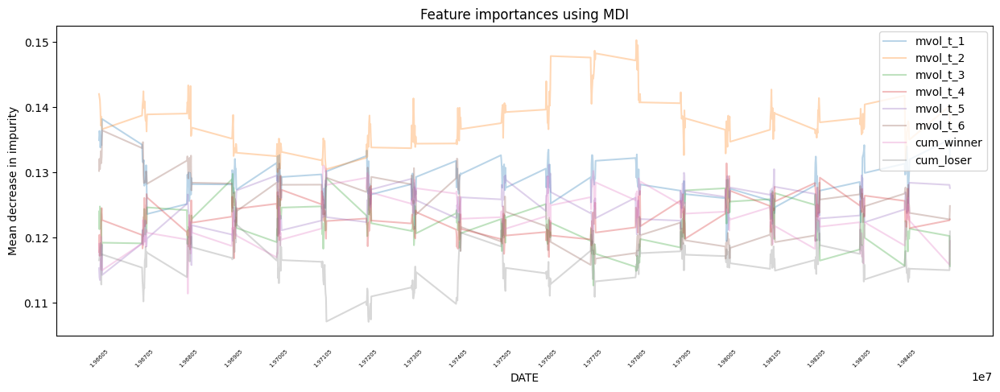

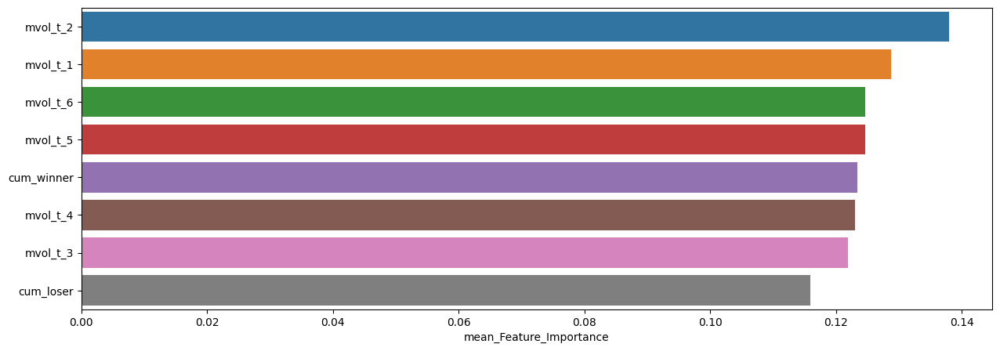

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.137936,0.150324,0.130062
mvol_t_1,0.128699,0.138209,0.119468
mvol_t_6,0.124641,0.136469,0.115833
mvol_t_5,0.124586,0.131206,0.113498
cum_winner,0.123364,0.131077,0.111421
mvol_t_4,0.123066,0.131420,0.116851
mvol_t_3,0.121838,0.129791,0.112665
cum_loser,0.115870,0.124651,0.107090



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.46      0.19      0.27        70
         1.0       0.71      0.90      0.80       156

    accuracy                           0.68       226
   macro avg       0.59      0.54      0.53       226
weighted avg       0.64      0.68      0.63       226


accuracy : 0.6814159292035398

precision : 0.7121212121212122

recall : 0.9038461538461539

F1-Score : 0.7966101694915254



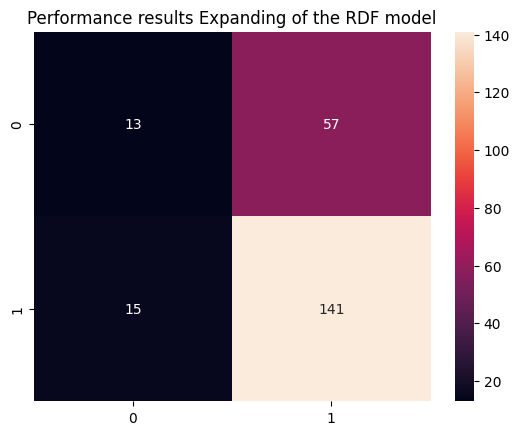


Feature Importance of the model



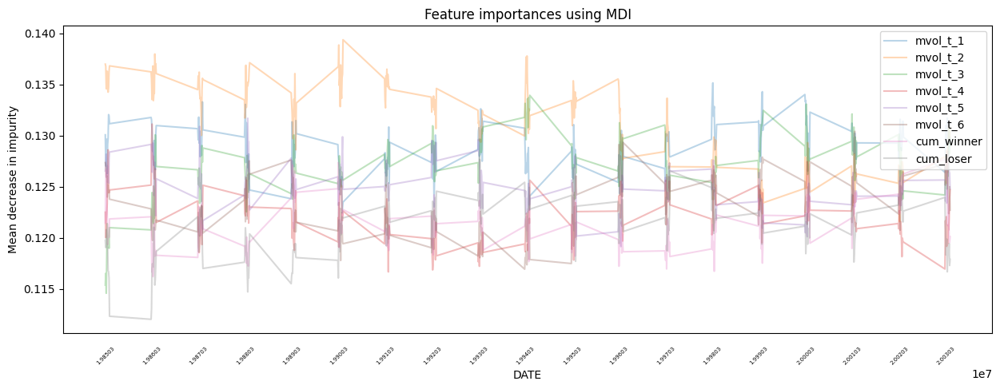

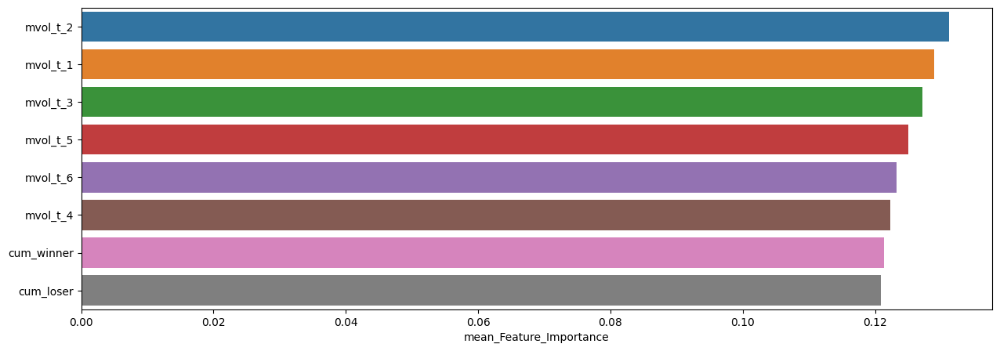

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.131154,0.139383,0.121587
mvol_t_1,0.128894,0.135156,0.122441
mvol_t_3,0.127110,0.133944,0.114575
mvol_t_5,0.125033,0.131699,0.119140
mvol_t_6,0.123294,0.130416,0.116930
mvol_t_4,0.122259,0.131129,0.116663
cum_winner,0.121335,0.127670,0.116204
cum_loser,0.120923,0.127656,0.112024



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.22      0.28        96
         1.0       0.57      0.77      0.66       132

    accuracy                           0.54       228
   macro avg       0.49      0.49      0.47       228
weighted avg       0.50      0.54      0.50       228


accuracy : 0.5350877192982456

precision : 0.5738636363636364

recall : 0.7651515151515151

F1-Score : 0.6558441558441559



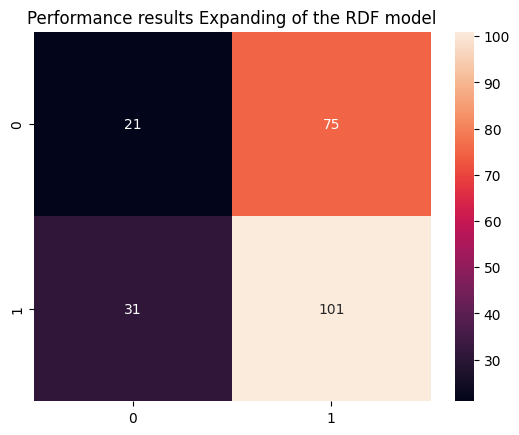


Feature Importance of the model



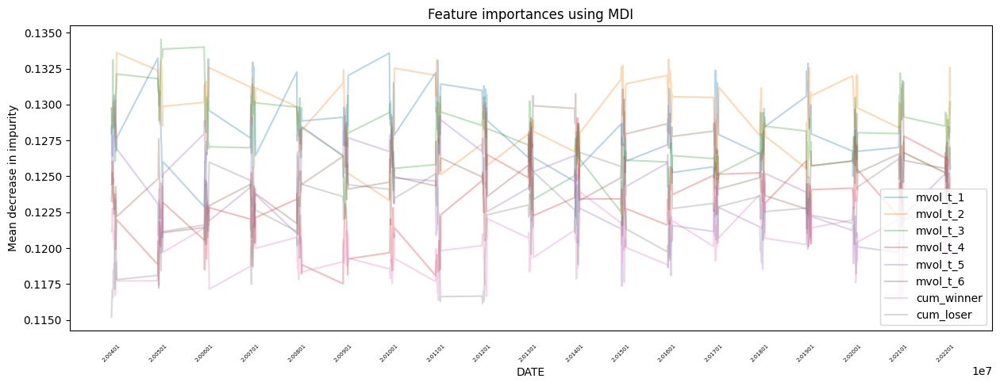

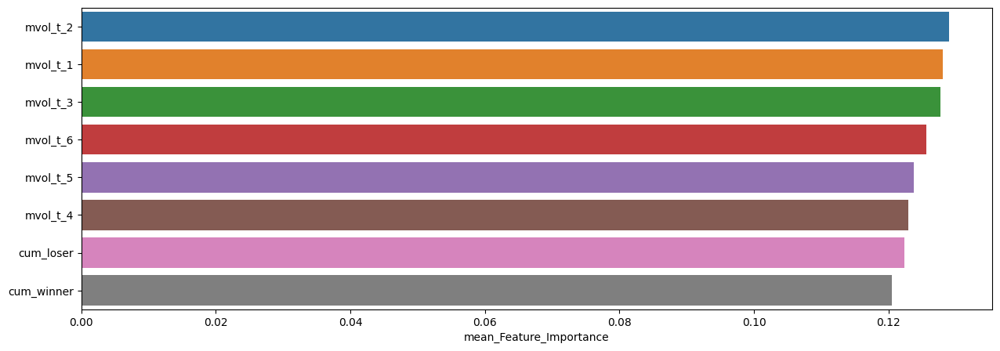

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.128976,0.133602,0.122354
mvol_t_1,0.128090,0.133577,0.122099
mvol_t_3,0.127741,0.134524,0.121592
mvol_t_6,0.125659,0.131667,0.120118
mvol_t_5,0.123783,0.130317,0.117355
mvol_t_4,0.122943,0.129059,0.117235
cum_loser,0.122354,0.128439,0.115213
cum_winner,0.120452,0.125225,0.116372


In [47]:
slice_feature_importance(Expanding_RDF_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'RDF') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



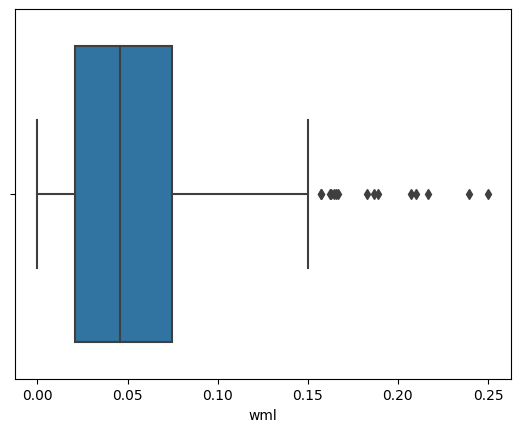

,count,mean,std,min,25%,50%,75%,max
wml,485.0,0.053955,0.04308,0.000007,0.02099,0.045557,0.074403,0.250175



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



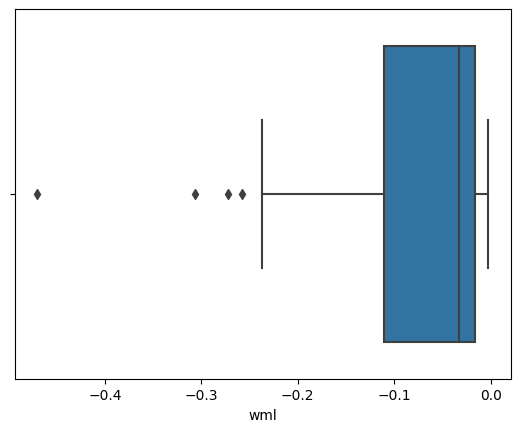

,count,mean,std,min,25%,50%,75%,max
wml,69.0,-0.075471,0.090243,-0.469903,-0.110849,-0.032673,-0.01578,-0.002394



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



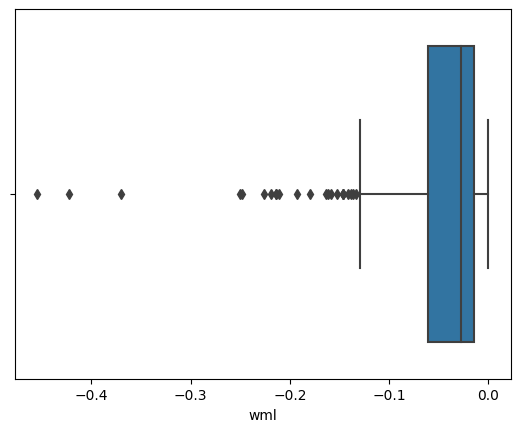

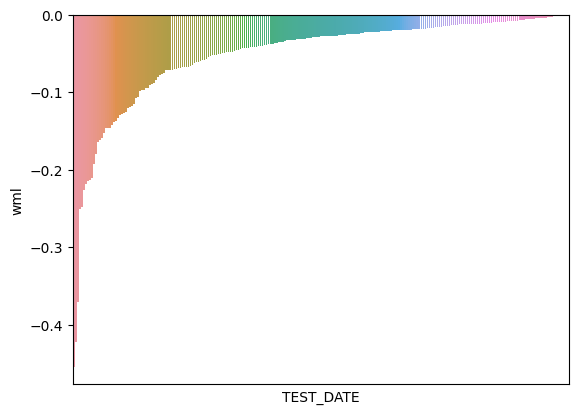

,count,mean,std,min,25%,50%,75%,max
wml,247.0,-0.050959,0.064148,-0.454349,-0.061227,-0.027746,-0.014422,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



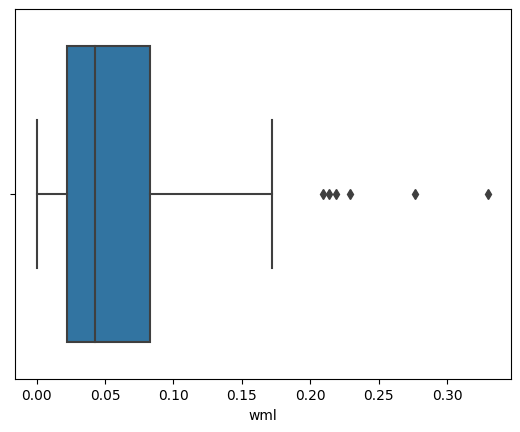

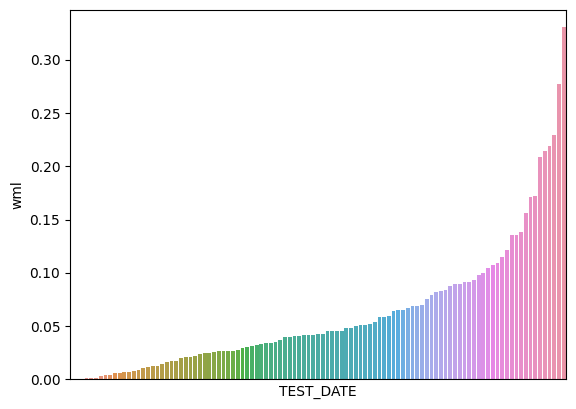

,count,mean,std,min,25%,50%,75%,max
wml,105.0,0.061232,0.061067,0.000577,0.022367,0.042495,0.08272,0.330163


In [48]:
RDF_A0_P1, RDF_A1_P0 = What_Pred(Expanding_RDF_Result, WML, 'RDF')

Sharpe Ratio : 0.65277

최근 누적 수익률

  2022년-12월 -> 99453.84
  2022년-11월 -> 89606.07
  2022년-10월 -> 89606.07
  2022년-09월 -> 79344.92
  2022년-08월 -> 79344.92

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 138904.05
  2등 : 2002년-08월 -> 117451.67
  3등 : 2002년-07월 -> 117451.67
  4등 : 2002년-10월 -> 112075.01
  5등 : 2002년-06월 -> 111359.88
  6등 : 2009년-02월 -> 102192.18
  7등 : 2022년-12월 -> 99453.84
  8등 : 2002년-05월 -> 95756.36
  9등 : 2008년-11월 -> 93201.23
  10등 : 2009년-01월 -> 90995.23



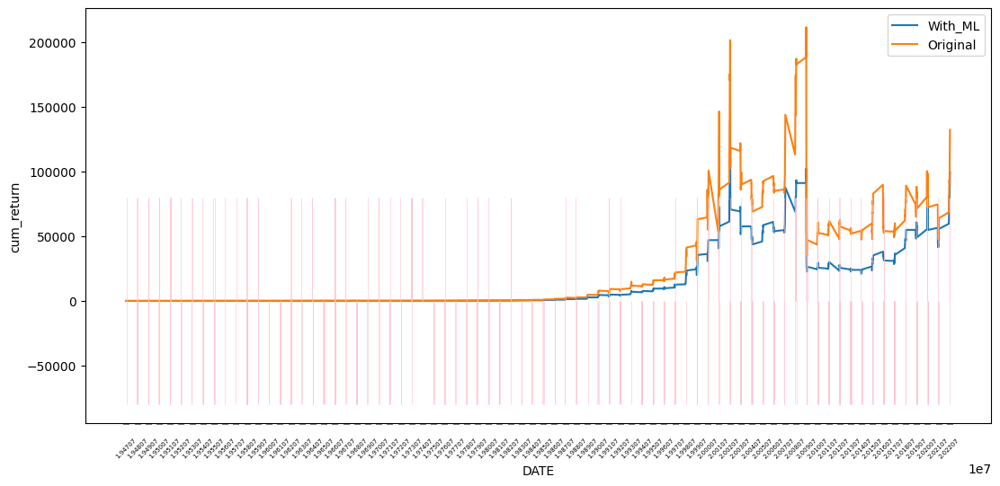

In [49]:
RDF_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_RDF_Result,
                                                 WML,
                                                 'RDF_PRED_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.71491

최근 누적 수익률

  2022년-12월 -> 12047.76
  2022년-11월 -> 11290.78
  2022년-10월 -> 11063.77
  2022년-09월 -> 10145.27
  2022년-08월 -> 9690.11

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 12047.76
  2등 : 2009년-02월 -> 11520.70
  3등 : 2022년-11월 -> 11290.78
  4등 : 2022년-10월 -> 11063.77
  5등 : 2008년-11월 -> 10811.01
  6등 : 2009년-01월 -> 10716.26
  7등 : 2008년-12월 -> 10588.37
  8등 : 2022년-09월 -> 10145.27
  9등 : 2002년-09월 -> 10102.98
  10등 : 2008년-10월 -> 10035.46



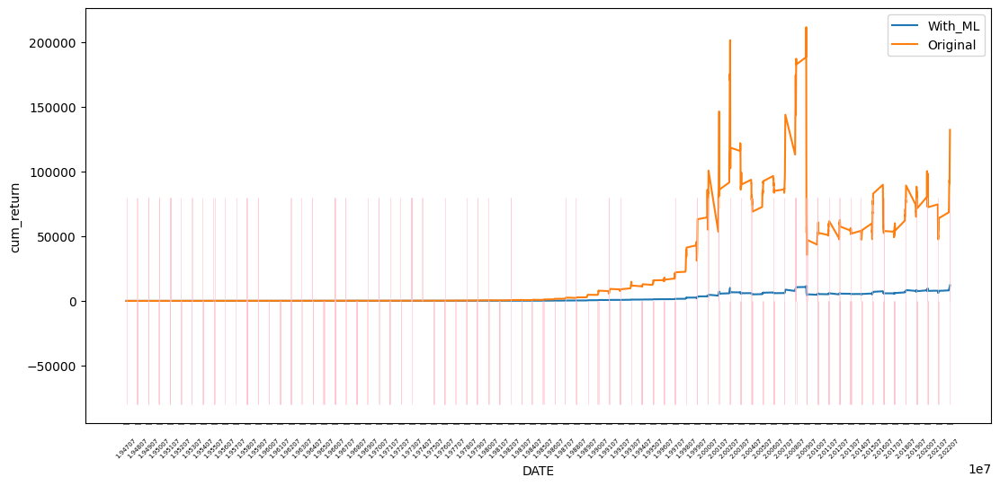

In [50]:
RDF_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_RDF_Result,
                                                 WML,
                                                 'RDF_PROB_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

### Grdient Boosting

In [51]:
GBC_Param = {}
GBC = GradientBoostingClassifier(*GBC_Param, random_state=42)

**************************************************

GBC Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   ccp_alpha : 0.0
   criterion : friedman_mse
   init : None
   learning_rate : 0.1
   loss : log_loss
   max_depth : 3
   max_features : None
   max_leaf_nodes : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_iter_no_change : None
   random_state : 42
   subsample : 1.0
   tol : 0.0001
   validation_fraction : 0.1
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.21      0.27       316
         1.0       0.66      0.83      0.73       590

    accuracy                           0.61       906
   macro avg       0.52      0.52      0.50       906
weighted avg       0.57      0.61      0.57       906


accuracy : 0.6103752759381899

precision : 0.6603518267929634

recall : 0.8271186440677966

F1-Score : 0.7343867569601205



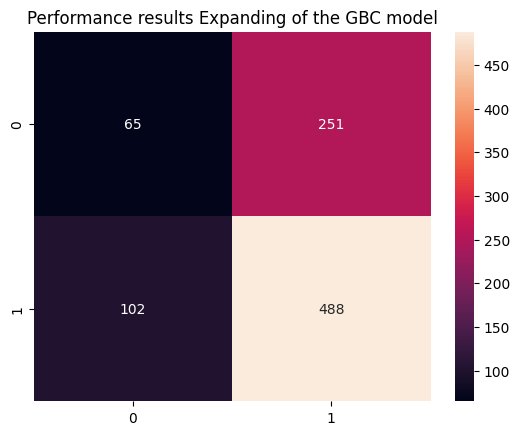


Feature Importance of the model



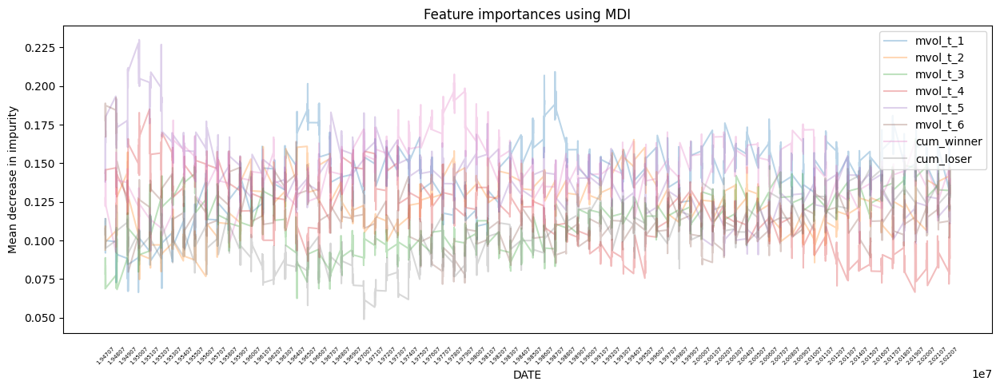

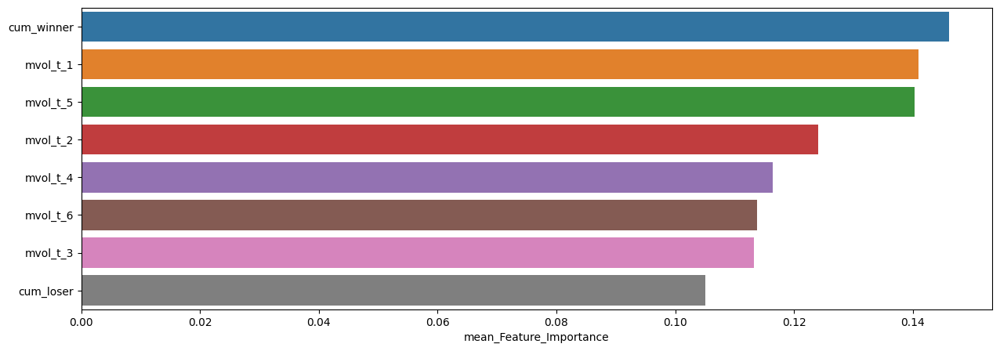

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner,0.146079,0.207632,0.092546
mvol_t_1,0.140990,0.209270,0.066377
mvol_t_5,0.140372,0.230011,0.090085
mvol_t_2,0.124061,0.165317,0.074733
mvol_t_4,0.116447,0.185005,0.066505
mvol_t_6,0.113816,0.192509,0.071711
mvol_t_3,0.113199,0.165821,0.062486
cum_loser,0.105036,0.151859,0.048935


In [52]:
Expanding_GBC_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                      model=GBC, # 사용할 모델
                                      model_name='GBC', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.36      0.28      0.31        75
         1.0       0.68      0.75      0.71       151

    accuracy                           0.59       226
   macro avg       0.52      0.51      0.51       226
weighted avg       0.57      0.59      0.58       226


accuracy : 0.5929203539823009

precision : 0.6766467065868264

recall : 0.7483443708609272

F1-Score : 0.7106918238993712



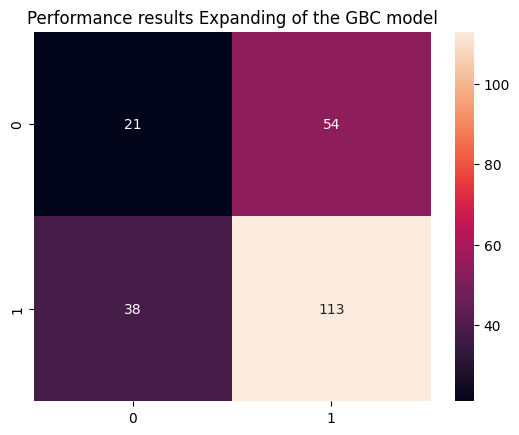


Feature Importance of the model



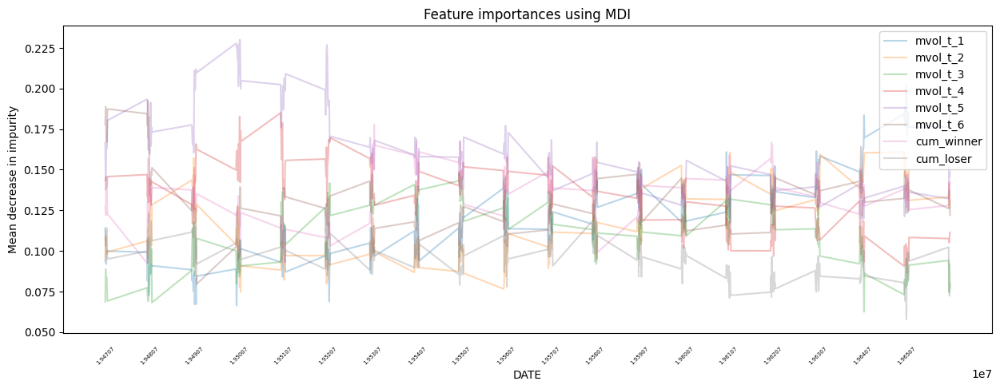

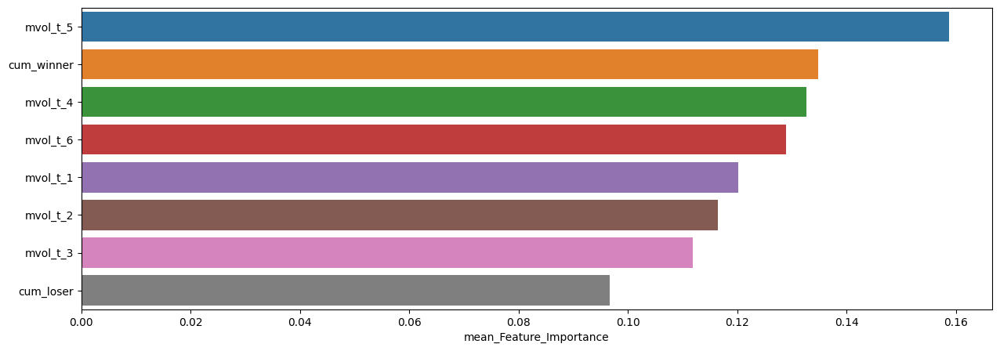

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.158679,0.230011,0.116799
cum_winner,0.134776,0.177838,0.092546
mvol_t_4,0.132601,0.185005,0.086553
mvol_t_6,0.128849,0.192509,0.079569
mvol_t_1,0.120119,0.201533,0.066377
mvol_t_2,0.116408,0.160950,0.074733
mvol_t_3,0.111897,0.147676,0.062486
cum_loser,0.096671,0.136602,0.057944



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.23      0.30        75
         1.0       0.69      0.85      0.76       151

    accuracy                           0.65       226
   macro avg       0.56      0.54      0.53       226
weighted avg       0.61      0.65      0.61       226


accuracy : 0.6460176991150443

precision : 0.6898395721925134

recall : 0.8543046357615894

F1-Score : 0.7633136094674556



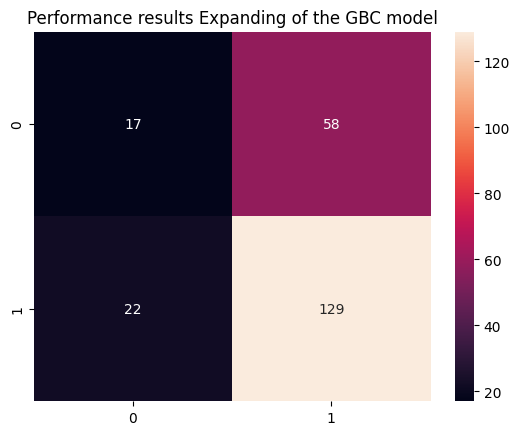


Feature Importance of the model



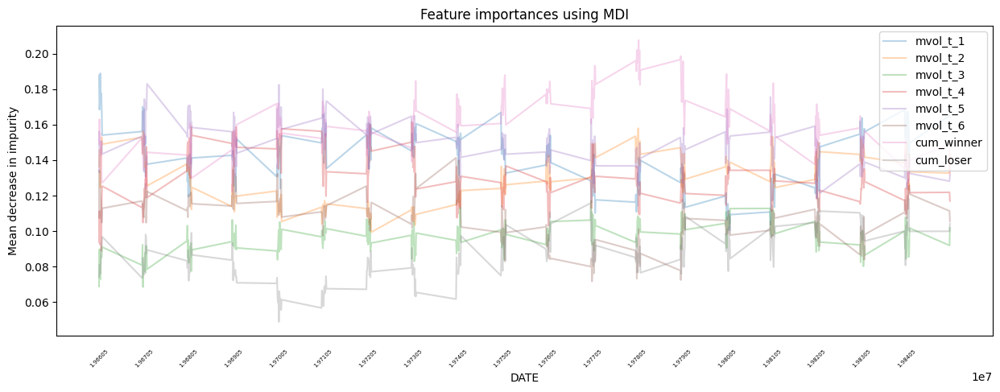

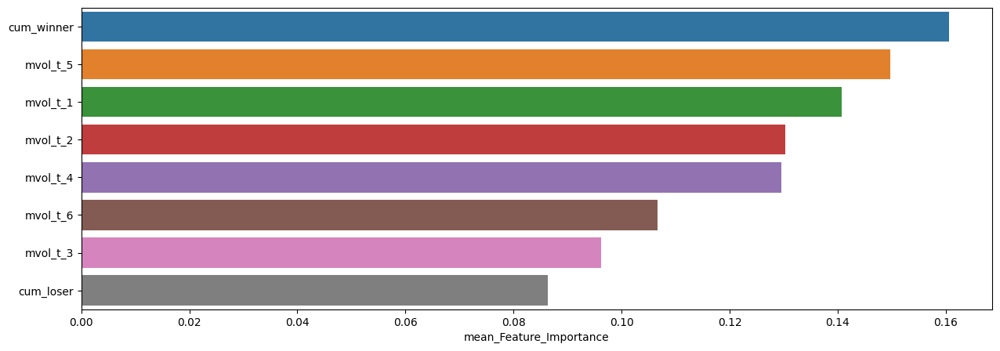

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner,0.160556,0.207632,0.122098
mvol_t_5,0.149781,0.183004,0.118850
mvol_t_1,0.140692,0.188930,0.100481
mvol_t_2,0.130267,0.157985,0.099439
mvol_t_4,0.129524,0.161476,0.088972
mvol_t_6,0.106609,0.141347,0.071711
mvol_t_3,0.096276,0.116936,0.068550
cum_loser,0.086295,0.118541,0.048935



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.50      0.17      0.26        70
         1.0       0.71      0.92      0.80       156

    accuracy                           0.69       226
   macro avg       0.61      0.55      0.53       226
weighted avg       0.65      0.69      0.63       226


accuracy : 0.6902654867256637

precision : 0.7128712871287128

recall : 0.9230769230769231

F1-Score : 0.8044692737430168



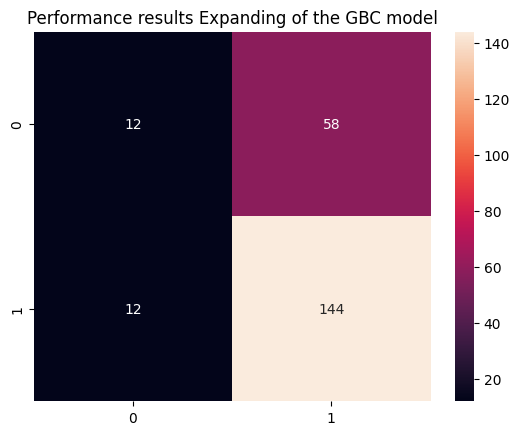


Feature Importance of the model



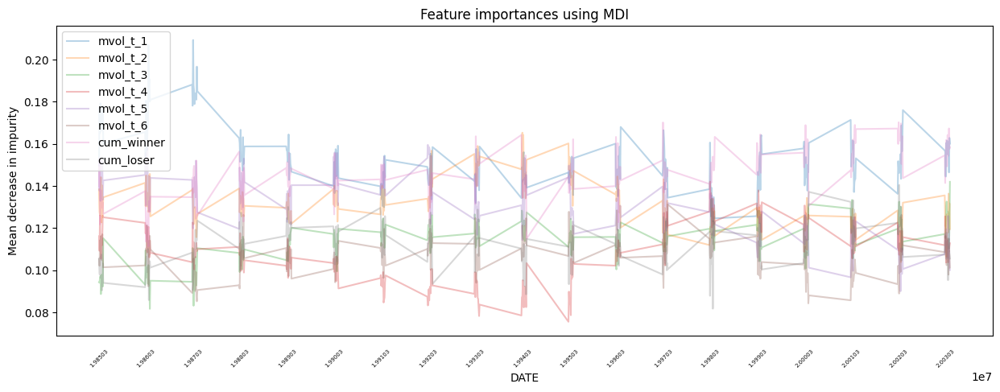

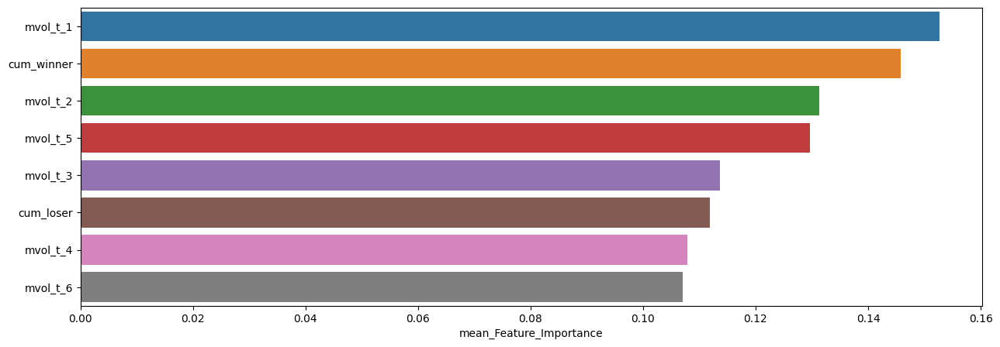

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.152648,0.209270,0.123152
cum_winner,0.145802,0.170235,0.111381
mvol_t_2,0.131370,0.165317,0.103948
mvol_t_5,0.129689,0.160290,0.090085
mvol_t_3,0.113675,0.141988,0.081725
cum_loser,0.111885,0.140508,0.081800
mvol_t_4,0.107910,0.142071,0.075595
mvol_t_6,0.107022,0.131282,0.084322



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.33      0.16      0.21        96
         1.0       0.56      0.77      0.65       132

    accuracy                           0.51       228
   macro avg       0.45      0.46      0.43       228
weighted avg       0.46      0.51      0.46       228


accuracy : 0.5131578947368421

precision : 0.5573770491803278

recall : 0.7727272727272727

F1-Score : 0.6476190476190475



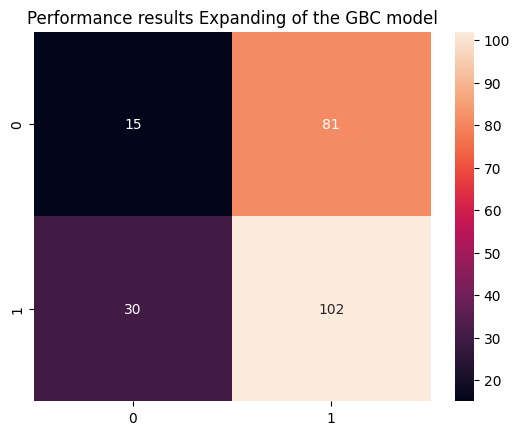


Feature Importance of the model



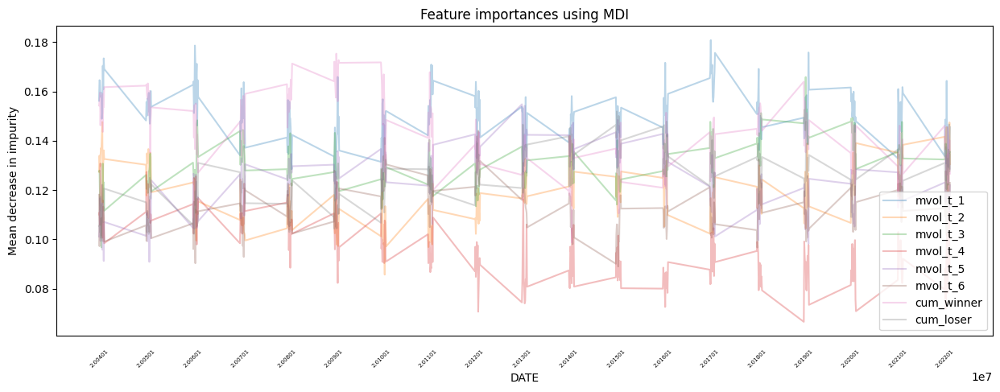

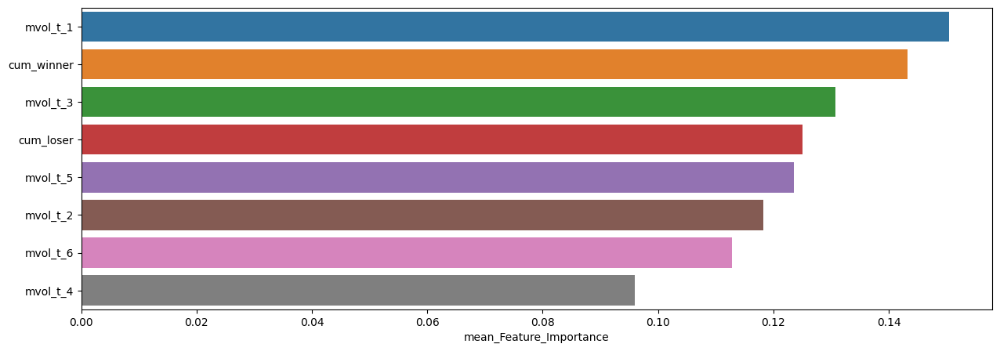

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.150418,0.180811,0.115459
cum_winner,0.143209,0.175316,0.098772
mvol_t_3,0.130794,0.165821,0.096706
cum_loser,0.125113,0.151859,0.100596
mvol_t_5,0.123488,0.154776,0.090846
mvol_t_2,0.118251,0.147572,0.085650
mvol_t_6,0.112793,0.144049,0.088938
mvol_t_4,0.095934,0.130745,0.066505


In [53]:
slice_feature_importance(Expanding_GBC_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'GBC') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



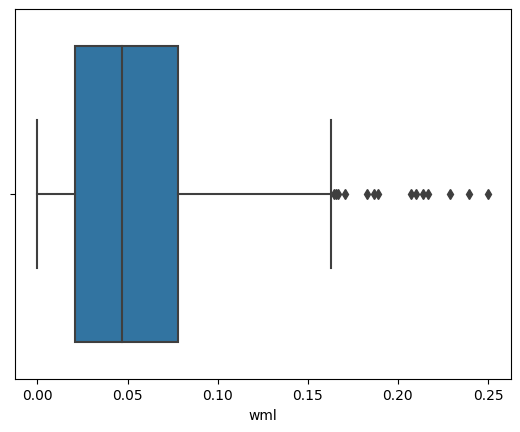

,count,mean,std,min,25%,50%,75%,max
wml,488.0,0.0552,0.044815,0.000007,0.020888,0.046719,0.077935,0.250175



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



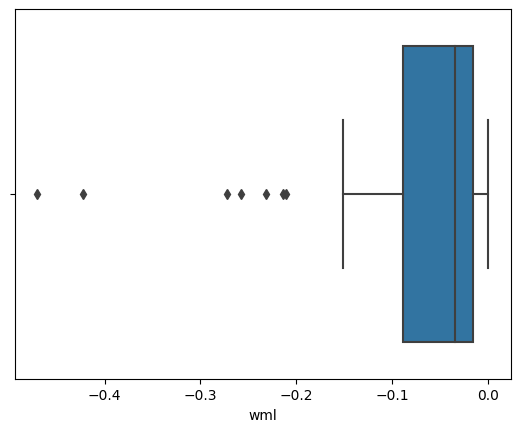

,count,mean,std,min,25%,50%,75%,max
wml,65.0,-0.071196,0.093535,-0.469903,-0.089388,-0.034739,-0.01578,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



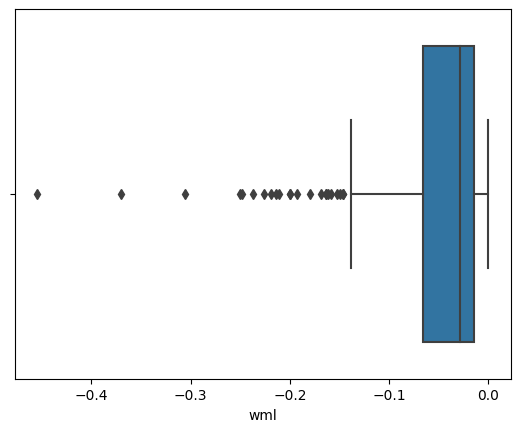

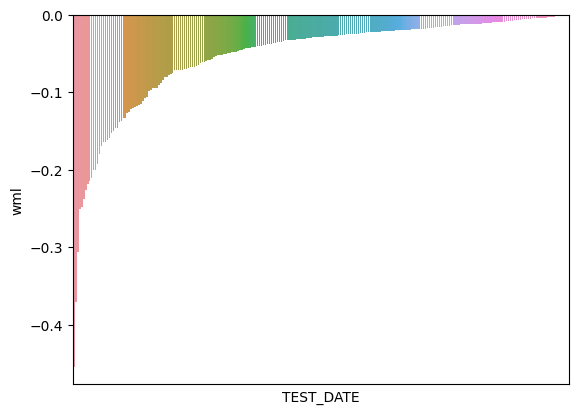

,count,mean,std,min,25%,50%,75%,max
wml,251.0,-0.052456,0.063887,-0.454349,-0.065645,-0.028359,-0.014422,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



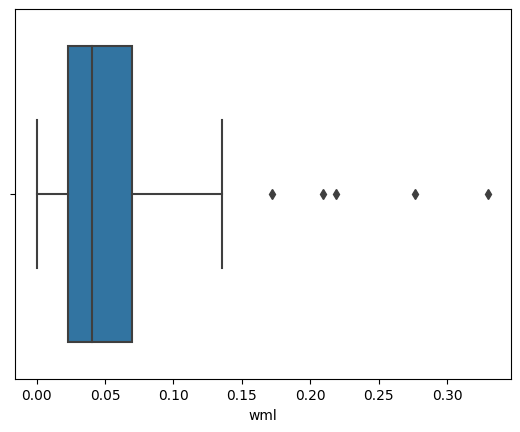

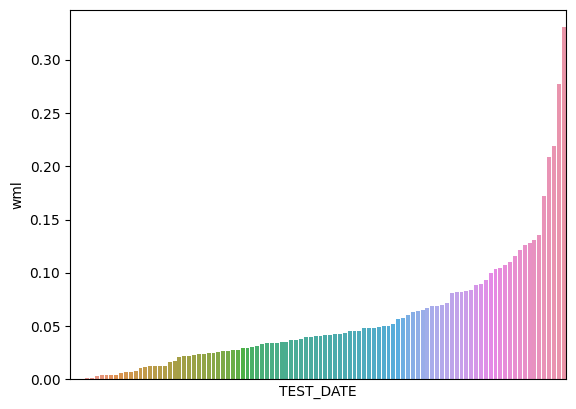

,count,mean,std,min,25%,50%,75%,max
wml,102.0,0.05549,0.055631,0.000577,0.022776,0.040552,0.06936,0.330163


In [54]:
GBC_A0_P1, GBC_A1_P0 = What_Pred(Expanding_GBC_Result, WML, 'GBC')

Sharpe Ratio : 0.66627

최근 누적 수익률

  2022년-12월 -> 110588.68
  2022년-11월 -> 110588.68
  2022년-10월 -> 105193.13
  2022년-09월 -> 93147.06
  2022년-08월 -> 84684.45

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 115815.53
  2등 : 2022년-12월 -> 110588.68
  3등 : 2022년-11월 -> 110588.68
  4등 : 2022년-10월 -> 105193.13
  5등 : 2020년-09월 -> 101329.50
  6등 : 2020년-10월 -> 100980.36
  7등 : 2002년-07월 -> 100850.69
  8등 : 2020년-08월 -> 100425.69
  9등 : 2007년-12월 -> 98037.01
  10등 : 2002년-08월 -> 97928.93



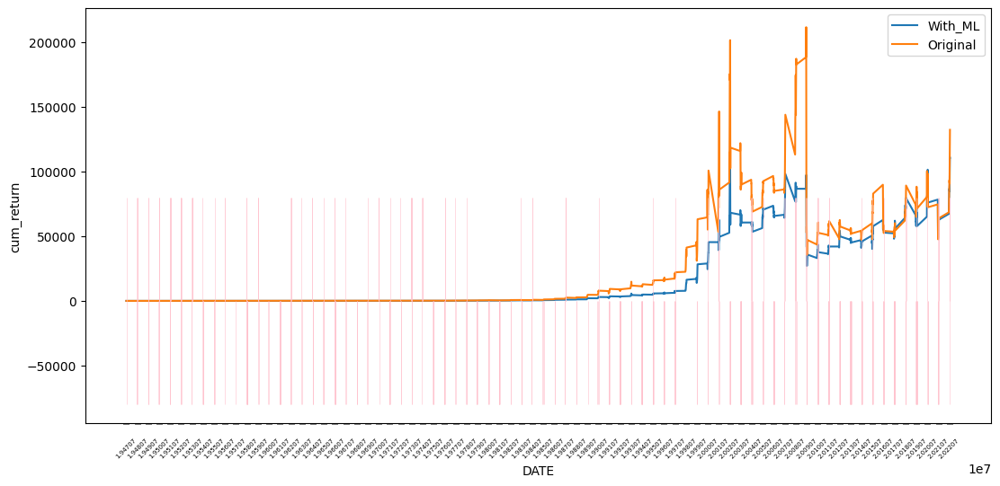

In [55]:
GBC_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_GBC_Result,
                                                 WML,
                                                 'GBC_PRED_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.72742

최근 누적 수익률

  2022년-12월 -> 11725.15
  2022년-11월 -> 11160.54
  2022년-10월 -> 10863.00
  2022년-09월 -> 10167.40
  2022년-08월 -> 9609.65

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 12488.81
  2등 : 2002년-09월 -> 12122.45
  3등 : 2022년-12월 -> 11725.15
  4등 : 2008년-11월 -> 11599.66
  5등 : 2009년-01월 -> 11470.98
  6등 : 2008년-12월 -> 11357.54
  7등 : 2022년-11월 -> 11160.54
  8등 : 2008년-06월 -> 10916.01
  9등 : 2002년-07월 -> 10886.28
  10등 : 2022년-10월 -> 10863.00



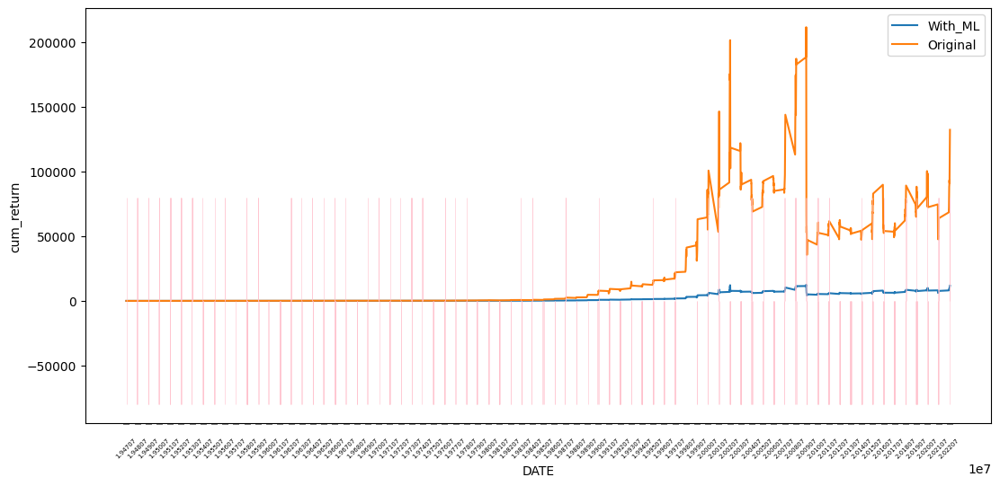

In [56]:
GBC_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_GBC_Result,
                                                  WML,
                                                  'GBC_PROB_POS_WML',
                                                  GBC_A0_P1,
                                                  GBC_A1_P0,
                                                  plot=True)

### XGB

In [57]:
XGB_Param = {}
XGB = XGBClassifier(**XGB_Param, random_state=42)

**************************************************

XGB Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   objective : binary:logistic
   use_label_encoder : None
   base_score : None
   booster : None
   callbacks : None
   colsample_bylevel : None
   colsample_bynode : None
   colsample_bytree : None
   early_stopping_rounds : None
   enable_categorical : False
   eval_metric : None
   feature_types : None
   gamma : None
   gpu_id : None
   grow_policy : None
   importance_type : None
   interaction_constraints : None
   learning_rate : None
   max_bin : None
   max_cat_threshold : None
   max_cat_to_onehot : None
   max_delta_step : None
   max_depth : None
   max_leaves : None
   min_child_weight : None
   missing : nan
   monotone_constraints : None
   n_estimators : 100
   n_jobs : None
   num_parallel_tree : None
   predictor : None
   random_state : 42
   reg_alpha : None
   reg_lambda : None
   sampling_method : None
   scale_pos_weight : None
   subsample : No

  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.31      0.35       316
         1.0       0.67      0.76      0.71       590

    accuracy                           0.60       906
   macro avg       0.54      0.53      0.53       906
weighted avg       0.58      0.60      0.59       906


accuracy : 0.6004415011037527

precision : 0.6711711711711712

recall : 0.7576271186440678

F1-Score : 0.711783439490446



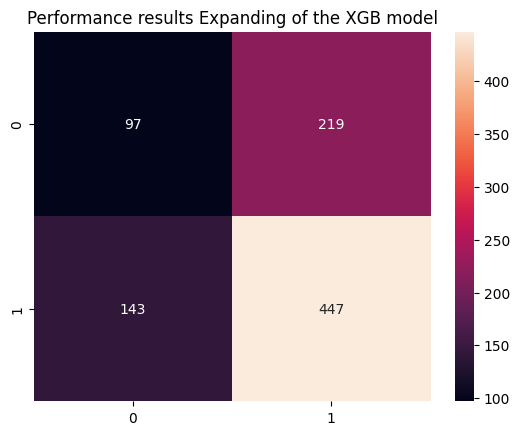


Feature Importance of the model



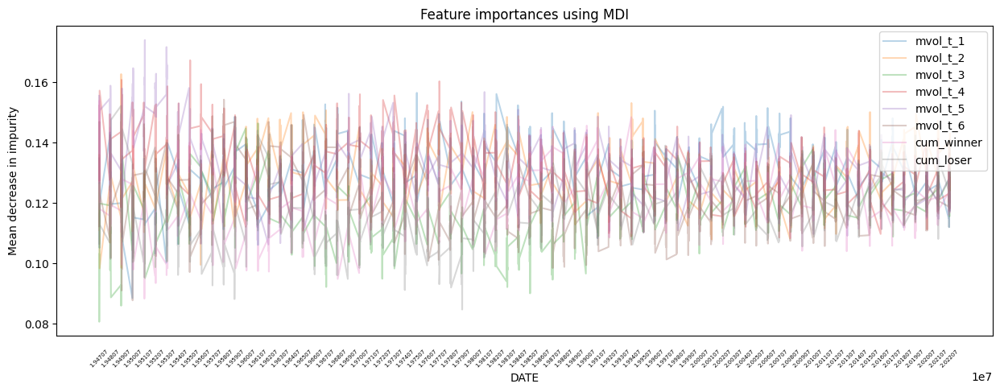

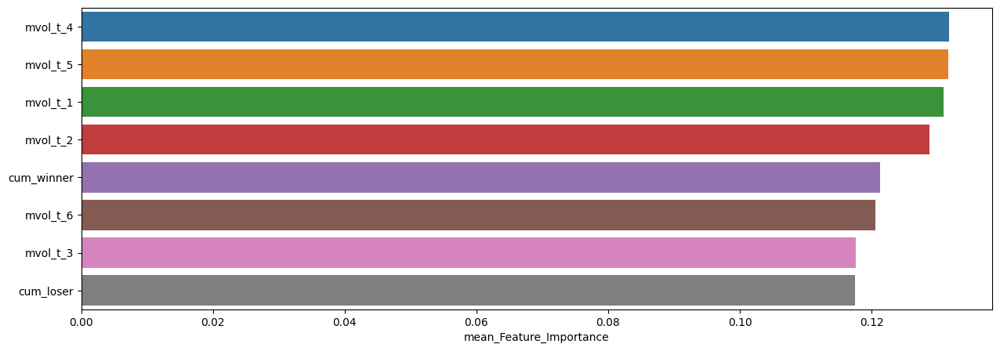

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_4,0.131728,0.167197,0.108570
mvol_t_5,0.131678,0.173892,0.106258
mvol_t_1,0.130925,0.156430,0.088528
mvol_t_2,0.128742,0.162636,0.098378
cum_winner,0.121258,0.153851,0.088347
mvol_t_6,0.120623,0.154187,0.087783
mvol_t_3,0.117584,0.146343,0.080708
cum_loser,0.117462,0.152120,0.084758


In [58]:
Expanding_XGB_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                  model=XGB, # 사용할 모델
                                  model_name='XGB', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.36      0.36        75
         1.0       0.69      0.70      0.69       151

    accuracy                           0.58       226
   macro avg       0.53      0.53      0.53       226
weighted avg       0.58      0.58      0.58       226


accuracy : 0.584070796460177

precision : 0.6862745098039216

recall : 0.695364238410596

F1-Score : 0.6907894736842106



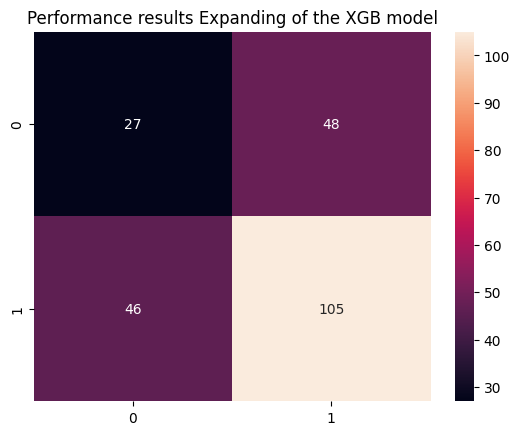


Feature Importance of the model



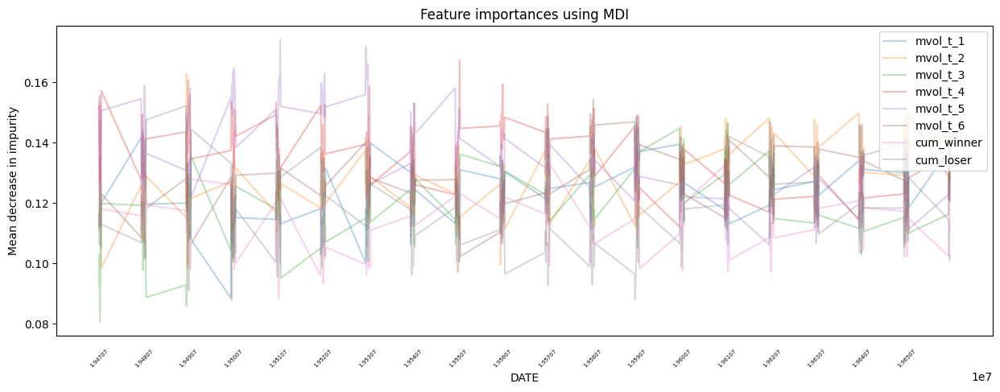

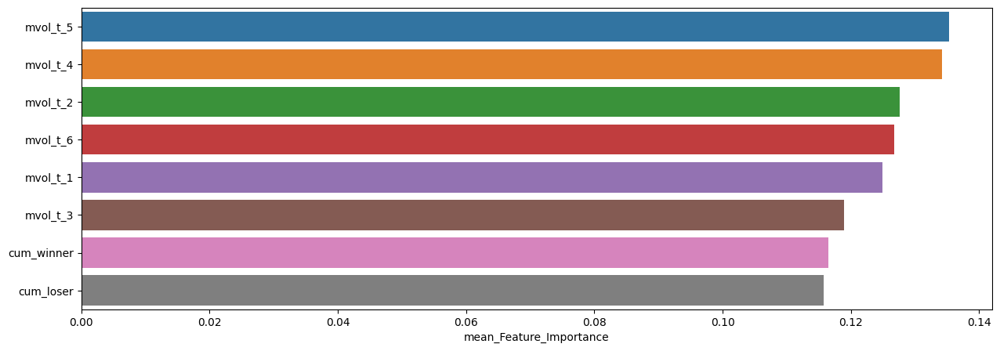

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.135279,0.173892,0.106258
mvol_t_4,0.134248,0.167197,0.110806
mvol_t_2,0.127661,0.162636,0.098378
mvol_t_6,0.126699,0.154187,0.087783
mvol_t_1,0.124931,0.148517,0.088528
mvol_t_3,0.118890,0.146343,0.080708
cum_winner,0.116492,0.153851,0.088347
cum_loser,0.115800,0.152120,0.088213



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.43      0.31      0.36        75
         1.0       0.70      0.80      0.75       151

    accuracy                           0.64       226
   macro avg       0.57      0.55      0.55       226
weighted avg       0.61      0.64      0.62       226


accuracy : 0.6371681415929203

precision : 0.6994219653179191

recall : 0.8013245033112583

F1-Score : 0.7469135802469136



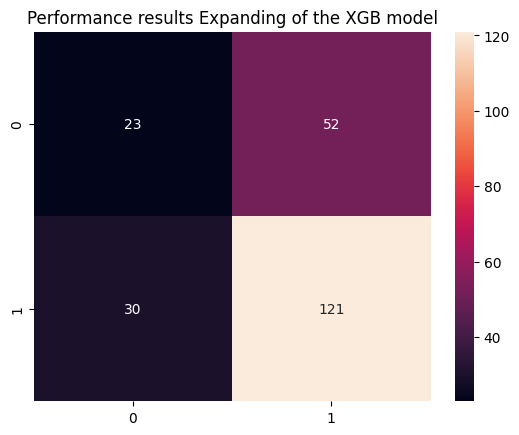


Feature Importance of the model



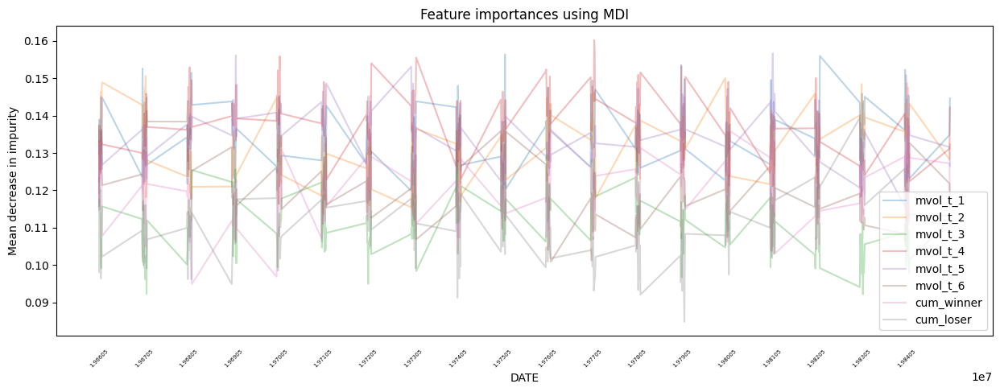

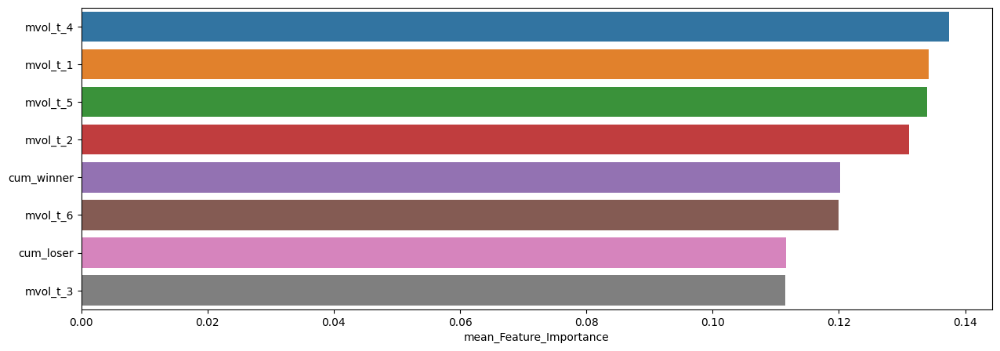

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_4,0.137408,0.160251,0.111854
mvol_t_1,0.134203,0.156430,0.117433
mvol_t_5,0.134015,0.156699,0.114696
mvol_t_2,0.131149,0.150650,0.112353
cum_winner,0.120180,0.147556,0.094859
mvol_t_6,0.119934,0.145256,0.100826
cum_loser,0.111661,0.145913,0.084758
mvol_t_3,0.111449,0.131330,0.092168



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.43      0.27      0.33        70
         1.0       0.72      0.84      0.78       156

    accuracy                           0.66       226
   macro avg       0.58      0.56      0.55       226
weighted avg       0.63      0.66      0.64       226


accuracy : 0.6637168141592921

precision : 0.7197802197802198

recall : 0.8397435897435898

F1-Score : 0.7751479289940829



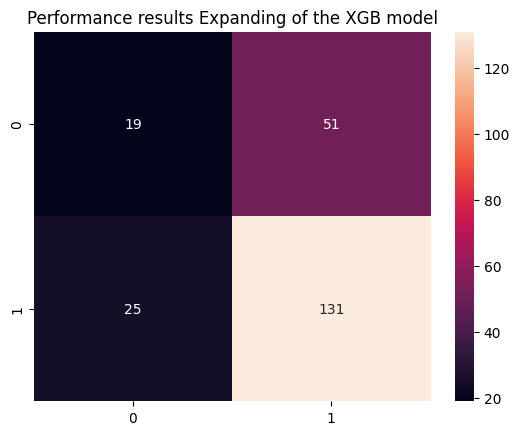


Feature Importance of the model



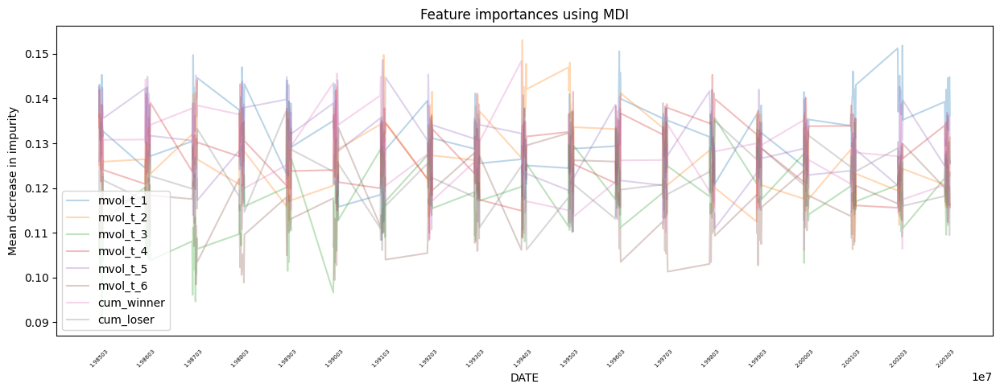

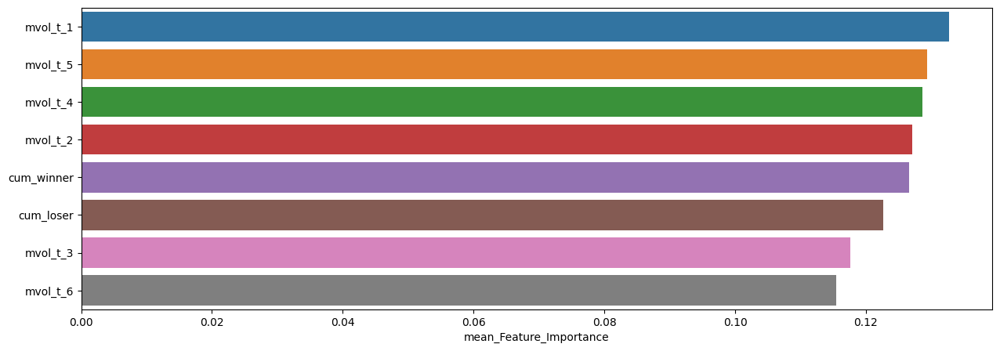

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.132684,0.151842,0.108383
mvol_t_5,0.129347,0.148593,0.110287
mvol_t_4,0.128599,0.145304,0.108974
mvol_t_2,0.127034,0.153062,0.107982
cum_winner,0.126649,0.148382,0.106067
cum_loser,0.122631,0.139371,0.104901
mvol_t_3,0.117614,0.135640,0.090109
mvol_t_6,0.115442,0.137744,0.098462



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.29      0.34        96
         1.0       0.57      0.68      0.62       132

    accuracy                           0.52       228
   macro avg       0.48      0.49      0.48       228
weighted avg       0.50      0.52      0.50       228


accuracy : 0.5175438596491229

precision : 0.569620253164557

recall : 0.6818181818181818

F1-Score : 0.6206896551724138



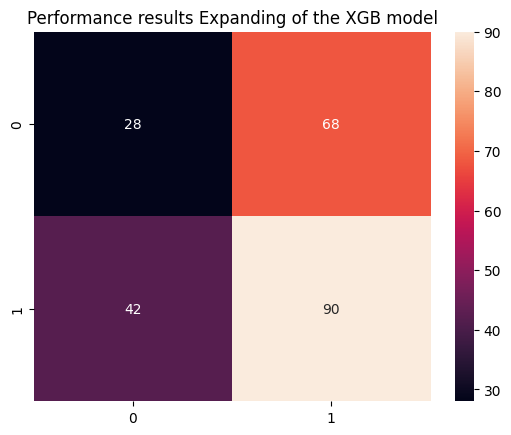


Feature Importance of the model



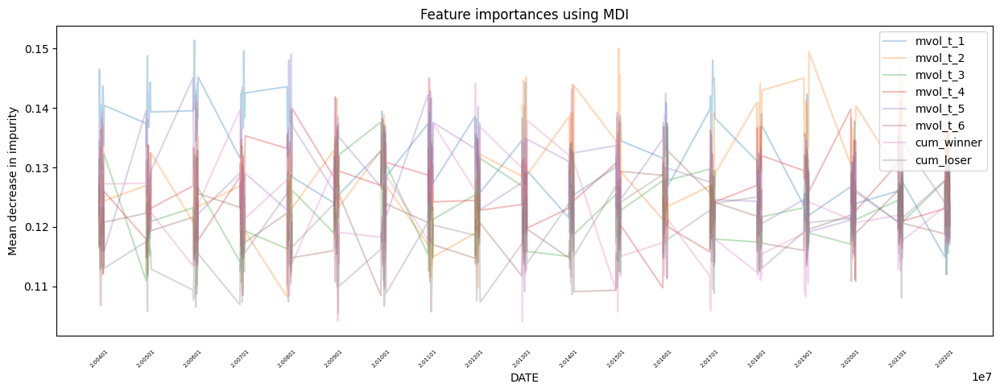

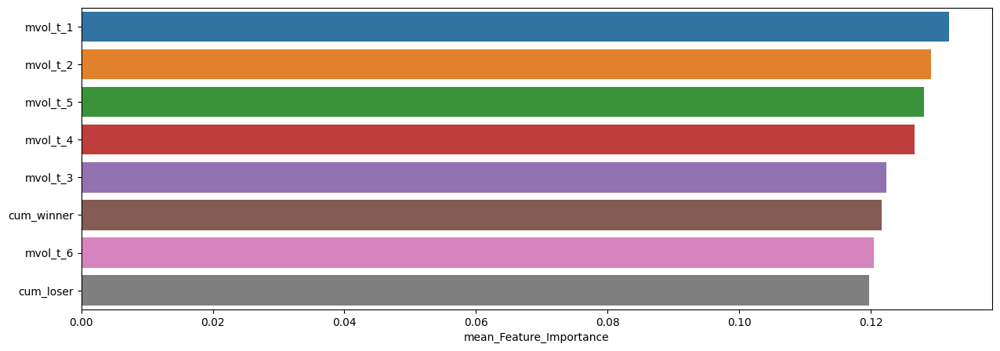

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.131874,0.151409,0.112009
mvol_t_2,0.129122,0.150070,0.108235
mvol_t_5,0.128101,0.149080,0.109137
mvol_t_4,0.126703,0.145035,0.108570
mvol_t_3,0.122340,0.137640,0.108850
cum_winner,0.121705,0.144155,0.104041
mvol_t_6,0.120419,0.141012,0.105738
cum_loser,0.119736,0.134236,0.105600


In [59]:
slice_feature_importance(Expanding_XGB_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'XGB') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



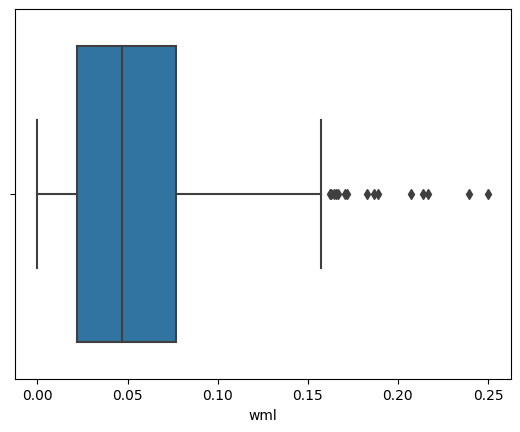

,count,mean,std,min,25%,50%,75%,max
wml,447.0,0.05489,0.043808,0.000007,0.021926,0.047139,0.076866,0.250175



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



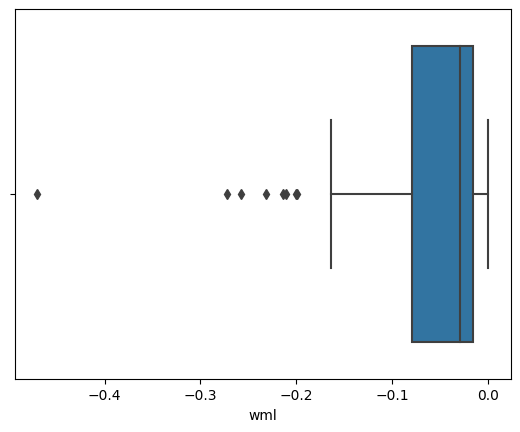

,count,mean,std,min,25%,50%,75%,max
wml,97.0,-0.061478,0.074911,-0.469903,-0.07973,-0.030127,-0.01578,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



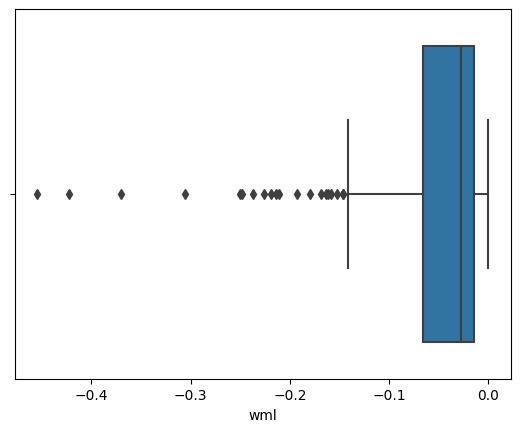

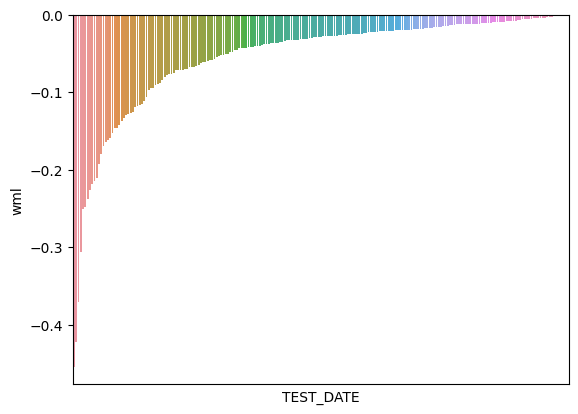

,count,mean,std,min,25%,50%,75%,max
wml,219.0,-0.054022,0.069599,-0.454349,-0.065645,-0.028115,-0.014252,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



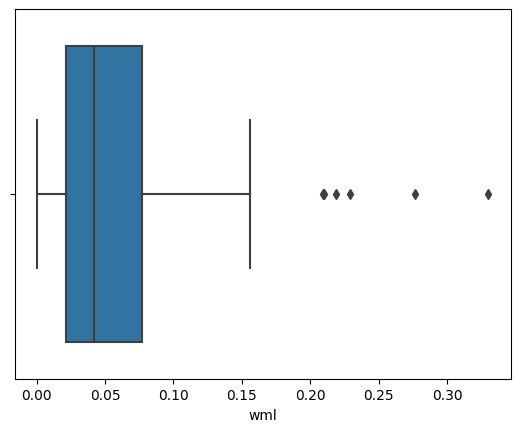

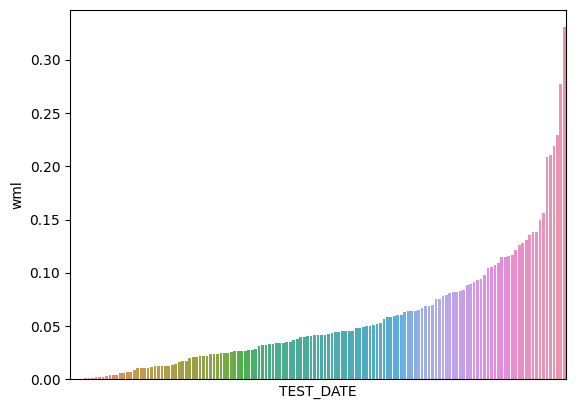

,count,mean,std,min,25%,50%,75%,max
wml,143.0,0.056374,0.055314,0.000577,0.021352,0.041853,0.076875,0.330163


In [60]:
XGB_A0_P1, XGB_A1_P0 = What_Pred(Expanding_XGB_Result, WML, 'XGB')

Sharpe Ratio : 0.66388

최근 누적 수익률

  2022년-12월 -> 42167.74
  2022년-11월 -> 37992.30
  2022년-10월 -> 37992.30
  2022년-09월 -> 33641.58
  2022년-08월 -> 30585.12

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 58524.04
  2등 : 2009년-02월 -> 56742.83
  3등 : 2008년-11월 -> 51750.51
  4등 : 2009년-01월 -> 50525.60
  5등 : 2008년-12월 -> 50525.60
  6등 : 2002년-08월 -> 49485.49
  7등 : 2002년-07월 -> 49485.49
  8등 : 2002년-10월 -> 47220.13
  9등 : 2008년-10월 -> 47192.05
  10등 : 2008년-09월 -> 47192.05



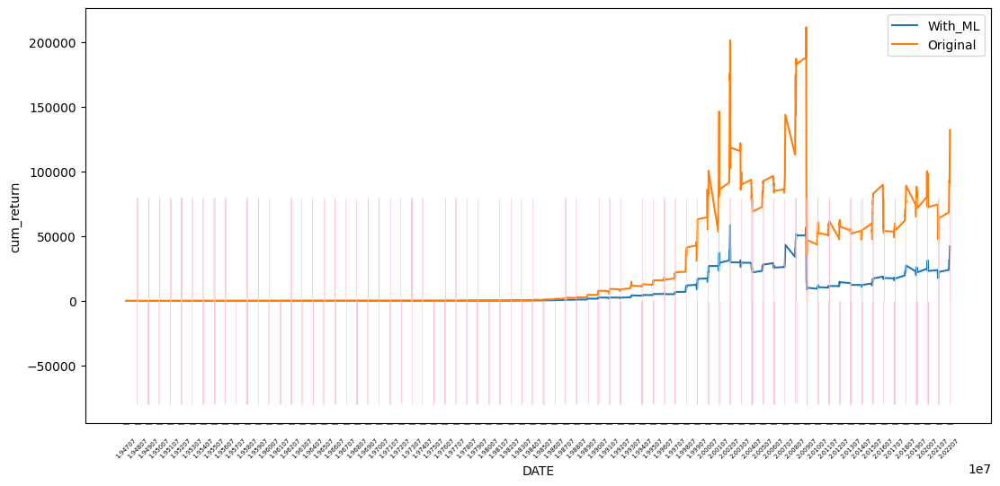

In [61]:
XGB_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_XGB_Result,
                                                 WML,
                                                 'XGB_PRED_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.67962

최근 누적 수익률

  2022년-12월 -> 34998.15
  2022년-11월 -> 32101.02
  2022년-10월 -> 31760.69
  2022년-09월 -> 28993.39
  2022년-08월 -> 26741.52

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 39367.78
  2등 : 2002년-09월 -> 37421.69
  3등 : 2008년-11월 -> 36876.88
  4등 : 2009년-01월 -> 36301.79
  5등 : 2008년-12월 -> 36173.64
  6등 : 2022년-12월 -> 34998.15
  7등 : 2008년-10월 -> 33709.11
  8등 : 2008년-09월 -> 32749.90
  9등 : 2002년-07월 -> 32450.98
  10등 : 2008년-06월 -> 32296.87



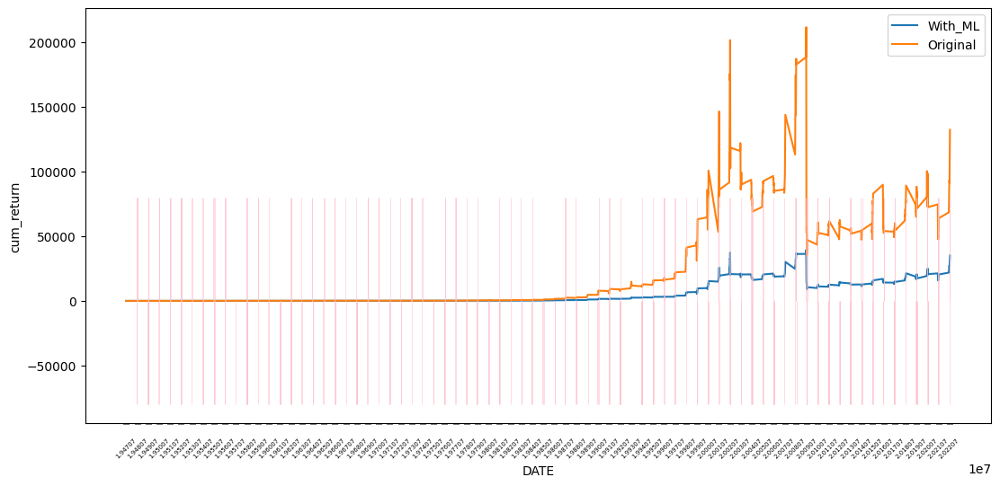

In [62]:
XGB_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_XGB_Result,
                                                 WML,
                                                 'XGB_PROB_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

### LGBM

In [63]:
LGBM_param = {}
LGBM = LGBMClassifier(**LGBM_param, random_state=42)

**************************************************

LGBM Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   boosting_type : gbdt
   class_weight : None
   colsample_bytree : 1.0
   importance_type : split
   learning_rate : 0.1
   max_depth : -1
   min_child_samples : 20
   min_child_weight : 0.001
   min_split_gain : 0.0
   n_estimators : 100
   n_jobs : -1
   num_leaves : 31
   objective : None
   random_state : 42
   reg_alpha : 0.0
   reg_lambda : 0.0
   silent : warn
   subsample : 1.0
   subsample_for_bin : 200000
   subsample_freq : 0

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.28      0.33       316
         1.0       0.67      0.77      0.71       590

    accuracy                           0.60       906
   macro avg       0.53      0.53      0.52       906
weighted avg       0.57      0.60      0.58       906


accuracy : 0.5993377483443708

precision : 0.6666666666666666

recall : 0.7694915254237288

F1-Score : 0.7143981117230527



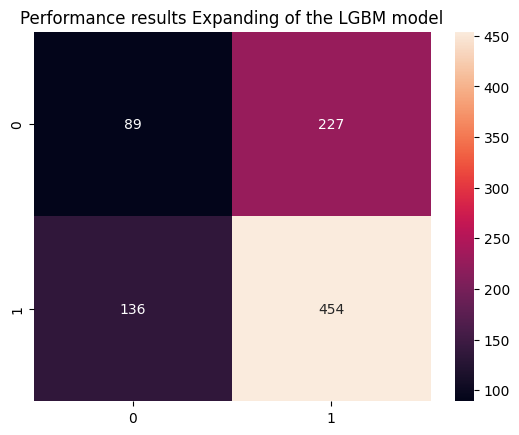


Feature Importance of the model



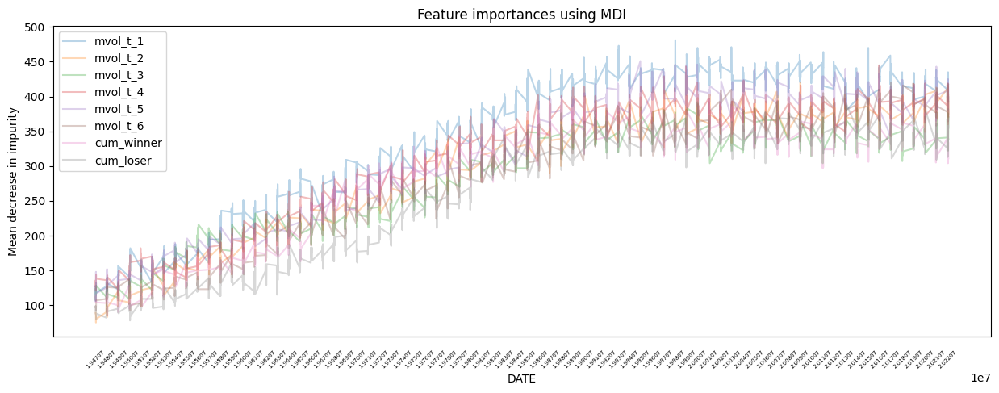

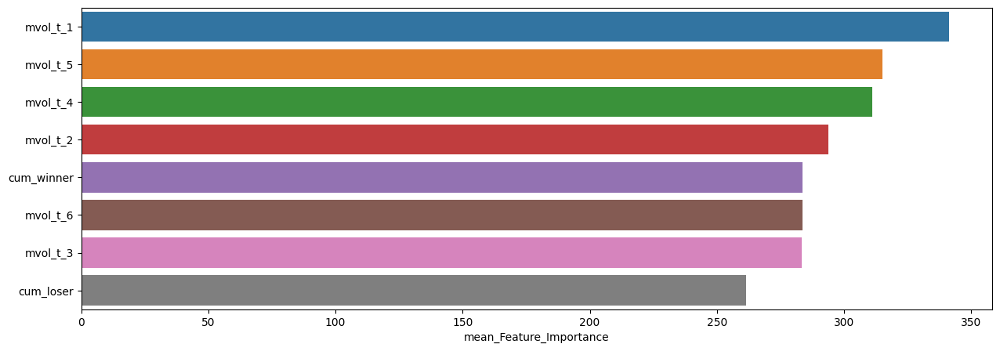

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,341.177704,481,106
mvol_t_5,314.984547,451,106
mvol_t_4,311.012141,445,114
mvol_t_2,293.675497,420,75
cum_winner,283.770419,395,86
mvol_t_6,283.488962,420,90
mvol_t_3,283.249448,393,99
cum_loser,261.418322,395,78


In [64]:
Expanding_LGBM_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                    window_size=240, # window size (훈련 데이터 셋 크기)
                                    method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                    model=LGBM, # 사용할 모델
                                    model_name='LGBM', # 사용한 모델 명
                                    plot=True, # 모델 성능 지표 시각화 여부
                                    plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.36      0.38        75
         1.0       0.70      0.74      0.72       151

    accuracy                           0.61       226
   macro avg       0.55      0.55      0.55       226
weighted avg       0.60      0.61      0.60       226


accuracy : 0.6106194690265486

precision : 0.6981132075471698

recall : 0.7350993377483444

F1-Score : 0.7161290322580645



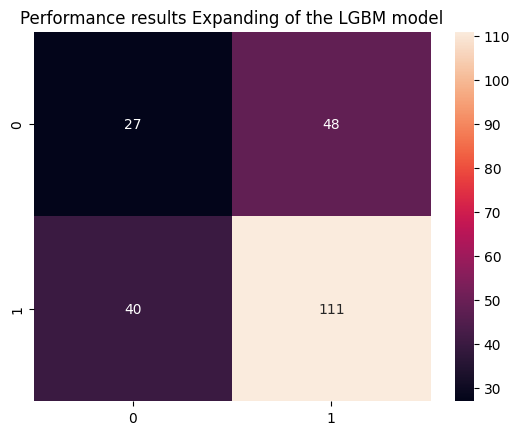


Feature Importance of the model



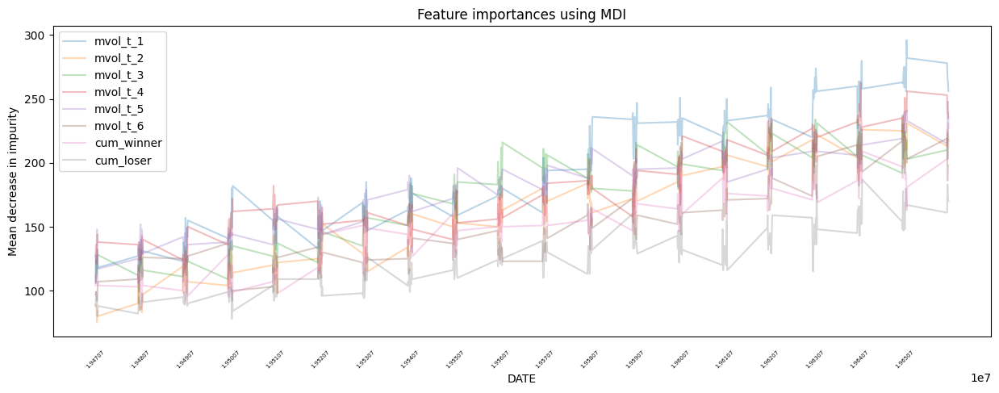

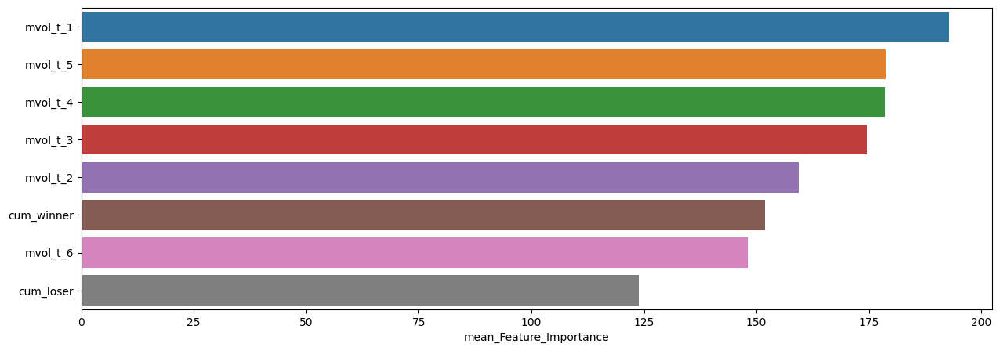

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,192.769912,296,106
mvol_t_5,178.632743,248,106
mvol_t_4,178.606195,263,114
mvol_t_3,174.482301,234,99
mvol_t_2,159.353982,231,75
cum_winner,151.902655,231,86
mvol_t_6,148.283186,237,90
cum_loser,123.977876,187,78



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.28      0.34        75
         1.0       0.69      0.81      0.75       151

    accuracy                           0.63       226
   macro avg       0.56      0.54      0.54       226
weighted avg       0.60      0.63      0.61       226


accuracy : 0.6327433628318584

precision : 0.6931818181818182

recall : 0.8079470198675497

F1-Score : 0.746177370030581



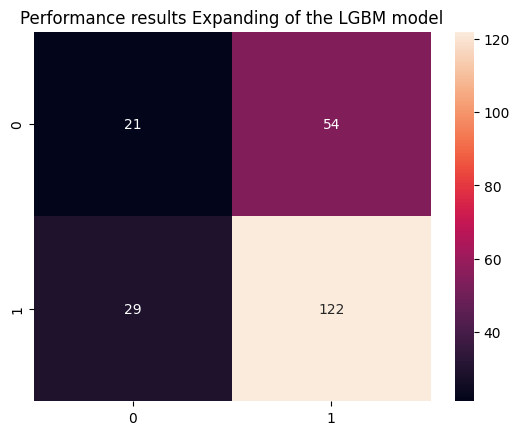


Feature Importance of the model



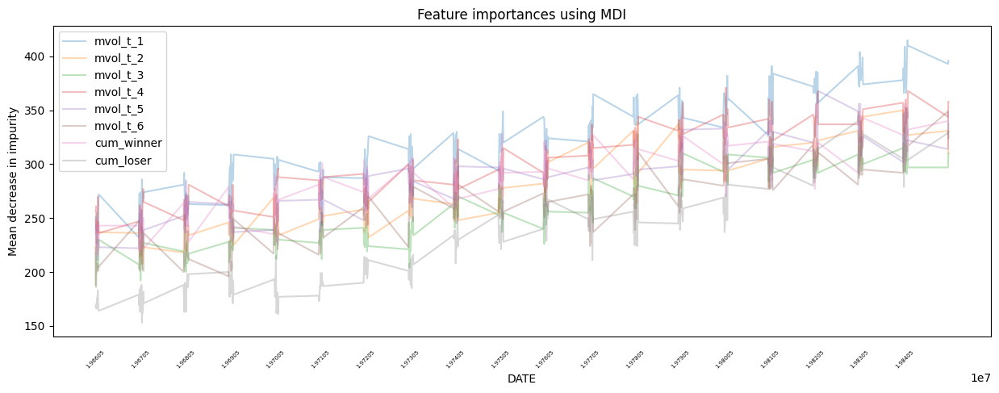

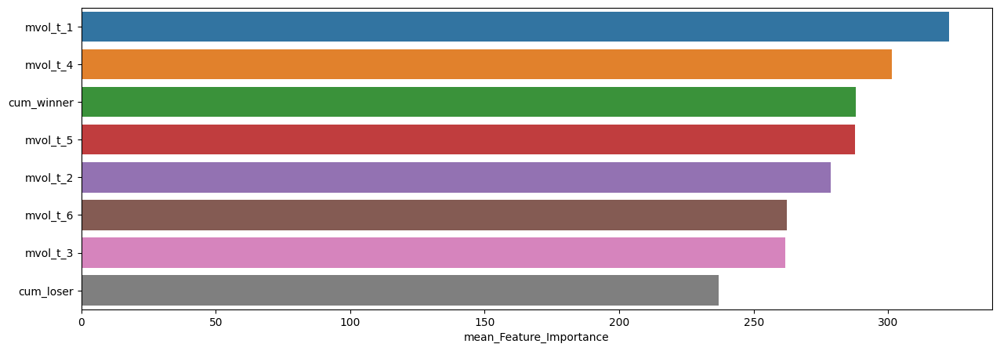

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,322.561947,415,226
mvol_t_4,301.318584,371,236
cum_winner,287.836283,356,216
mvol_t_5,287.738938,368,211
mvol_t_2,278.623894,352,208
mvol_t_6,262.393805,349,186
mvol_t_3,261.871681,340,188
cum_loser,237.110619,352,153



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.33      0.17      0.23        70
         1.0       0.69      0.85      0.76       156

    accuracy                           0.64       226
   macro avg       0.51      0.51      0.49       226
weighted avg       0.58      0.64      0.60       226


accuracy : 0.6371681415929203

precision : 0.6947368421052632

recall : 0.8461538461538461

F1-Score : 0.7630057803468209



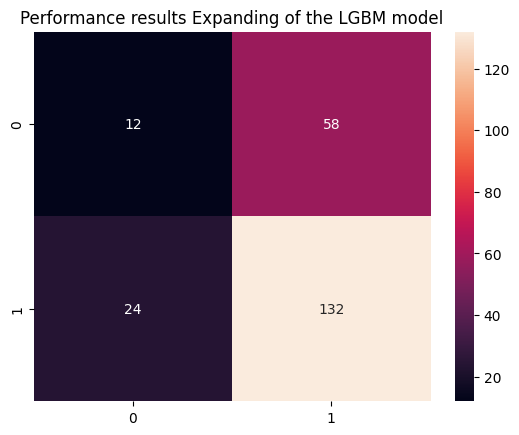


Feature Importance of the model



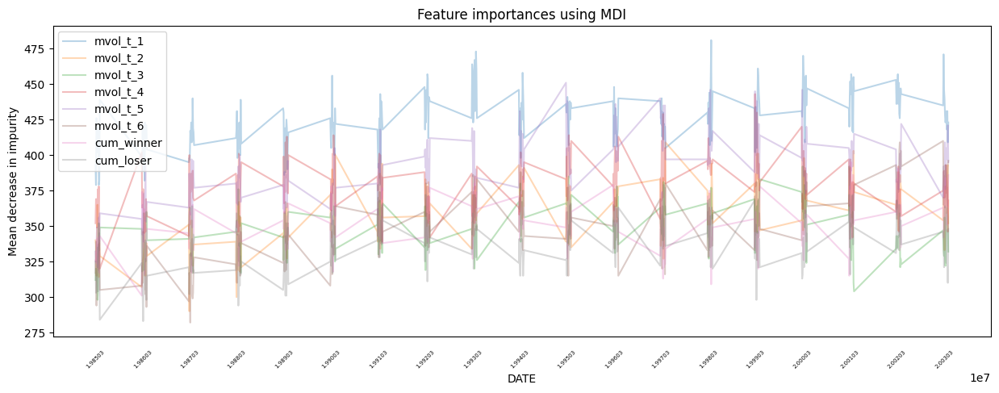

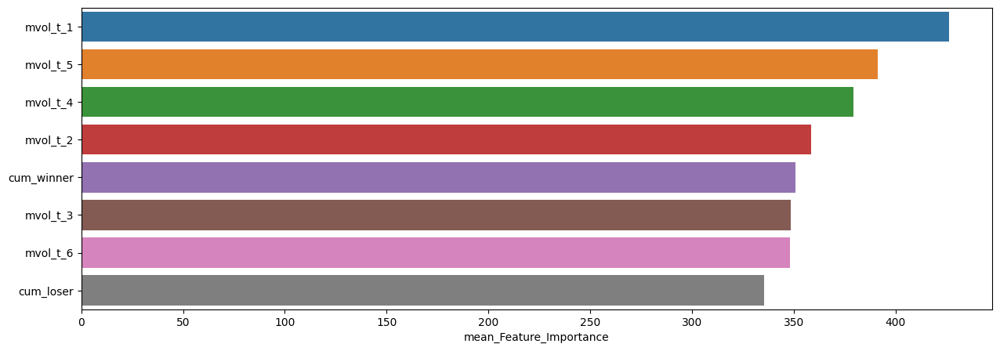

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,426.115044,481,379
mvol_t_5,391.327434,451,321
mvol_t_4,379.123894,443,320
mvol_t_2,358.584071,409,290
cum_winner,350.769912,395,301
mvol_t_3,348.522124,392,298
mvol_t_6,348.141593,410,282
cum_loser,335.508850,379,283



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.30      0.35        96
         1.0       0.57      0.67      0.62       132

    accuracy                           0.52       228
   macro avg       0.49      0.49      0.48       228
weighted avg       0.50      0.52      0.50       228


accuracy : 0.5175438596491229

precision : 0.5705128205128205

recall : 0.6742424242424242

F1-Score : 0.6180555555555556



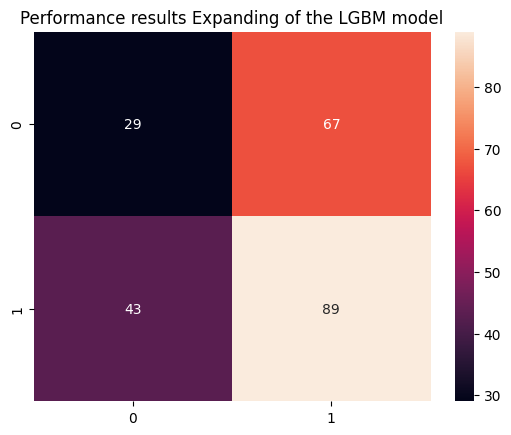


Feature Importance of the model



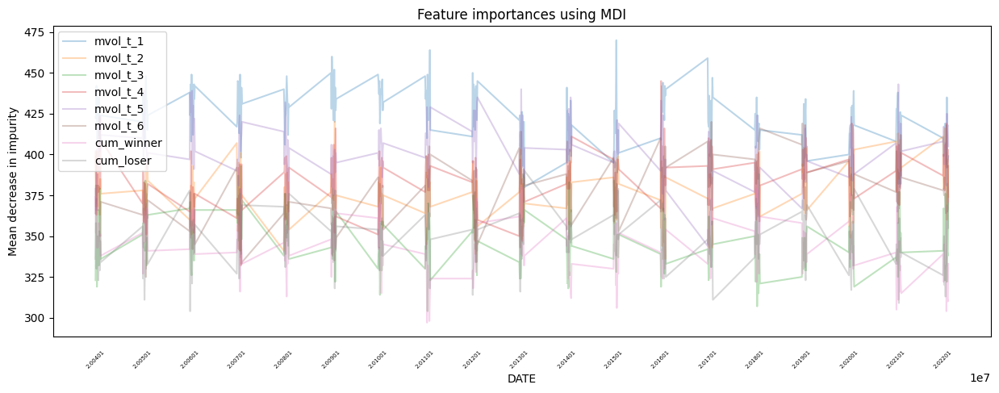

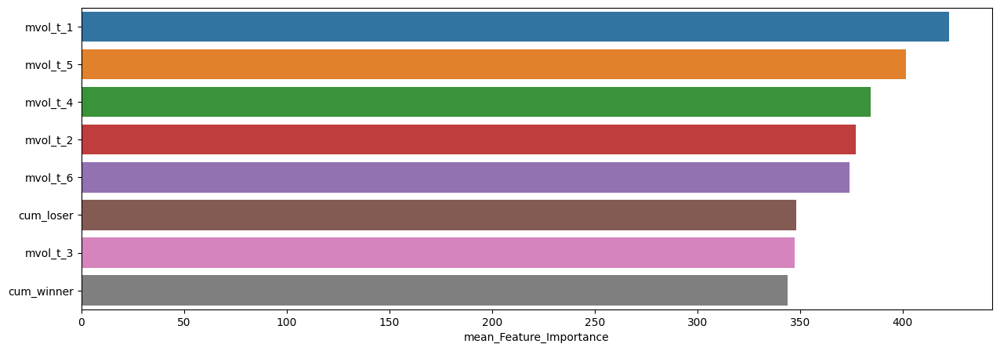

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,422.543860,470,363
mvol_t_5,401.473684,443,344
mvol_t_4,384.350877,445,332
mvol_t_2,377.399123,420,336
mvol_t_6,374.333333,420,325
cum_loser,348.307018,395,304
mvol_t_3,347.552632,393,304
cum_winner,344.039474,380,297


In [65]:
slice_feature_importance(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                        4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                        'Expanding', # Rolling Windows Method
                        'LGBM') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



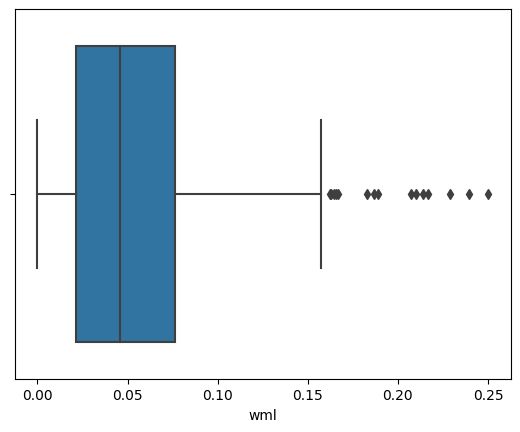

,count,mean,std,min,25%,50%,75%,max
wml,454.0,0.055066,0.044698,0.000007,0.02139,0.045751,0.076237,0.250175



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



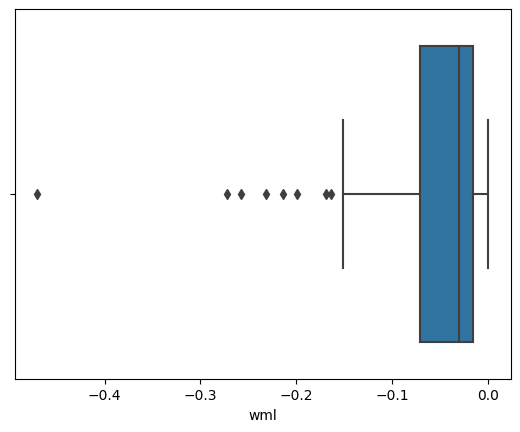

,count,mean,std,min,25%,50%,75%,max
wml,89.0,-0.061318,0.074632,-0.469903,-0.071639,-0.030902,-0.015928,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



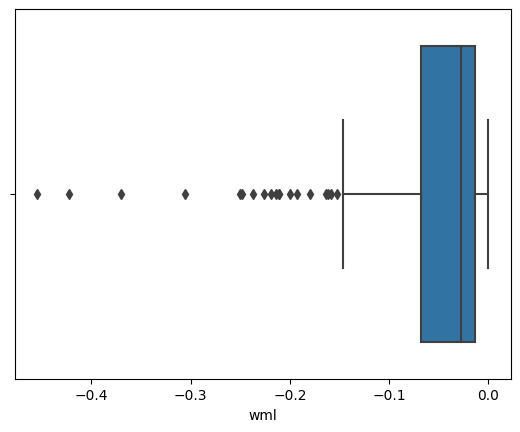

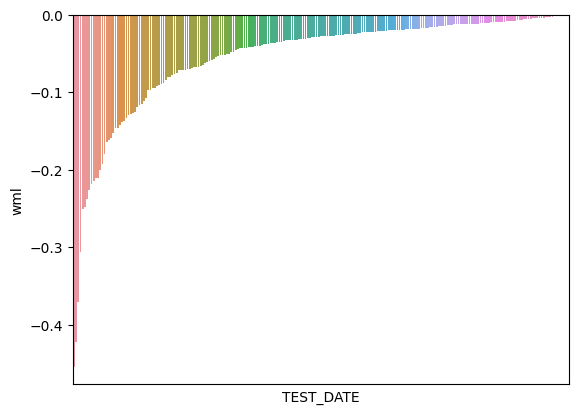

,count,mean,std,min,25%,50%,75%,max
wml,227.0,-0.054348,0.06993,-0.454349,-0.067542,-0.027674,-0.013826,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



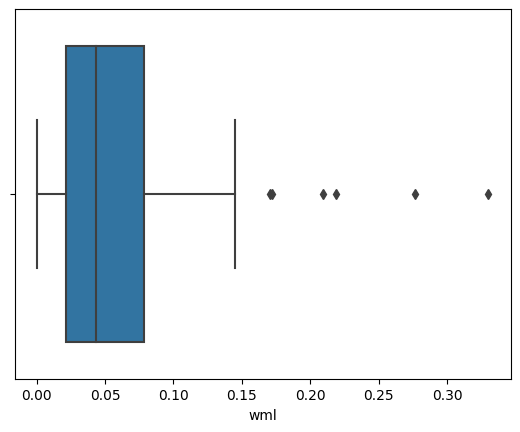

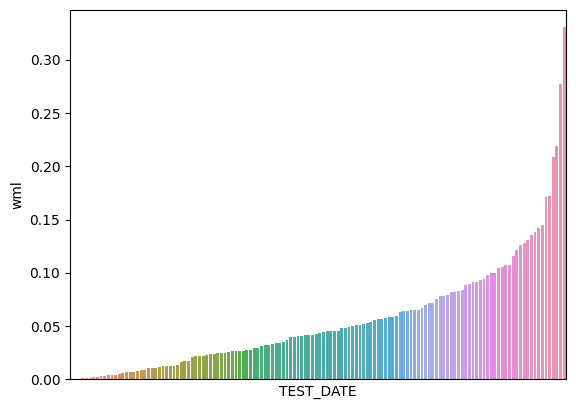

,count,mean,std,min,25%,50%,75%,max
wml,136.0,0.055863,0.053441,0.000577,0.021843,0.043162,0.078169,0.330163


In [66]:
LGBM_A0_P1, LGBM_A1_P0 = What_Pred(Expanding_LGBM_Result,
                                   WML,
                                   'LGBM')

Sharpe Ratio : 0.65860

최근 누적 수익률

  2022년-12월 -> 37288.19
  2022년-11월 -> 33595.91
  2022년-10월 -> 33595.91
  2022년-09월 -> 29748.64
  2022년-08월 -> 29748.64

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 55825.25
  2등 : 2009년-02월 -> 53939.40
  3등 : 2008년-11월 -> 49193.72
  4등 : 2002년-07월 -> 48611.85
  5등 : 2009년-01월 -> 48029.33
  6등 : 2008년-12월 -> 48029.33
  7등 : 2002년-08월 -> 47203.50
  8등 : 2002년-06월 -> 46090.50
  9등 : 2007년-12월 -> 45059.09
  10등 : 2002년-10월 -> 45042.60



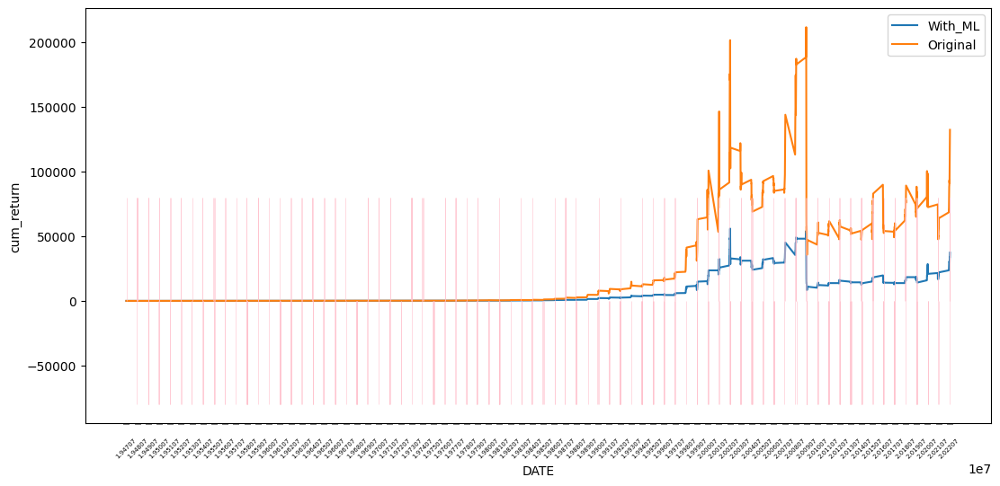

In [67]:
LGBM_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PRED_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

Sharpe Ratio : 0.68639

최근 누적 수익률

  2022년-12월 -> 25198.22
  2022년-11월 -> 23513.53
  2022년-10월 -> 23194.56
  2022년-09월 -> 20985.27
  2022년-08월 -> 20140.86

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 33515.34
  2등 : 2008년-11월 -> 31160.94
  3등 : 2009년-01월 -> 30701.23
  4등 : 2008년-12월 -> 30492.87
  5등 : 2008년-10월 -> 28730.76
  6등 : 2008년-09월 -> 28147.06
  7등 : 2002년-09월 -> 27523.36
  8등 : 2008년-06월 -> 27381.42
  9등 : 2008년-07월 -> 26886.46
  10등 : 2008년-08월 -> 26752.26



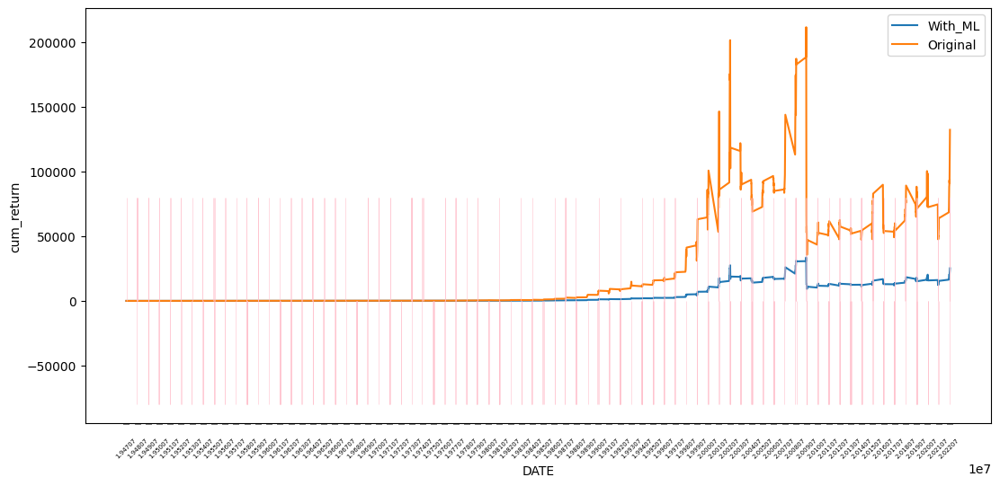

In [68]:
LGBM_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PROB_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

# Performance

## F1 - Score

RDF의 F1-Score : 0.7376543209876543
GBC의 F1-Score : 0.7126984126984127
XGB의 F1-Score : 0.7132292522596548
LGBM의 F1-Score : 0.7079934747145187



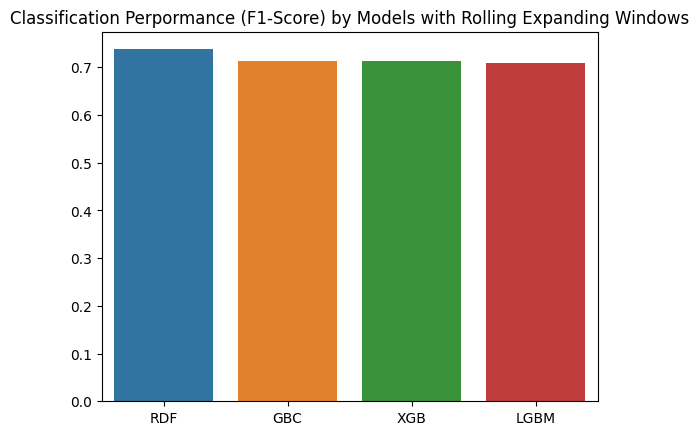

In [69]:
list_model = ['RDF', 'GBC', 'XGB', 'LGBM']
list_result = [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result]

list_f1 = []

for model, data in zip(list_model, list_result):
  F1 = f1_score(data['Actual_POS_WML'], data[f'{model}_PRED_POS_WML'])
  print(f'{model}의 F1-Score : {F1}')
  list_f1.append(F1)
print()

sns.barplot(x=list_model, y=list_f1)
plt.title('Classification Perpormance (F1-Score) by Models with Rolling Expanding Windows')
plt.show()

RDF의 F1-Score : 0.7337367624810893
GBC의 F1-Score : 0.7343867569601205
XGB의 F1-Score : 0.711783439490446
LGBM의 F1-Score : 0.7143981117230527



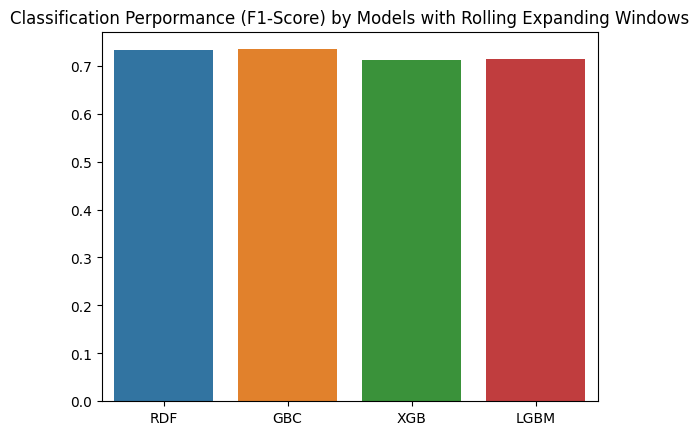

In [70]:
list_model = ['RDF', 'GBC', 'XGB', 'LGBM']
list_result = [Expanding_RDF_Result, Expanding_GBC_Result, Expanding_XGB_Result, Expanding_LGBM_Result]

list_f1 = []

for model, data in zip(list_model, list_result):
  F1 = f1_score(data['Actual_POS_WML'], data[f'{model}_PRED_POS_WML'])
  print(f'{model}의 F1-Score : {F1}')
  list_f1.append(F1)
print()

sns.barplot(x=list_model, y=list_f1)
plt.title('Classification Perpormance (F1-Score) by Models with Rolling Expanding Windows')
plt.show()

## Cum Return & Sharpe Ratio

In [71]:
R_WML = WML.loc[19470731:].copy()
CUM_WML = WML.loc[19470731:].copy()

CUM_WML['wml'] = (1 + CUM_WML.wml).cumprod() - 1
CUM_WML.columns = ['cum_return'] 

last_r = CUM_WML['cum_return'].values[-1]
w_S = (R_WML['wml'].mean()/R_WML['wml'].std()) * math.sqrt(12)

In [72]:
def compare_sharpe_ratio(list_model, list_result, list_cum, dynamic=True):

  print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format('ORG', w_S, last_r))

  for model, data, cum in zip(list_model, list_result, list_cum):
    data['wml'] = WML.loc[19470731:]['wml']

    if dynamic == True:

      data[f'{model}_PROB_WML'] = data['wml'] * data[f'{model}_PROB_POS_WML']
      S = (data[f'{model}_PROB_WML'].mean()/data[f'{model}_PROB_WML'].std())*math.sqrt(12)

      C = list(cum['cum_return'])[-1]
      print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format(model, S, C))

      sns.lineplot(data=cum, x=data.index, y='cum_return', alpha=0.7, label=model)

    else:

      data[f'{model}_PRED_WML'] = data['wml'] * data[f'{model}_PRED_POS_WML']
      S = (data[f'{model}_PRED_WML'].mean()/data[f'{model}_PRED_WML'].std())*math.sqrt(12)

      C = list(cum['cum_return'])[-1]
      print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format(model, S, C))
      
      sns.lineplot(data=cum, x=data.index, y='cum_return', alpha=0.7, label=model)

  sns.lineplot(data=CUM_WML, x=CUM_WML.index, y='cum_return', alpha=0.7, label='ORG')
  plt.title('Sharpe Ratio & Cum Return by Model')
  plt.xticks([CUM_WML.index[i] for i in range(0,len(CUM_WML.index), 12)])
  plt.tick_params(axis='x',
                    direction='out',
                    labelrotation=45,
                    length=1,
                    pad=10,
                    labelsize=1,
                    width=0.1)
  plt.show()

### Rolling Fixed Windows

#### Static

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.7445  최종 누적 수익률 : 51879.84254862678
GBC Sharpe Ratio : 0.6557  최종 누적 수익률 : 8257.150964782631
XGB Sharpe Ratio : 0.8221  최종 누적 수익률 : 80653.88104149274
LGBM Sharpe Ratio : 0.8080  최종 누적 수익률 : 76861.44791968078


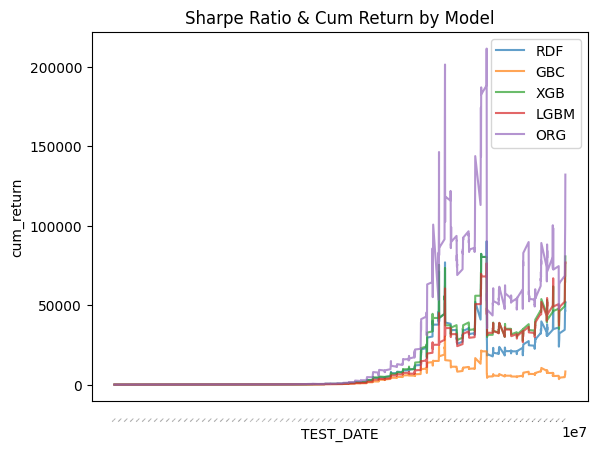

In [73]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result],
                     [RDF_F_CUM_RETURN_static, GBC_F_CUM_RETURN_static, XGB_F_CUM_RETURN_static, LGBM_F_CUM_RETURN_static],
                     dynamic=False)

#### Dynamic

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.7986  최종 누적 수익률 : 8850.608604045156
GBC Sharpe Ratio : 0.7759  최종 누적 수익률 : 9707.015885120429
XGB Sharpe Ratio : 0.8455  최종 누적 수익률 : 41680.72849486821
LGBM Sharpe Ratio : 0.8568  최종 누적 수익률 : 31184.61945794011


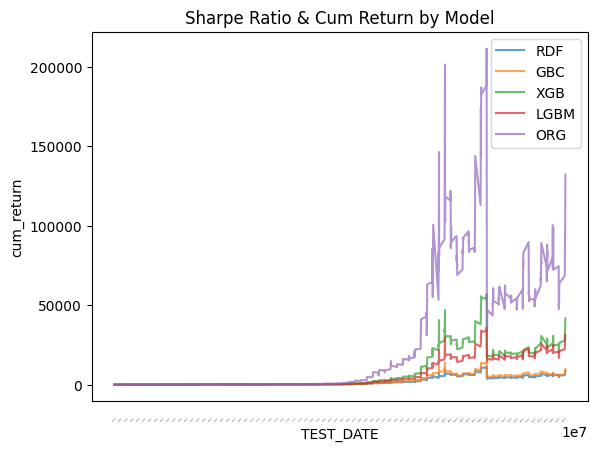

In [74]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result],
                     [RDF_F_CUM_RETURN_dynamic, GBC_F_CUM_RETURN_dynamic, XGB_F_CUM_RETURN_dynamic, LGBM_F_CUM_RETURN_dynamic],
                     dynamic=True)

### Rolling Expanding Windows

#### Static

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.8056  최종 누적 수익률 : 99453.8411439521
GBC Sharpe Ratio : 0.7953  최종 누적 수익률 : 110588.67500416479
XGB Sharpe Ratio : 0.7577  최종 누적 수익률 : 42167.744154344604
LGBM Sharpe Ratio : 0.7394  최종 누적 수익률 : 37288.19350904156


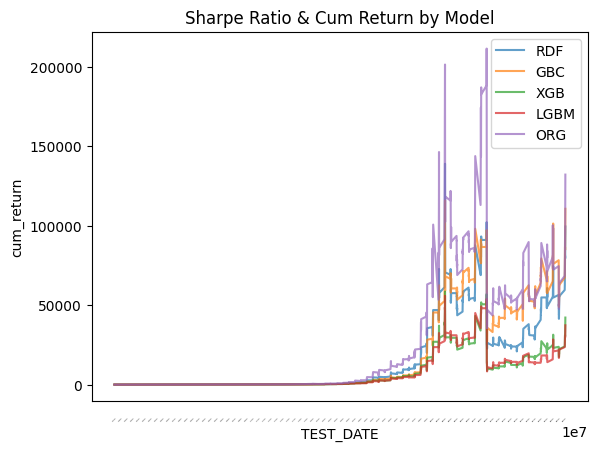

In [75]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Expanding_RDF_Result, Expanding_GBC_Result, Expanding_XGB_Result, Expanding_LGBM_Result],
                     [RDF_E_CUM_RETURN_static, GBC_E_CUM_RETURN_static, XGB_E_CUM_RETURN_static, LGBM_E_CUM_RETURN_static],
                     dynamic=False)

#### Dynamic

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.8492  최종 누적 수익률 : 12047.762234384716
GBC Sharpe Ratio : 0.8186  최종 누적 수익률 : 11725.147631861691
XGB Sharpe Ratio : 0.8263  최종 누적 수익률 : 34998.152092900855
LGBM Sharpe Ratio : 0.8261  최종 누적 수익률 : 25198.22143465108


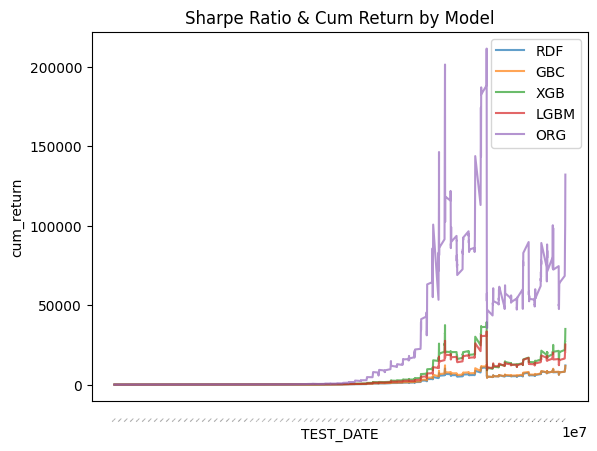

In [76]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Expanding_RDF_Result, Expanding_GBC_Result, Expanding_XGB_Result, Expanding_LGBM_Result],
                     [RDF_E_CUM_RETURN_dynamic, GBC_E_CUM_RETURN_dynamic, XGB_E_CUM_RETURN_dynamic, LGBM_E_CUM_RETURN_dynamic],
                     dynamic=True)